# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

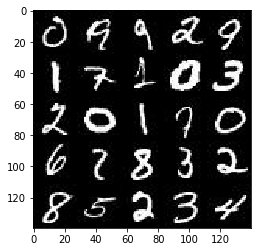

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

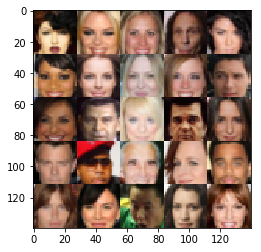

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    alpha = tf.placeholder(tf.float32, name='learning_rate')
    
    return inputs_real, inputs_z, alpha


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [7]:
# Added alpha to control Leaky Relu

def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):        
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 32, 5, strides=1, 
                              padding='same',
                              kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        
        relu1 = tf.maximum(alpha * x1, x1)
        # 28x28x32
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, 
                              padding='same',
                              kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 14x14x128
        
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=1, 
                              padding='same',
                              kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 14x14x512
        
        # Flatten it
        flat = tf.reshape(relu3, (-1, 7*7*512))
        logits = tf.layers.dense(flat, 1,
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse = not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512, 
                             kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        # 25088
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
    
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, 
                                        padding='same',
                                        kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, 
                                        padding='same',
                                        kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.nn.dropout(x3, 0.9)
        x3 = tf.maximum(alpha * x3, x3)
        # 28x28x128 now
                
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, 
                                            padding='same',
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        # 28x28xN now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.01):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    losses = []
    
    # def model_inputs(image_width, image_height, image_channels, z_dim):
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
        
    # def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=0.1)
        
    # def model_opt(d_loss, g_loss, learning_rate, beta1):
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        
        for epoch_i in range(epoch_count):
            steps = 0
            for batch_images in get_batches(batch_size):
                steps += 1
                
                # Rescale images to values between -1 -> 1
                batch_images = batch_images * 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, 
                                               input_z: batch_z,
                                               lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, 
                                               input_z: batch_z,
                                               lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, 
                                               input_z: batch_z,
                                               lr: learning_rate})

                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_real: batch_images,
                                               input_z: batch_z,
                                               lr: learning_rate})
                    
                    train_loss_g = g_loss.eval({input_real: batch_images,
                                               input_z: batch_z,
                                               lr: learning_rate})

                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 20, input_z, len(data_image_mode), data_image_mode)


        return losses

                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.9049... Generator Loss: 0.1051
Epoch 1/2... Discriminator Loss: 2.3867... Generator Loss: 0.2066
Epoch 1/2... Discriminator Loss: 2.1702... Generator Loss: 0.3162
Epoch 1/2... Discriminator Loss: 1.3390... Generator Loss: 0.5334
Epoch 1/2... Discriminator Loss: 1.1320... Generator Loss: 0.7414
Epoch 1/2... Discriminator Loss: 1.3261... Generator Loss: 0.4537
Epoch 1/2... Discriminator Loss: 1.5066... Generator Loss: 0.4875
Epoch 1/2... Discriminator Loss: 1.5630... Generator Loss: 0.4086
Epoch 1/2... Discriminator Loss: 1.5272... Generator Loss: 0.4886
Epoch 1/2... Discriminator Loss: 1.4768... Generator Loss: 0.4208


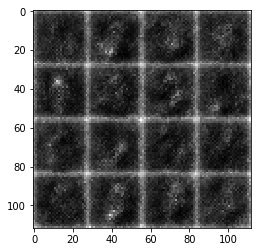

Epoch 1/2... Discriminator Loss: 1.5648... Generator Loss: 0.3573
Epoch 1/2... Discriminator Loss: 0.9298... Generator Loss: 0.8278
Epoch 1/2... Discriminator Loss: 1.0386... Generator Loss: 0.7785
Epoch 1/2... Discriminator Loss: 1.2201... Generator Loss: 0.5172
Epoch 1/2... Discriminator Loss: 1.0694... Generator Loss: 0.9992
Epoch 1/2... Discriminator Loss: 1.4954... Generator Loss: 0.4355
Epoch 1/2... Discriminator Loss: 1.3426... Generator Loss: 0.4161
Epoch 1/2... Discriminator Loss: 0.9815... Generator Loss: 0.6991
Epoch 1/2... Discriminator Loss: 1.1623... Generator Loss: 0.5665
Epoch 1/2... Discriminator Loss: 1.2845... Generator Loss: 0.5441


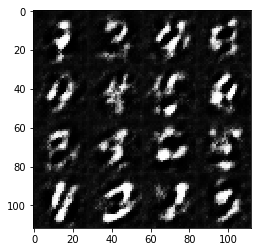

Epoch 1/2... Discriminator Loss: 1.2488... Generator Loss: 0.6935
Epoch 1/2... Discriminator Loss: 1.4413... Generator Loss: 0.4793
Epoch 1/2... Discriminator Loss: 1.4875... Generator Loss: 0.3833
Epoch 1/2... Discriminator Loss: 1.4130... Generator Loss: 1.0880
Epoch 1/2... Discriminator Loss: 1.4718... Generator Loss: 0.5243
Epoch 1/2... Discriminator Loss: 1.2400... Generator Loss: 0.6568
Epoch 1/2... Discriminator Loss: 1.4147... Generator Loss: 0.6779
Epoch 1/2... Discriminator Loss: 1.0393... Generator Loss: 0.8133
Epoch 1/2... Discriminator Loss: 1.4022... Generator Loss: 0.7755
Epoch 1/2... Discriminator Loss: 1.6375... Generator Loss: 0.3569


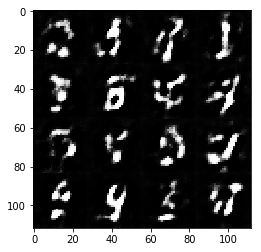

Epoch 1/2... Discriminator Loss: 1.2564... Generator Loss: 0.6391
Epoch 1/2... Discriminator Loss: 1.2011... Generator Loss: 0.7399
Epoch 1/2... Discriminator Loss: 1.4781... Generator Loss: 0.4557
Epoch 1/2... Discriminator Loss: 1.4917... Generator Loss: 0.3730
Epoch 1/2... Discriminator Loss: 1.3326... Generator Loss: 0.7225
Epoch 1/2... Discriminator Loss: 1.1538... Generator Loss: 0.7746
Epoch 1/2... Discriminator Loss: 1.1517... Generator Loss: 0.9168
Epoch 1/2... Discriminator Loss: 0.9684... Generator Loss: 0.9795
Epoch 1/2... Discriminator Loss: 1.3826... Generator Loss: 0.7188
Epoch 1/2... Discriminator Loss: 1.5233... Generator Loss: 0.4848


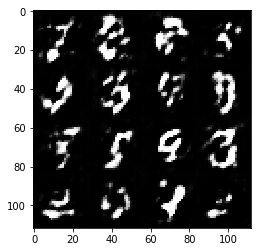

Epoch 1/2... Discriminator Loss: 1.3590... Generator Loss: 0.4473
Epoch 1/2... Discriminator Loss: 1.4602... Generator Loss: 0.5265
Epoch 1/2... Discriminator Loss: 1.3490... Generator Loss: 0.6844
Epoch 1/2... Discriminator Loss: 1.0789... Generator Loss: 0.6108
Epoch 1/2... Discriminator Loss: 1.3054... Generator Loss: 0.6503
Epoch 1/2... Discriminator Loss: 1.1633... Generator Loss: 0.8282
Epoch 1/2... Discriminator Loss: 1.2335... Generator Loss: 0.7689
Epoch 1/2... Discriminator Loss: 1.7732... Generator Loss: 0.2735
Epoch 1/2... Discriminator Loss: 1.0852... Generator Loss: 0.9281
Epoch 1/2... Discriminator Loss: 1.0816... Generator Loss: 0.8022


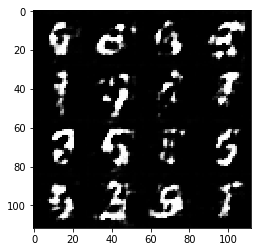

Epoch 1/2... Discriminator Loss: 1.3856... Generator Loss: 0.4286
Epoch 1/2... Discriminator Loss: 1.4517... Generator Loss: 0.4582
Epoch 1/2... Discriminator Loss: 1.0725... Generator Loss: 0.8912
Epoch 1/2... Discriminator Loss: 1.2062... Generator Loss: 0.6378
Epoch 1/2... Discriminator Loss: 1.2990... Generator Loss: 0.5258
Epoch 1/2... Discriminator Loss: 0.9803... Generator Loss: 0.7477
Epoch 1/2... Discriminator Loss: 1.3232... Generator Loss: 0.6030
Epoch 1/2... Discriminator Loss: 1.2539... Generator Loss: 0.7911
Epoch 1/2... Discriminator Loss: 1.6661... Generator Loss: 0.4226
Epoch 1/2... Discriminator Loss: 1.5594... Generator Loss: 0.4226


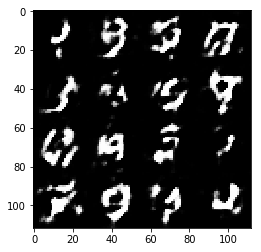

Epoch 1/2... Discriminator Loss: 1.6820... Generator Loss: 0.3962
Epoch 1/2... Discriminator Loss: 0.8540... Generator Loss: 0.9685
Epoch 1/2... Discriminator Loss: 1.1677... Generator Loss: 0.6245
Epoch 1/2... Discriminator Loss: 1.1185... Generator Loss: 0.7152
Epoch 1/2... Discriminator Loss: 1.1187... Generator Loss: 0.7581
Epoch 1/2... Discriminator Loss: 1.3474... Generator Loss: 0.7028
Epoch 1/2... Discriminator Loss: 1.1916... Generator Loss: 0.5153
Epoch 1/2... Discriminator Loss: 1.0879... Generator Loss: 0.8228
Epoch 1/2... Discriminator Loss: 1.5625... Generator Loss: 0.4168
Epoch 1/2... Discriminator Loss: 1.4814... Generator Loss: 0.5565


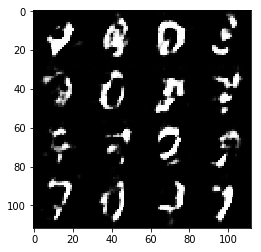

Epoch 1/2... Discriminator Loss: 1.4255... Generator Loss: 0.5839
Epoch 1/2... Discriminator Loss: 1.3785... Generator Loss: 0.5012
Epoch 1/2... Discriminator Loss: 1.3827... Generator Loss: 0.7007
Epoch 1/2... Discriminator Loss: 1.8049... Generator Loss: 0.2380
Epoch 1/2... Discriminator Loss: 1.0202... Generator Loss: 0.7471
Epoch 1/2... Discriminator Loss: 1.6428... Generator Loss: 0.3380
Epoch 1/2... Discriminator Loss: 1.8014... Generator Loss: 0.3446
Epoch 1/2... Discriminator Loss: 0.8574... Generator Loss: 0.9297
Epoch 1/2... Discriminator Loss: 1.2813... Generator Loss: 0.5608
Epoch 1/2... Discriminator Loss: 0.9884... Generator Loss: 0.8151


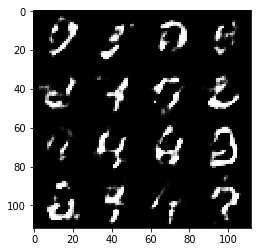

Epoch 1/2... Discriminator Loss: 1.2857... Generator Loss: 0.5861
Epoch 1/2... Discriminator Loss: 1.1225... Generator Loss: 0.5931
Epoch 1/2... Discriminator Loss: 1.1238... Generator Loss: 0.6621
Epoch 1/2... Discriminator Loss: 1.6607... Generator Loss: 0.3919
Epoch 1/2... Discriminator Loss: 1.7506... Generator Loss: 0.4355
Epoch 1/2... Discriminator Loss: 1.3246... Generator Loss: 0.6110
Epoch 1/2... Discriminator Loss: 1.4653... Generator Loss: 0.4785
Epoch 1/2... Discriminator Loss: 1.3191... Generator Loss: 0.6138
Epoch 1/2... Discriminator Loss: 1.4428... Generator Loss: 0.4023
Epoch 1/2... Discriminator Loss: 1.1035... Generator Loss: 0.7189


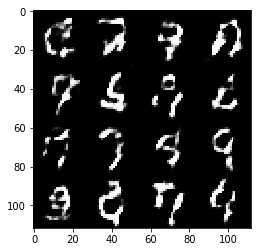

Epoch 1/2... Discriminator Loss: 1.3164... Generator Loss: 0.8637
Epoch 1/2... Discriminator Loss: 2.0114... Generator Loss: 0.2502
Epoch 1/2... Discriminator Loss: 2.0082... Generator Loss: 0.3138
Epoch 1/2... Discriminator Loss: 1.5635... Generator Loss: 0.4213
Epoch 1/2... Discriminator Loss: 1.4549... Generator Loss: 0.3989
Epoch 1/2... Discriminator Loss: 1.0005... Generator Loss: 0.7406
Epoch 1/2... Discriminator Loss: 1.3026... Generator Loss: 0.5064
Epoch 1/2... Discriminator Loss: 1.1046... Generator Loss: 0.8066
Epoch 1/2... Discriminator Loss: 0.9858... Generator Loss: 0.9076
Epoch 1/2... Discriminator Loss: 1.1864... Generator Loss: 0.6649


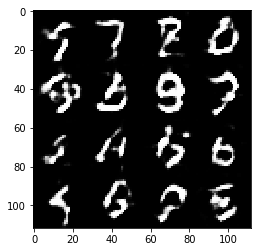

Epoch 1/2... Discriminator Loss: 1.3304... Generator Loss: 0.5832
Epoch 1/2... Discriminator Loss: 1.3030... Generator Loss: 0.6304
Epoch 1/2... Discriminator Loss: 1.5193... Generator Loss: 0.3583
Epoch 1/2... Discriminator Loss: 1.1071... Generator Loss: 0.7350
Epoch 1/2... Discriminator Loss: 1.1904... Generator Loss: 0.6390
Epoch 1/2... Discriminator Loss: 1.7110... Generator Loss: 0.3958
Epoch 1/2... Discriminator Loss: 1.2618... Generator Loss: 0.5369
Epoch 1/2... Discriminator Loss: 1.4358... Generator Loss: 0.5001
Epoch 1/2... Discriminator Loss: 1.3318... Generator Loss: 0.6291
Epoch 1/2... Discriminator Loss: 1.5657... Generator Loss: 0.4253


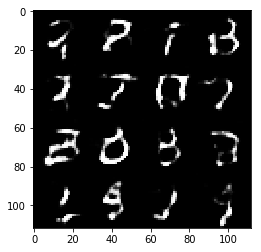

Epoch 1/2... Discriminator Loss: 1.3663... Generator Loss: 0.5560
Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 0.7177
Epoch 1/2... Discriminator Loss: 1.1988... Generator Loss: 0.5946
Epoch 1/2... Discriminator Loss: 1.9091... Generator Loss: 0.2609
Epoch 1/2... Discriminator Loss: 1.4589... Generator Loss: 0.5236
Epoch 1/2... Discriminator Loss: 1.2880... Generator Loss: 0.7044
Epoch 1/2... Discriminator Loss: 1.2233... Generator Loss: 0.5168
Epoch 1/2... Discriminator Loss: 1.4741... Generator Loss: 0.3959
Epoch 1/2... Discriminator Loss: 1.5857... Generator Loss: 0.4629
Epoch 1/2... Discriminator Loss: 1.3933... Generator Loss: 0.4234


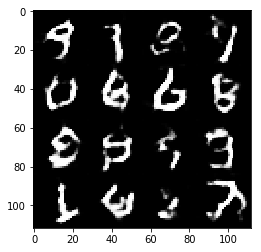

Epoch 1/2... Discriminator Loss: 1.3952... Generator Loss: 0.5652
Epoch 1/2... Discriminator Loss: 1.2742... Generator Loss: 0.5450
Epoch 1/2... Discriminator Loss: 1.2087... Generator Loss: 0.8465
Epoch 1/2... Discriminator Loss: 1.3387... Generator Loss: 0.7670
Epoch 1/2... Discriminator Loss: 1.4594... Generator Loss: 0.4059
Epoch 1/2... Discriminator Loss: 1.6422... Generator Loss: 0.4266
Epoch 1/2... Discriminator Loss: 1.2734... Generator Loss: 0.5399
Epoch 1/2... Discriminator Loss: 1.2112... Generator Loss: 0.7123
Epoch 1/2... Discriminator Loss: 1.5364... Generator Loss: 0.4768
Epoch 1/2... Discriminator Loss: 1.5600... Generator Loss: 0.3926


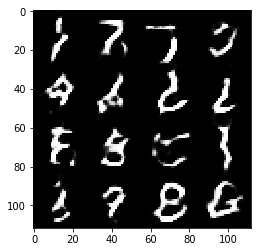

Epoch 1/2... Discriminator Loss: 1.0613... Generator Loss: 0.7961
Epoch 1/2... Discriminator Loss: 0.9943... Generator Loss: 1.2930
Epoch 1/2... Discriminator Loss: 1.6061... Generator Loss: 0.4142
Epoch 1/2... Discriminator Loss: 1.6783... Generator Loss: 0.4304
Epoch 1/2... Discriminator Loss: 1.1783... Generator Loss: 0.5915
Epoch 1/2... Discriminator Loss: 1.2647... Generator Loss: 0.9385
Epoch 1/2... Discriminator Loss: 1.3580... Generator Loss: 0.6063
Epoch 1/2... Discriminator Loss: 1.5460... Generator Loss: 0.4938
Epoch 1/2... Discriminator Loss: 1.9079... Generator Loss: 0.3099
Epoch 1/2... Discriminator Loss: 1.1570... Generator Loss: 0.6853


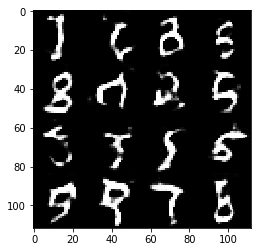

Epoch 1/2... Discriminator Loss: 1.6517... Generator Loss: 0.3758
Epoch 1/2... Discriminator Loss: 1.3391... Generator Loss: 0.4664
Epoch 1/2... Discriminator Loss: 0.9873... Generator Loss: 0.9168
Epoch 1/2... Discriminator Loss: 1.4053... Generator Loss: 0.5006
Epoch 1/2... Discriminator Loss: 1.3204... Generator Loss: 0.7679
Epoch 1/2... Discriminator Loss: 1.4296... Generator Loss: 0.5385
Epoch 1/2... Discriminator Loss: 1.1573... Generator Loss: 0.6751
Epoch 1/2... Discriminator Loss: 1.2966... Generator Loss: 0.5441
Epoch 1/2... Discriminator Loss: 1.0280... Generator Loss: 1.0966
Epoch 1/2... Discriminator Loss: 1.2875... Generator Loss: 0.5509


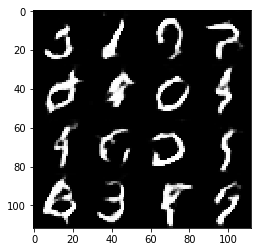

Epoch 1/2... Discriminator Loss: 1.0814... Generator Loss: 0.7353
Epoch 1/2... Discriminator Loss: 1.2387... Generator Loss: 0.6589
Epoch 1/2... Discriminator Loss: 1.4244... Generator Loss: 0.4088
Epoch 1/2... Discriminator Loss: 1.5646... Generator Loss: 0.3539
Epoch 1/2... Discriminator Loss: 1.5123... Generator Loss: 0.3935
Epoch 1/2... Discriminator Loss: 1.1846... Generator Loss: 0.7147
Epoch 1/2... Discriminator Loss: 1.2115... Generator Loss: 0.6510
Epoch 1/2... Discriminator Loss: 1.3725... Generator Loss: 0.5259
Epoch 1/2... Discriminator Loss: 1.1629... Generator Loss: 0.9677
Epoch 1/2... Discriminator Loss: 1.1679... Generator Loss: 0.8447


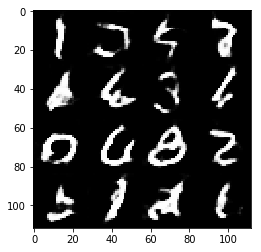

Epoch 1/2... Discriminator Loss: 1.3762... Generator Loss: 0.4074
Epoch 1/2... Discriminator Loss: 1.1919... Generator Loss: 0.7903
Epoch 1/2... Discriminator Loss: 0.7411... Generator Loss: 1.2875
Epoch 1/2... Discriminator Loss: 1.1298... Generator Loss: 0.7408
Epoch 1/2... Discriminator Loss: 1.1372... Generator Loss: 0.6548
Epoch 1/2... Discriminator Loss: 0.8558... Generator Loss: 1.2944
Epoch 1/2... Discriminator Loss: 1.2392... Generator Loss: 0.6471
Epoch 1/2... Discriminator Loss: 1.3885... Generator Loss: 0.5732
Epoch 1/2... Discriminator Loss: 1.1335... Generator Loss: 0.5897
Epoch 1/2... Discriminator Loss: 1.1673... Generator Loss: 0.5195


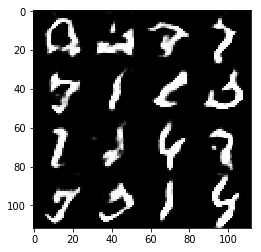

Epoch 1/2... Discriminator Loss: 0.8301... Generator Loss: 0.8115
Epoch 1/2... Discriminator Loss: 1.4123... Generator Loss: 0.5438
Epoch 1/2... Discriminator Loss: 1.2475... Generator Loss: 0.6491
Epoch 1/2... Discriminator Loss: 1.4342... Generator Loss: 0.4749
Epoch 1/2... Discriminator Loss: 1.4091... Generator Loss: 0.5044
Epoch 1/2... Discriminator Loss: 1.1303... Generator Loss: 0.8072
Epoch 1/2... Discriminator Loss: 0.9234... Generator Loss: 0.8517
Epoch 1/2... Discriminator Loss: 1.0570... Generator Loss: 0.6467
Epoch 1/2... Discriminator Loss: 1.0289... Generator Loss: 0.7208
Epoch 1/2... Discriminator Loss: 1.0570... Generator Loss: 0.7582


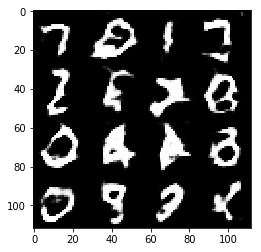

Epoch 1/2... Discriminator Loss: 1.3357... Generator Loss: 0.4789
Epoch 1/2... Discriminator Loss: 1.0628... Generator Loss: 0.7154
Epoch 1/2... Discriminator Loss: 1.1548... Generator Loss: 0.5311
Epoch 1/2... Discriminator Loss: 1.4054... Generator Loss: 0.4192
Epoch 1/2... Discriminator Loss: 1.3617... Generator Loss: 0.4757
Epoch 1/2... Discriminator Loss: 1.2077... Generator Loss: 0.6050
Epoch 1/2... Discriminator Loss: 0.8619... Generator Loss: 1.1156
Epoch 1/2... Discriminator Loss: 0.9198... Generator Loss: 0.8015
Epoch 1/2... Discriminator Loss: 1.3268... Generator Loss: 0.4886
Epoch 1/2... Discriminator Loss: 1.2591... Generator Loss: 0.7445


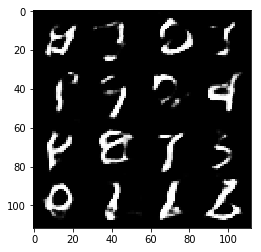

Epoch 1/2... Discriminator Loss: 0.9875... Generator Loss: 0.6942
Epoch 1/2... Discriminator Loss: 1.1950... Generator Loss: 0.5669
Epoch 1/2... Discriminator Loss: 1.0905... Generator Loss: 0.6009
Epoch 1/2... Discriminator Loss: 1.2220... Generator Loss: 0.5525
Epoch 1/2... Discriminator Loss: 0.9447... Generator Loss: 0.7953
Epoch 1/2... Discriminator Loss: 1.4719... Generator Loss: 0.3947
Epoch 1/2... Discriminator Loss: 1.6831... Generator Loss: 0.3641
Epoch 1/2... Discriminator Loss: 0.9781... Generator Loss: 0.6827
Epoch 1/2... Discriminator Loss: 1.0196... Generator Loss: 0.9041
Epoch 1/2... Discriminator Loss: 1.1437... Generator Loss: 0.6852


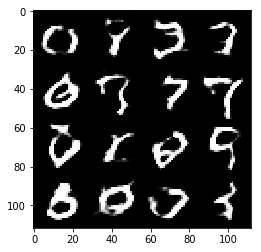

Epoch 1/2... Discriminator Loss: 1.1342... Generator Loss: 0.6409
Epoch 1/2... Discriminator Loss: 0.8041... Generator Loss: 0.8556
Epoch 1/2... Discriminator Loss: 0.8541... Generator Loss: 0.9427
Epoch 1/2... Discriminator Loss: 1.1334... Generator Loss: 0.5961
Epoch 1/2... Discriminator Loss: 1.1466... Generator Loss: 0.6615
Epoch 1/2... Discriminator Loss: 0.9502... Generator Loss: 0.9484
Epoch 1/2... Discriminator Loss: 1.4681... Generator Loss: 0.4089
Epoch 1/2... Discriminator Loss: 1.4740... Generator Loss: 0.4180
Epoch 1/2... Discriminator Loss: 1.1618... Generator Loss: 0.6540
Epoch 1/2... Discriminator Loss: 1.7249... Generator Loss: 0.3163


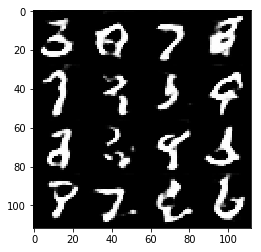

Epoch 1/2... Discriminator Loss: 1.1630... Generator Loss: 0.6701
Epoch 1/2... Discriminator Loss: 1.3474... Generator Loss: 0.4963
Epoch 1/2... Discriminator Loss: 1.0455... Generator Loss: 0.5799
Epoch 1/2... Discriminator Loss: 1.2508... Generator Loss: 0.4778
Epoch 1/2... Discriminator Loss: 0.7675... Generator Loss: 1.2003
Epoch 1/2... Discriminator Loss: 0.6550... Generator Loss: 1.6096
Epoch 1/2... Discriminator Loss: 1.1331... Generator Loss: 0.6061
Epoch 1/2... Discriminator Loss: 1.1016... Generator Loss: 1.3175
Epoch 1/2... Discriminator Loss: 1.2260... Generator Loss: 0.5754
Epoch 1/2... Discriminator Loss: 0.9191... Generator Loss: 0.9181


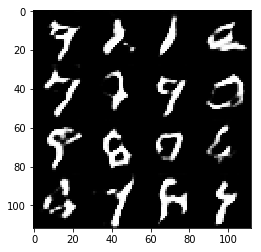

Epoch 1/2... Discriminator Loss: 1.0480... Generator Loss: 0.7894
Epoch 1/2... Discriminator Loss: 1.2230... Generator Loss: 0.4980
Epoch 1/2... Discriminator Loss: 1.2099... Generator Loss: 0.4916
Epoch 1/2... Discriminator Loss: 1.2455... Generator Loss: 0.5364
Epoch 1/2... Discriminator Loss: 0.6720... Generator Loss: 1.1181
Epoch 1/2... Discriminator Loss: 1.1515... Generator Loss: 0.7014
Epoch 1/2... Discriminator Loss: 0.8231... Generator Loss: 0.9492
Epoch 1/2... Discriminator Loss: 1.2515... Generator Loss: 0.5770
Epoch 1/2... Discriminator Loss: 1.2514... Generator Loss: 0.5735
Epoch 1/2... Discriminator Loss: 0.9974... Generator Loss: 0.8647


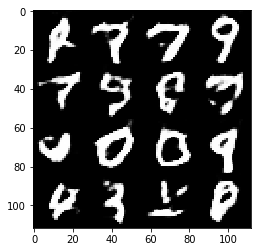

Epoch 1/2... Discriminator Loss: 0.8572... Generator Loss: 0.8862
Epoch 1/2... Discriminator Loss: 0.8148... Generator Loss: 0.9092
Epoch 1/2... Discriminator Loss: 1.5741... Generator Loss: 0.3474
Epoch 1/2... Discriminator Loss: 1.0527... Generator Loss: 0.7627
Epoch 1/2... Discriminator Loss: 1.3908... Generator Loss: 0.4754
Epoch 1/2... Discriminator Loss: 0.6734... Generator Loss: 1.0436
Epoch 1/2... Discriminator Loss: 1.0442... Generator Loss: 0.8620
Epoch 1/2... Discriminator Loss: 1.3290... Generator Loss: 0.4861
Epoch 1/2... Discriminator Loss: 0.9258... Generator Loss: 0.7927
Epoch 1/2... Discriminator Loss: 1.1163... Generator Loss: 0.7503


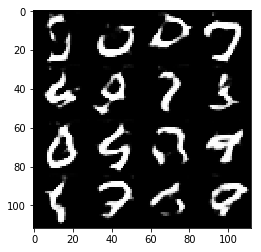

Epoch 1/2... Discriminator Loss: 1.3048... Generator Loss: 0.5407
Epoch 1/2... Discriminator Loss: 1.1313... Generator Loss: 0.6805
Epoch 1/2... Discriminator Loss: 1.4741... Generator Loss: 0.3996
Epoch 1/2... Discriminator Loss: 1.1361... Generator Loss: 0.5783
Epoch 1/2... Discriminator Loss: 1.7167... Generator Loss: 0.3812
Epoch 1/2... Discriminator Loss: 1.2981... Generator Loss: 0.4686
Epoch 1/2... Discriminator Loss: 1.2942... Generator Loss: 0.6040
Epoch 1/2... Discriminator Loss: 0.8860... Generator Loss: 0.8805
Epoch 1/2... Discriminator Loss: 1.1040... Generator Loss: 0.6777
Epoch 1/2... Discriminator Loss: 0.7840... Generator Loss: 0.9553


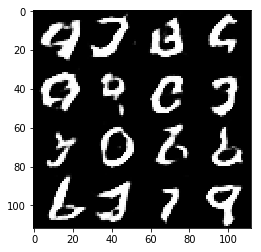

Epoch 1/2... Discriminator Loss: 1.0785... Generator Loss: 0.5758
Epoch 1/2... Discriminator Loss: 1.2295... Generator Loss: 0.6840
Epoch 1/2... Discriminator Loss: 0.6109... Generator Loss: 1.2645
Epoch 1/2... Discriminator Loss: 0.9840... Generator Loss: 0.7863
Epoch 1/2... Discriminator Loss: 0.6160... Generator Loss: 1.0224
Epoch 1/2... Discriminator Loss: 0.9308... Generator Loss: 0.7393
Epoch 1/2... Discriminator Loss: 1.1131... Generator Loss: 0.6135
Epoch 1/2... Discriminator Loss: 0.8417... Generator Loss: 0.9473
Epoch 1/2... Discriminator Loss: 1.1969... Generator Loss: 0.6499
Epoch 1/2... Discriminator Loss: 0.8813... Generator Loss: 0.9813


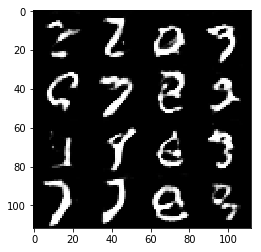

Epoch 1/2... Discriminator Loss: 0.9949... Generator Loss: 0.7122
Epoch 1/2... Discriminator Loss: 1.1473... Generator Loss: 0.5619
Epoch 1/2... Discriminator Loss: 1.1526... Generator Loss: 0.6576
Epoch 1/2... Discriminator Loss: 1.2934... Generator Loss: 0.5453
Epoch 1/2... Discriminator Loss: 0.8341... Generator Loss: 1.2604
Epoch 1/2... Discriminator Loss: 0.9515... Generator Loss: 0.8135
Epoch 1/2... Discriminator Loss: 0.8507... Generator Loss: 1.0690
Epoch 1/2... Discriminator Loss: 1.2850... Generator Loss: 0.7220
Epoch 1/2... Discriminator Loss: 1.5566... Generator Loss: 0.4861
Epoch 1/2... Discriminator Loss: 1.3577... Generator Loss: 0.5121


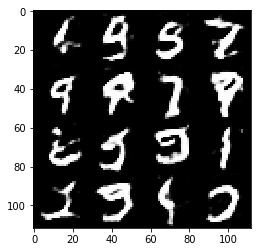

Epoch 1/2... Discriminator Loss: 1.0154... Generator Loss: 0.7425
Epoch 1/2... Discriminator Loss: 0.9722... Generator Loss: 0.9639
Epoch 1/2... Discriminator Loss: 1.0358... Generator Loss: 0.9819
Epoch 1/2... Discriminator Loss: 0.8133... Generator Loss: 1.0008
Epoch 1/2... Discriminator Loss: 1.1280... Generator Loss: 0.8034
Epoch 1/2... Discriminator Loss: 1.1157... Generator Loss: 0.5497
Epoch 1/2... Discriminator Loss: 1.4006... Generator Loss: 0.4827
Epoch 1/2... Discriminator Loss: 0.8547... Generator Loss: 0.7973
Epoch 1/2... Discriminator Loss: 1.2947... Generator Loss: 0.5890
Epoch 1/2... Discriminator Loss: 1.2460... Generator Loss: 0.7003


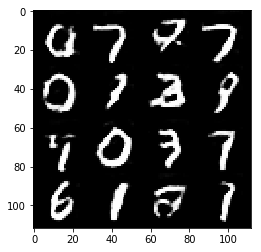

Epoch 1/2... Discriminator Loss: 1.6524... Generator Loss: 0.5419
Epoch 1/2... Discriminator Loss: 1.2288... Generator Loss: 0.4303
Epoch 1/2... Discriminator Loss: 1.2435... Generator Loss: 0.6242
Epoch 1/2... Discriminator Loss: 1.4003... Generator Loss: 0.4438
Epoch 1/2... Discriminator Loss: 0.7394... Generator Loss: 0.9623
Epoch 1/2... Discriminator Loss: 1.2701... Generator Loss: 0.5633
Epoch 1/2... Discriminator Loss: 1.5932... Generator Loss: 0.4065
Epoch 1/2... Discriminator Loss: 1.5524... Generator Loss: 0.4870
Epoch 1/2... Discriminator Loss: 2.2856... Generator Loss: 0.1297
Epoch 1/2... Discriminator Loss: 1.0817... Generator Loss: 0.6488


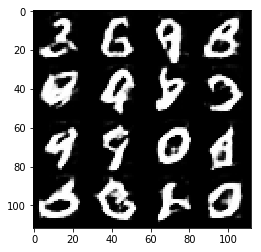

Epoch 1/2... Discriminator Loss: 0.8557... Generator Loss: 0.8803
Epoch 1/2... Discriminator Loss: 1.1441... Generator Loss: 0.8621
Epoch 1/2... Discriminator Loss: 0.9074... Generator Loss: 0.7764
Epoch 1/2... Discriminator Loss: 1.0840... Generator Loss: 0.9000
Epoch 1/2... Discriminator Loss: 1.1052... Generator Loss: 0.6781
Epoch 1/2... Discriminator Loss: 1.4710... Generator Loss: 0.4434
Epoch 1/2... Discriminator Loss: 1.1692... Generator Loss: 0.5773
Epoch 1/2... Discriminator Loss: 1.1798... Generator Loss: 0.6247
Epoch 1/2... Discriminator Loss: 1.1204... Generator Loss: 0.7799
Epoch 1/2... Discriminator Loss: 1.1156... Generator Loss: 0.5857


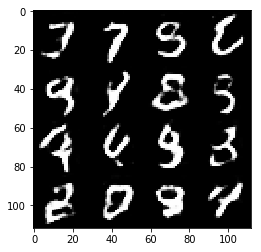

Epoch 1/2... Discriminator Loss: 1.0444... Generator Loss: 0.7619
Epoch 1/2... Discriminator Loss: 1.3090... Generator Loss: 0.5419
Epoch 1/2... Discriminator Loss: 1.7808... Generator Loss: 0.6686
Epoch 1/2... Discriminator Loss: 1.1586... Generator Loss: 0.6069
Epoch 1/2... Discriminator Loss: 1.0190... Generator Loss: 0.9841
Epoch 1/2... Discriminator Loss: 1.1646... Generator Loss: 0.5771
Epoch 1/2... Discriminator Loss: 0.9396... Generator Loss: 0.7341
Epoch 1/2... Discriminator Loss: 0.9629... Generator Loss: 0.6570
Epoch 1/2... Discriminator Loss: 1.0664... Generator Loss: 0.7370
Epoch 1/2... Discriminator Loss: 1.1063... Generator Loss: 0.7055


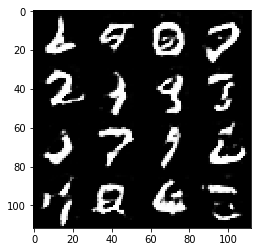

Epoch 1/2... Discriminator Loss: 1.3796... Generator Loss: 0.4957
Epoch 1/2... Discriminator Loss: 1.3282... Generator Loss: 0.5060
Epoch 1/2... Discriminator Loss: 0.6752... Generator Loss: 1.2609
Epoch 1/2... Discriminator Loss: 1.1670... Generator Loss: 0.8653
Epoch 1/2... Discriminator Loss: 1.5493... Generator Loss: 0.3905
Epoch 1/2... Discriminator Loss: 0.8719... Generator Loss: 0.9032
Epoch 1/2... Discriminator Loss: 1.0543... Generator Loss: 0.8202
Epoch 1/2... Discriminator Loss: 1.0309... Generator Loss: 0.8416
Epoch 1/2... Discriminator Loss: 1.6601... Generator Loss: 0.3158
Epoch 1/2... Discriminator Loss: 0.9647... Generator Loss: 0.9405


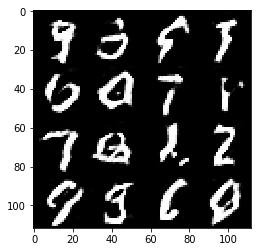

Epoch 1/2... Discriminator Loss: 0.9572... Generator Loss: 0.6827
Epoch 1/2... Discriminator Loss: 1.7159... Generator Loss: 0.3588
Epoch 1/2... Discriminator Loss: 1.0727... Generator Loss: 1.2488
Epoch 1/2... Discriminator Loss: 1.0227... Generator Loss: 1.2930
Epoch 1/2... Discriminator Loss: 1.0049... Generator Loss: 0.6621
Epoch 1/2... Discriminator Loss: 0.9970... Generator Loss: 0.8480
Epoch 1/2... Discriminator Loss: 0.9711... Generator Loss: 0.6542
Epoch 1/2... Discriminator Loss: 0.9433... Generator Loss: 0.8340
Epoch 1/2... Discriminator Loss: 0.8967... Generator Loss: 0.7485
Epoch 1/2... Discriminator Loss: 1.5134... Generator Loss: 0.3587


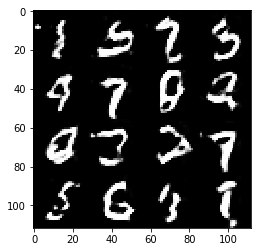

Epoch 1/2... Discriminator Loss: 1.0720... Generator Loss: 0.6834
Epoch 1/2... Discriminator Loss: 1.6277... Generator Loss: 0.3577
Epoch 1/2... Discriminator Loss: 1.4111... Generator Loss: 0.5726
Epoch 1/2... Discriminator Loss: 1.0652... Generator Loss: 0.8471
Epoch 1/2... Discriminator Loss: 1.1870... Generator Loss: 0.6831
Epoch 1/2... Discriminator Loss: 0.7580... Generator Loss: 1.0989
Epoch 1/2... Discriminator Loss: 1.2814... Generator Loss: 0.4419
Epoch 1/2... Discriminator Loss: 0.8226... Generator Loss: 0.9600
Epoch 1/2... Discriminator Loss: 1.3993... Generator Loss: 0.4565
Epoch 1/2... Discriminator Loss: 0.9364... Generator Loss: 0.8008


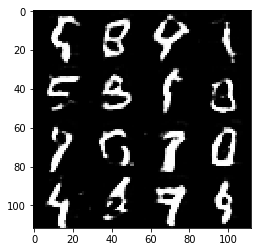

Epoch 1/2... Discriminator Loss: 1.5188... Generator Loss: 0.4625
Epoch 1/2... Discriminator Loss: 1.4100... Generator Loss: 0.5173
Epoch 1/2... Discriminator Loss: 0.7518... Generator Loss: 0.9553
Epoch 1/2... Discriminator Loss: 1.6791... Generator Loss: 0.4013
Epoch 1/2... Discriminator Loss: 1.8185... Generator Loss: 0.3361
Epoch 1/2... Discriminator Loss: 1.3859... Generator Loss: 0.4664
Epoch 1/2... Discriminator Loss: 1.1376... Generator Loss: 0.6999
Epoch 1/2... Discriminator Loss: 1.1101... Generator Loss: 0.7216
Epoch 1/2... Discriminator Loss: 1.6895... Generator Loss: 0.3716
Epoch 1/2... Discriminator Loss: 1.1285... Generator Loss: 0.5643


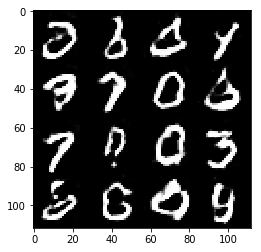

Epoch 1/2... Discriminator Loss: 1.1175... Generator Loss: 0.6548
Epoch 1/2... Discriminator Loss: 1.5614... Generator Loss: 0.4056
Epoch 1/2... Discriminator Loss: 0.9730... Generator Loss: 0.7912
Epoch 1/2... Discriminator Loss: 1.2365... Generator Loss: 0.5300
Epoch 1/2... Discriminator Loss: 1.1839... Generator Loss: 0.6998
Epoch 1/2... Discriminator Loss: 1.5869... Generator Loss: 0.3368
Epoch 1/2... Discriminator Loss: 1.3436... Generator Loss: 0.4994
Epoch 1/2... Discriminator Loss: 0.9986... Generator Loss: 0.8211
Epoch 1/2... Discriminator Loss: 1.5275... Generator Loss: 0.3600
Epoch 1/2... Discriminator Loss: 1.5627... Generator Loss: 0.4216


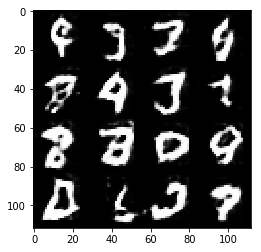

Epoch 1/2... Discriminator Loss: 1.0508... Generator Loss: 0.6965
Epoch 1/2... Discriminator Loss: 1.1112... Generator Loss: 0.5771
Epoch 1/2... Discriminator Loss: 1.7603... Generator Loss: 0.5412
Epoch 1/2... Discriminator Loss: 0.8378... Generator Loss: 0.8119
Epoch 1/2... Discriminator Loss: 0.9810... Generator Loss: 0.9754
Epoch 1/2... Discriminator Loss: 1.0059... Generator Loss: 0.8690
Epoch 1/2... Discriminator Loss: 1.3662... Generator Loss: 0.5996
Epoch 1/2... Discriminator Loss: 0.8862... Generator Loss: 0.9256
Epoch 1/2... Discriminator Loss: 1.0663... Generator Loss: 0.7531
Epoch 1/2... Discriminator Loss: 0.8368... Generator Loss: 1.0113


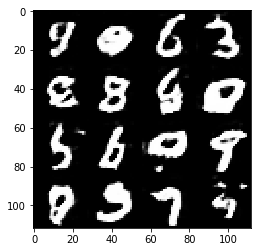

Epoch 1/2... Discriminator Loss: 1.1244... Generator Loss: 0.7102
Epoch 1/2... Discriminator Loss: 1.3108... Generator Loss: 0.5542
Epoch 1/2... Discriminator Loss: 0.7169... Generator Loss: 1.2690
Epoch 1/2... Discriminator Loss: 1.5655... Generator Loss: 0.4552
Epoch 1/2... Discriminator Loss: 1.9226... Generator Loss: 0.2232
Epoch 1/2... Discriminator Loss: 1.9013... Generator Loss: 0.2787
Epoch 1/2... Discriminator Loss: 1.2728... Generator Loss: 0.5105
Epoch 1/2... Discriminator Loss: 0.9298... Generator Loss: 0.9144
Epoch 1/2... Discriminator Loss: 1.4745... Generator Loss: 0.5510
Epoch 1/2... Discriminator Loss: 1.0076... Generator Loss: 0.9578


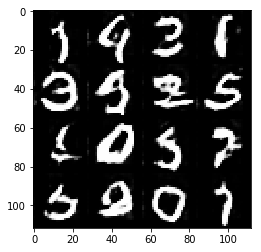

Epoch 1/2... Discriminator Loss: 1.3880... Generator Loss: 0.4419
Epoch 1/2... Discriminator Loss: 0.9751... Generator Loss: 0.7129
Epoch 1/2... Discriminator Loss: 1.1076... Generator Loss: 0.9275
Epoch 1/2... Discriminator Loss: 0.7671... Generator Loss: 1.2663
Epoch 1/2... Discriminator Loss: 1.1588... Generator Loss: 0.6634
Epoch 1/2... Discriminator Loss: 1.2508... Generator Loss: 0.7354
Epoch 1/2... Discriminator Loss: 0.9778... Generator Loss: 0.9901
Epoch 1/2... Discriminator Loss: 0.7553... Generator Loss: 0.8800
Epoch 1/2... Discriminator Loss: 1.0451... Generator Loss: 0.8507
Epoch 1/2... Discriminator Loss: 0.8314... Generator Loss: 0.9848


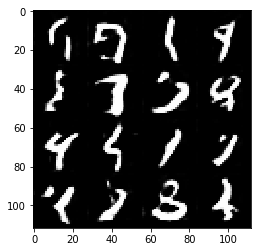

Epoch 1/2... Discriminator Loss: 1.8459... Generator Loss: 0.3309
Epoch 1/2... Discriminator Loss: 1.2928... Generator Loss: 0.7229
Epoch 1/2... Discriminator Loss: 1.3905... Generator Loss: 1.1414
Epoch 1/2... Discriminator Loss: 1.0137... Generator Loss: 0.6010
Epoch 1/2... Discriminator Loss: 1.1574... Generator Loss: 0.5911
Epoch 1/2... Discriminator Loss: 1.1446... Generator Loss: 0.7099
Epoch 1/2... Discriminator Loss: 1.1990... Generator Loss: 0.9223
Epoch 1/2... Discriminator Loss: 0.8100... Generator Loss: 0.9939
Epoch 1/2... Discriminator Loss: 1.1186... Generator Loss: 0.6845
Epoch 1/2... Discriminator Loss: 1.2370... Generator Loss: 0.9041


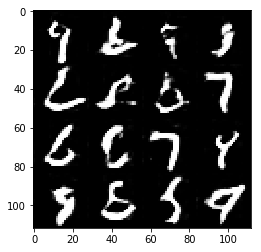

Epoch 1/2... Discriminator Loss: 1.1808... Generator Loss: 0.7502
Epoch 1/2... Discriminator Loss: 1.1088... Generator Loss: 0.6237
Epoch 1/2... Discriminator Loss: 0.7169... Generator Loss: 1.1143
Epoch 1/2... Discriminator Loss: 1.2790... Generator Loss: 0.5825
Epoch 1/2... Discriminator Loss: 1.0994... Generator Loss: 0.6306
Epoch 1/2... Discriminator Loss: 1.1066... Generator Loss: 0.5602
Epoch 1/2... Discriminator Loss: 0.9875... Generator Loss: 0.7010
Epoch 1/2... Discriminator Loss: 0.7422... Generator Loss: 1.0366
Epoch 1/2... Discriminator Loss: 0.8107... Generator Loss: 0.8980
Epoch 1/2... Discriminator Loss: 1.4592... Generator Loss: 0.5193


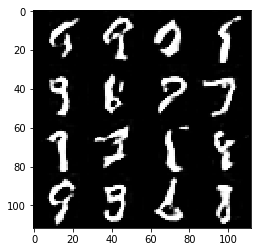

Epoch 1/2... Discriminator Loss: 1.3373... Generator Loss: 0.4999
Epoch 1/2... Discriminator Loss: 0.6429... Generator Loss: 1.3493
Epoch 1/2... Discriminator Loss: 1.6307... Generator Loss: 0.7666
Epoch 1/2... Discriminator Loss: 1.1013... Generator Loss: 0.6156
Epoch 1/2... Discriminator Loss: 1.4879... Generator Loss: 0.4801
Epoch 1/2... Discriminator Loss: 1.2505... Generator Loss: 0.7906
Epoch 1/2... Discriminator Loss: 0.8447... Generator Loss: 1.1594
Epoch 1/2... Discriminator Loss: 1.0296... Generator Loss: 0.9274
Epoch 1/2... Discriminator Loss: 1.1198... Generator Loss: 0.7079
Epoch 1/2... Discriminator Loss: 0.9027... Generator Loss: 0.8689


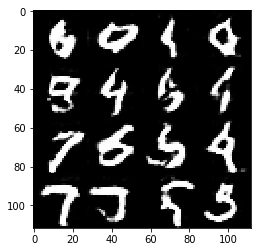

Epoch 1/2... Discriminator Loss: 1.0943... Generator Loss: 0.8201
Epoch 1/2... Discriminator Loss: 2.0378... Generator Loss: 0.2432
Epoch 1/2... Discriminator Loss: 0.9463... Generator Loss: 0.6907
Epoch 1/2... Discriminator Loss: 0.8784... Generator Loss: 1.1764
Epoch 1/2... Discriminator Loss: 1.4289... Generator Loss: 0.5558
Epoch 1/2... Discriminator Loss: 2.3367... Generator Loss: 0.2340
Epoch 1/2... Discriminator Loss: 0.8427... Generator Loss: 0.8493
Epoch 1/2... Discriminator Loss: 0.7933... Generator Loss: 0.8239
Epoch 1/2... Discriminator Loss: 1.0718... Generator Loss: 0.6769
Epoch 1/2... Discriminator Loss: 1.7235... Generator Loss: 0.3812


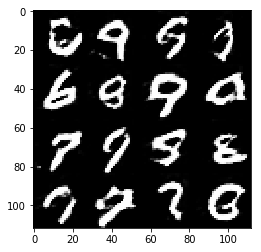

Epoch 1/2... Discriminator Loss: 1.8898... Generator Loss: 0.3071
Epoch 1/2... Discriminator Loss: 1.2009... Generator Loss: 0.6851
Epoch 1/2... Discriminator Loss: 1.0064... Generator Loss: 1.3693
Epoch 1/2... Discriminator Loss: 1.5274... Generator Loss: 0.5151
Epoch 1/2... Discriminator Loss: 0.6437... Generator Loss: 1.4361
Epoch 1/2... Discriminator Loss: 1.0028... Generator Loss: 0.9359
Epoch 1/2... Discriminator Loss: 1.3222... Generator Loss: 0.5681
Epoch 1/2... Discriminator Loss: 1.0770... Generator Loss: 0.6359
Epoch 1/2... Discriminator Loss: 2.3099... Generator Loss: 0.2104
Epoch 1/2... Discriminator Loss: 0.9833... Generator Loss: 0.9037


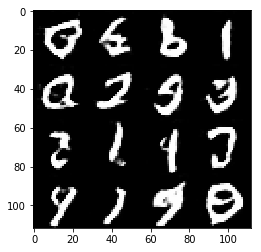

Epoch 1/2... Discriminator Loss: 1.2178... Generator Loss: 0.4979
Epoch 1/2... Discriminator Loss: 0.8911... Generator Loss: 1.0572
Epoch 1/2... Discriminator Loss: 0.7881... Generator Loss: 1.2697
Epoch 1/2... Discriminator Loss: 1.4129... Generator Loss: 0.5797
Epoch 1/2... Discriminator Loss: 1.5004... Generator Loss: 0.4211
Epoch 1/2... Discriminator Loss: 1.4650... Generator Loss: 0.6758
Epoch 1/2... Discriminator Loss: 1.3908... Generator Loss: 0.4894
Epoch 1/2... Discriminator Loss: 1.0887... Generator Loss: 0.7186
Epoch 1/2... Discriminator Loss: 1.3034... Generator Loss: 0.6792
Epoch 1/2... Discriminator Loss: 1.0040... Generator Loss: 0.8663


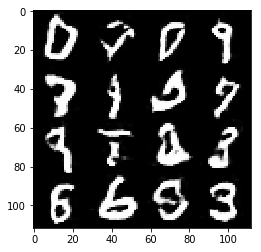

Epoch 1/2... Discriminator Loss: 1.2513... Generator Loss: 0.7159
Epoch 1/2... Discriminator Loss: 0.8656... Generator Loss: 1.2928
Epoch 1/2... Discriminator Loss: 0.9595... Generator Loss: 0.7295
Epoch 1/2... Discriminator Loss: 1.5592... Generator Loss: 0.4458
Epoch 1/2... Discriminator Loss: 1.2016... Generator Loss: 0.8175
Epoch 1/2... Discriminator Loss: 1.7573... Generator Loss: 0.4741
Epoch 1/2... Discriminator Loss: 1.9501... Generator Loss: 0.3443
Epoch 1/2... Discriminator Loss: 1.7258... Generator Loss: 0.3893
Epoch 1/2... Discriminator Loss: 1.4021... Generator Loss: 0.8133
Epoch 1/2... Discriminator Loss: 1.2308... Generator Loss: 0.5455


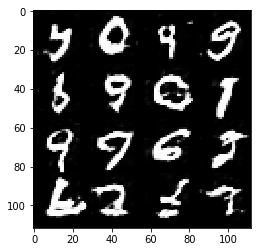

Epoch 1/2... Discriminator Loss: 0.8901... Generator Loss: 0.9576
Epoch 1/2... Discriminator Loss: 0.7735... Generator Loss: 1.0689
Epoch 1/2... Discriminator Loss: 1.1736... Generator Loss: 0.5793
Epoch 1/2... Discriminator Loss: 0.7376... Generator Loss: 0.9997
Epoch 1/2... Discriminator Loss: 0.9989... Generator Loss: 0.9181
Epoch 1/2... Discriminator Loss: 0.9612... Generator Loss: 0.7720
Epoch 1/2... Discriminator Loss: 1.0046... Generator Loss: 0.9561
Epoch 1/2... Discriminator Loss: 1.0318... Generator Loss: 1.0540
Epoch 1/2... Discriminator Loss: 1.5396... Generator Loss: 0.4614
Epoch 1/2... Discriminator Loss: 1.5244... Generator Loss: 0.4309


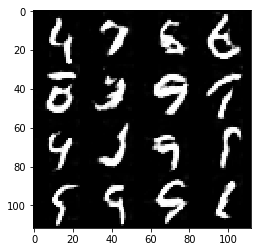

Epoch 1/2... Discriminator Loss: 1.0167... Generator Loss: 0.7542
Epoch 1/2... Discriminator Loss: 1.2140... Generator Loss: 0.7841
Epoch 1/2... Discriminator Loss: 0.5426... Generator Loss: 1.3936
Epoch 1/2... Discriminator Loss: 1.2825... Generator Loss: 0.5150
Epoch 1/2... Discriminator Loss: 0.8527... Generator Loss: 0.9348
Epoch 1/2... Discriminator Loss: 1.0028... Generator Loss: 0.7517
Epoch 1/2... Discriminator Loss: 1.1531... Generator Loss: 0.6957
Epoch 1/2... Discriminator Loss: 0.8529... Generator Loss: 0.8203
Epoch 1/2... Discriminator Loss: 0.7350... Generator Loss: 0.9644
Epoch 1/2... Discriminator Loss: 0.9586... Generator Loss: 0.6995


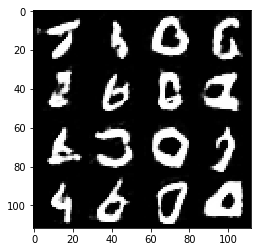

Epoch 1/2... Discriminator Loss: 1.2249... Generator Loss: 0.6765
Epoch 1/2... Discriminator Loss: 0.6495... Generator Loss: 1.4048
Epoch 1/2... Discriminator Loss: 1.6133... Generator Loss: 0.6739
Epoch 1/2... Discriminator Loss: 0.7911... Generator Loss: 1.1651
Epoch 1/2... Discriminator Loss: 0.9975... Generator Loss: 0.7201
Epoch 1/2... Discriminator Loss: 1.0433... Generator Loss: 0.7640
Epoch 1/2... Discriminator Loss: 1.0757... Generator Loss: 0.9467
Epoch 1/2... Discriminator Loss: 0.7201... Generator Loss: 1.2113
Epoch 1/2... Discriminator Loss: 1.3096... Generator Loss: 0.7442
Epoch 1/2... Discriminator Loss: 0.7848... Generator Loss: 1.2587


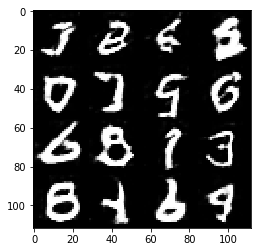

Epoch 1/2... Discriminator Loss: 1.3674... Generator Loss: 0.5076
Epoch 1/2... Discriminator Loss: 0.9075... Generator Loss: 0.9980
Epoch 1/2... Discriminator Loss: 0.7494... Generator Loss: 1.5720
Epoch 1/2... Discriminator Loss: 1.1613... Generator Loss: 0.8062
Epoch 1/2... Discriminator Loss: 1.5806... Generator Loss: 0.4006
Epoch 1/2... Discriminator Loss: 1.6771... Generator Loss: 0.4450
Epoch 1/2... Discriminator Loss: 1.1675... Generator Loss: 0.7270
Epoch 1/2... Discriminator Loss: 0.7389... Generator Loss: 0.8559
Epoch 1/2... Discriminator Loss: 0.8784... Generator Loss: 1.0815
Epoch 1/2... Discriminator Loss: 1.4645... Generator Loss: 0.4558


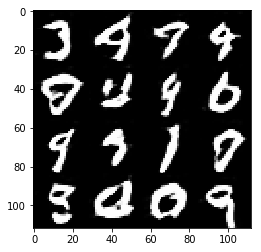

Epoch 1/2... Discriminator Loss: 0.9739... Generator Loss: 1.0656
Epoch 1/2... Discriminator Loss: 1.2373... Generator Loss: 0.6092
Epoch 1/2... Discriminator Loss: 1.2422... Generator Loss: 0.4991
Epoch 1/2... Discriminator Loss: 0.6628... Generator Loss: 1.2013
Epoch 1/2... Discriminator Loss: 1.1951... Generator Loss: 0.6924
Epoch 1/2... Discriminator Loss: 1.1499... Generator Loss: 0.7779
Epoch 1/2... Discriminator Loss: 0.7654... Generator Loss: 1.0146
Epoch 1/2... Discriminator Loss: 1.6275... Generator Loss: 0.3318
Epoch 1/2... Discriminator Loss: 1.3533... Generator Loss: 0.6156
Epoch 1/2... Discriminator Loss: 1.5333... Generator Loss: 0.6149


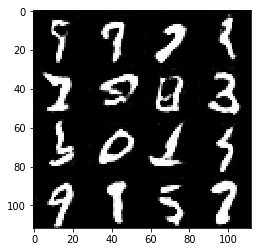

Epoch 1/2... Discriminator Loss: 0.9336... Generator Loss: 0.9840
Epoch 1/2... Discriminator Loss: 0.8930... Generator Loss: 0.8905
Epoch 1/2... Discriminator Loss: 1.2122... Generator Loss: 0.6628
Epoch 1/2... Discriminator Loss: 1.3126... Generator Loss: 0.5714
Epoch 1/2... Discriminator Loss: 1.1572... Generator Loss: 0.9255
Epoch 1/2... Discriminator Loss: 0.8027... Generator Loss: 0.9914
Epoch 1/2... Discriminator Loss: 1.0364... Generator Loss: 1.0829
Epoch 1/2... Discriminator Loss: 1.0246... Generator Loss: 0.7440
Epoch 1/2... Discriminator Loss: 0.8229... Generator Loss: 1.0303
Epoch 1/2... Discriminator Loss: 1.0480... Generator Loss: 0.5956


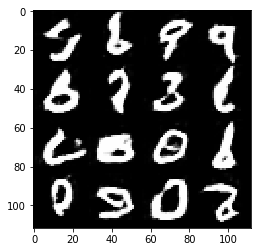

Epoch 1/2... Discriminator Loss: 0.6959... Generator Loss: 1.0729
Epoch 1/2... Discriminator Loss: 1.5557... Generator Loss: 0.4095
Epoch 1/2... Discriminator Loss: 0.9975... Generator Loss: 0.9364
Epoch 1/2... Discriminator Loss: 0.9033... Generator Loss: 0.7374
Epoch 1/2... Discriminator Loss: 1.3152... Generator Loss: 0.5903
Epoch 1/2... Discriminator Loss: 1.2183... Generator Loss: 0.7131
Epoch 1/2... Discriminator Loss: 0.7098... Generator Loss: 1.1770
Epoch 1/2... Discriminator Loss: 0.6635... Generator Loss: 1.2851
Epoch 1/2... Discriminator Loss: 1.0119... Generator Loss: 0.8297
Epoch 1/2... Discriminator Loss: 1.1198... Generator Loss: 0.8417


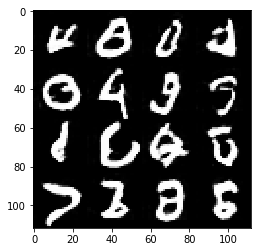

Epoch 1/2... Discriminator Loss: 1.2222... Generator Loss: 0.5540
Epoch 1/2... Discriminator Loss: 0.9594... Generator Loss: 0.8754
Epoch 1/2... Discriminator Loss: 1.2309... Generator Loss: 0.6481
Epoch 1/2... Discriminator Loss: 1.1604... Generator Loss: 0.6029
Epoch 1/2... Discriminator Loss: 1.1815... Generator Loss: 0.6636
Epoch 1/2... Discriminator Loss: 0.7648... Generator Loss: 0.9164
Epoch 1/2... Discriminator Loss: 1.0441... Generator Loss: 0.8999
Epoch 1/2... Discriminator Loss: 0.8711... Generator Loss: 0.9181
Epoch 1/2... Discriminator Loss: 1.3302... Generator Loss: 0.6574
Epoch 1/2... Discriminator Loss: 1.0170... Generator Loss: 0.9577


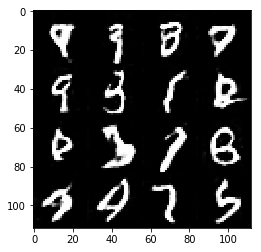

Epoch 1/2... Discriminator Loss: 1.1616... Generator Loss: 0.6185
Epoch 1/2... Discriminator Loss: 1.5493... Generator Loss: 0.5335
Epoch 1/2... Discriminator Loss: 2.4292... Generator Loss: 0.1770
Epoch 1/2... Discriminator Loss: 1.0586... Generator Loss: 0.8965
Epoch 1/2... Discriminator Loss: 1.3343... Generator Loss: 0.6764
Epoch 1/2... Discriminator Loss: 1.2592... Generator Loss: 0.7596
Epoch 1/2... Discriminator Loss: 1.3157... Generator Loss: 0.4471
Epoch 1/2... Discriminator Loss: 1.8290... Generator Loss: 0.2795
Epoch 1/2... Discriminator Loss: 1.2935... Generator Loss: 0.5220
Epoch 1/2... Discriminator Loss: 1.3147... Generator Loss: 0.4858


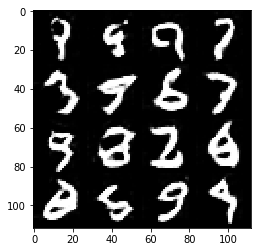

Epoch 1/2... Discriminator Loss: 0.7106... Generator Loss: 1.1618
Epoch 1/2... Discriminator Loss: 1.1980... Generator Loss: 0.5361
Epoch 1/2... Discriminator Loss: 1.3084... Generator Loss: 0.5867
Epoch 1/2... Discriminator Loss: 0.6362... Generator Loss: 1.3445
Epoch 1/2... Discriminator Loss: 0.8102... Generator Loss: 1.0449
Epoch 1/2... Discriminator Loss: 0.9439... Generator Loss: 0.9478
Epoch 1/2... Discriminator Loss: 1.2913... Generator Loss: 0.5237
Epoch 1/2... Discriminator Loss: 1.0761... Generator Loss: 0.7346
Epoch 1/2... Discriminator Loss: 0.9463... Generator Loss: 0.9312
Epoch 1/2... Discriminator Loss: 0.9425... Generator Loss: 0.8925


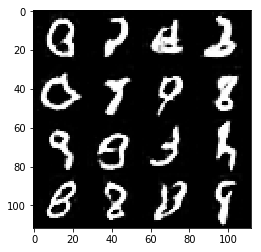

Epoch 1/2... Discriminator Loss: 1.3084... Generator Loss: 0.6302
Epoch 1/2... Discriminator Loss: 0.9370... Generator Loss: 0.9853
Epoch 1/2... Discriminator Loss: 1.8778... Generator Loss: 0.7855
Epoch 1/2... Discriminator Loss: 0.8153... Generator Loss: 1.3300
Epoch 1/2... Discriminator Loss: 1.1176... Generator Loss: 0.8230
Epoch 1/2... Discriminator Loss: 1.2082... Generator Loss: 0.7272
Epoch 1/2... Discriminator Loss: 1.0869... Generator Loss: 0.8481
Epoch 1/2... Discriminator Loss: 0.8008... Generator Loss: 1.1145
Epoch 1/2... Discriminator Loss: 1.0489... Generator Loss: 0.6603
Epoch 1/2... Discriminator Loss: 1.0147... Generator Loss: 1.0281


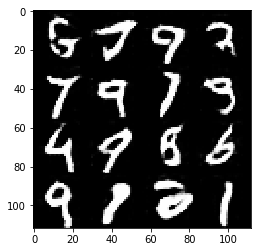

Epoch 1/2... Discriminator Loss: 1.0188... Generator Loss: 0.6582
Epoch 1/2... Discriminator Loss: 1.3871... Generator Loss: 0.5782
Epoch 1/2... Discriminator Loss: 1.8531... Generator Loss: 0.3921
Epoch 1/2... Discriminator Loss: 0.9436... Generator Loss: 0.9660
Epoch 1/2... Discriminator Loss: 1.2484... Generator Loss: 0.5825
Epoch 1/2... Discriminator Loss: 1.1703... Generator Loss: 0.5726
Epoch 1/2... Discriminator Loss: 1.6653... Generator Loss: 0.5080
Epoch 1/2... Discriminator Loss: 1.3993... Generator Loss: 0.5506
Epoch 1/2... Discriminator Loss: 1.0226... Generator Loss: 1.2082
Epoch 1/2... Discriminator Loss: 1.5391... Generator Loss: 0.4161


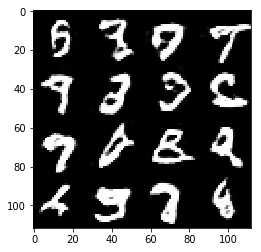

Epoch 1/2... Discriminator Loss: 1.0282... Generator Loss: 1.0214
Epoch 1/2... Discriminator Loss: 1.2601... Generator Loss: 0.5430
Epoch 1/2... Discriminator Loss: 1.0559... Generator Loss: 0.6551
Epoch 1/2... Discriminator Loss: 1.2676... Generator Loss: 2.1284
Epoch 1/2... Discriminator Loss: 1.9572... Generator Loss: 0.2910
Epoch 1/2... Discriminator Loss: 1.3911... Generator Loss: 0.6148
Epoch 1/2... Discriminator Loss: 1.0687... Generator Loss: 0.9273
Epoch 1/2... Discriminator Loss: 1.4665... Generator Loss: 0.5510
Epoch 1/2... Discriminator Loss: 0.9702... Generator Loss: 0.9367
Epoch 1/2... Discriminator Loss: 1.0634... Generator Loss: 0.8514


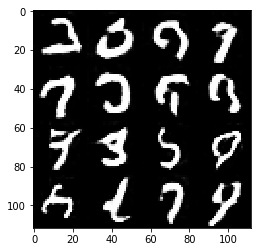

Epoch 1/2... Discriminator Loss: 0.9469... Generator Loss: 0.8325
Epoch 1/2... Discriminator Loss: 1.6345... Generator Loss: 0.3774
Epoch 1/2... Discriminator Loss: 1.0032... Generator Loss: 0.7687
Epoch 1/2... Discriminator Loss: 0.5729... Generator Loss: 1.3492
Epoch 1/2... Discriminator Loss: 0.9870... Generator Loss: 0.8435
Epoch 1/2... Discriminator Loss: 1.3941... Generator Loss: 0.6615
Epoch 1/2... Discriminator Loss: 0.8093... Generator Loss: 1.1092
Epoch 1/2... Discriminator Loss: 0.7323... Generator Loss: 1.0311
Epoch 1/2... Discriminator Loss: 1.3975... Generator Loss: 1.0756
Epoch 1/2... Discriminator Loss: 0.8117... Generator Loss: 1.1147


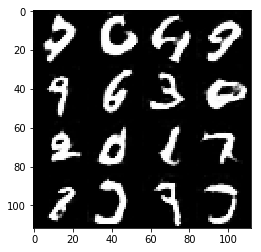

Epoch 1/2... Discriminator Loss: 0.8127... Generator Loss: 0.9995
Epoch 1/2... Discriminator Loss: 0.7470... Generator Loss: 1.1883
Epoch 1/2... Discriminator Loss: 1.4816... Generator Loss: 0.5071
Epoch 1/2... Discriminator Loss: 1.2819... Generator Loss: 0.6578
Epoch 1/2... Discriminator Loss: 1.1597... Generator Loss: 0.6555
Epoch 1/2... Discriminator Loss: 1.1691... Generator Loss: 0.6616
Epoch 1/2... Discriminator Loss: 0.9777... Generator Loss: 0.9253
Epoch 1/2... Discriminator Loss: 0.9071... Generator Loss: 0.9278
Epoch 1/2... Discriminator Loss: 0.9217... Generator Loss: 1.0932
Epoch 1/2... Discriminator Loss: 0.6857... Generator Loss: 1.0115


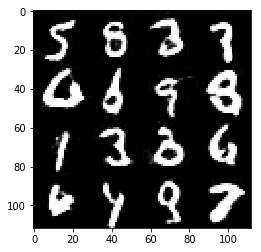

Epoch 1/2... Discriminator Loss: 0.9477... Generator Loss: 0.7853
Epoch 1/2... Discriminator Loss: 1.1335... Generator Loss: 0.9323
Epoch 1/2... Discriminator Loss: 0.8440... Generator Loss: 0.9888
Epoch 1/2... Discriminator Loss: 0.9839... Generator Loss: 0.9818
Epoch 1/2... Discriminator Loss: 1.5926... Generator Loss: 0.3699
Epoch 1/2... Discriminator Loss: 1.1843... Generator Loss: 0.7106
Epoch 1/2... Discriminator Loss: 0.9159... Generator Loss: 0.9455
Epoch 1/2... Discriminator Loss: 0.7050... Generator Loss: 0.8568
Epoch 1/2... Discriminator Loss: 1.1969... Generator Loss: 0.8094
Epoch 1/2... Discriminator Loss: 0.8797... Generator Loss: 1.1702


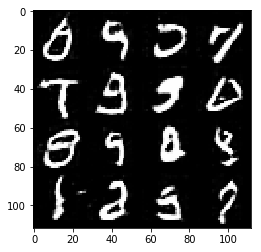

Epoch 1/2... Discriminator Loss: 1.1929... Generator Loss: 0.8061
Epoch 1/2... Discriminator Loss: 1.1370... Generator Loss: 0.8020
Epoch 1/2... Discriminator Loss: 0.8118... Generator Loss: 1.3230
Epoch 1/2... Discriminator Loss: 1.0383... Generator Loss: 0.8250
Epoch 1/2... Discriminator Loss: 1.1463... Generator Loss: 0.7086
Epoch 1/2... Discriminator Loss: 0.9610... Generator Loss: 0.7476
Epoch 1/2... Discriminator Loss: 1.1266... Generator Loss: 0.7143
Epoch 1/2... Discriminator Loss: 1.4095... Generator Loss: 0.8247
Epoch 1/2... Discriminator Loss: 0.8063... Generator Loss: 1.1401
Epoch 1/2... Discriminator Loss: 0.8748... Generator Loss: 0.7553


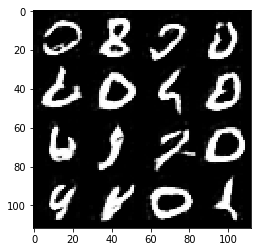

Epoch 1/2... Discriminator Loss: 1.1461... Generator Loss: 0.8509
Epoch 1/2... Discriminator Loss: 1.4895... Generator Loss: 0.5857
Epoch 1/2... Discriminator Loss: 1.0143... Generator Loss: 0.7498
Epoch 1/2... Discriminator Loss: 1.3693... Generator Loss: 0.8394
Epoch 1/2... Discriminator Loss: 0.7450... Generator Loss: 1.1790
Epoch 1/2... Discriminator Loss: 1.3530... Generator Loss: 0.4879
Epoch 1/2... Discriminator Loss: 0.8265... Generator Loss: 0.9748
Epoch 1/2... Discriminator Loss: 1.2350... Generator Loss: 0.5115
Epoch 1/2... Discriminator Loss: 1.0064... Generator Loss: 0.8270
Epoch 1/2... Discriminator Loss: 0.6144... Generator Loss: 1.4424


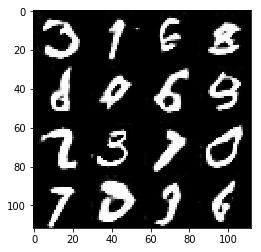

Epoch 1/2... Discriminator Loss: 1.0197... Generator Loss: 1.0023
Epoch 1/2... Discriminator Loss: 1.1516... Generator Loss: 0.8880
Epoch 1/2... Discriminator Loss: 1.0906... Generator Loss: 0.9291
Epoch 1/2... Discriminator Loss: 0.8979... Generator Loss: 0.8691
Epoch 1/2... Discriminator Loss: 0.8646... Generator Loss: 1.0109
Epoch 1/2... Discriminator Loss: 0.6740... Generator Loss: 1.2518
Epoch 1/2... Discriminator Loss: 1.2687... Generator Loss: 0.5615
Epoch 1/2... Discriminator Loss: 0.8887... Generator Loss: 1.2130
Epoch 1/2... Discriminator Loss: 1.0827... Generator Loss: 1.1103
Epoch 1/2... Discriminator Loss: 0.7301... Generator Loss: 1.1457


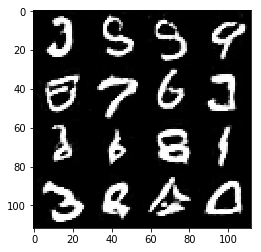

Epoch 1/2... Discriminator Loss: 1.2814... Generator Loss: 0.6664
Epoch 1/2... Discriminator Loss: 1.2302... Generator Loss: 0.6799
Epoch 1/2... Discriminator Loss: 1.8924... Generator Loss: 0.3138
Epoch 1/2... Discriminator Loss: 1.0141... Generator Loss: 1.0454
Epoch 1/2... Discriminator Loss: 0.9214... Generator Loss: 0.9066
Epoch 1/2... Discriminator Loss: 1.0655... Generator Loss: 0.7932
Epoch 1/2... Discriminator Loss: 1.5457... Generator Loss: 0.4576
Epoch 1/2... Discriminator Loss: 1.1138... Generator Loss: 0.6596
Epoch 1/2... Discriminator Loss: 1.3448... Generator Loss: 0.5652
Epoch 1/2... Discriminator Loss: 1.3276... Generator Loss: 0.4426


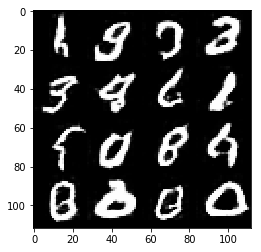

Epoch 1/2... Discriminator Loss: 1.0030... Generator Loss: 0.8303
Epoch 1/2... Discriminator Loss: 0.9599... Generator Loss: 0.8583
Epoch 1/2... Discriminator Loss: 1.4983... Generator Loss: 0.5003
Epoch 1/2... Discriminator Loss: 1.0755... Generator Loss: 0.8335
Epoch 1/2... Discriminator Loss: 0.8564... Generator Loss: 0.9662
Epoch 1/2... Discriminator Loss: 1.1114... Generator Loss: 0.6354
Epoch 1/2... Discriminator Loss: 0.5599... Generator Loss: 1.1049
Epoch 1/2... Discriminator Loss: 0.9487... Generator Loss: 0.9233
Epoch 1/2... Discriminator Loss: 1.2544... Generator Loss: 0.5238
Epoch 1/2... Discriminator Loss: 0.6261... Generator Loss: 1.2398


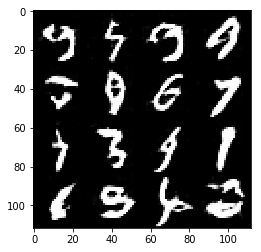

Epoch 1/2... Discriminator Loss: 1.1728... Generator Loss: 1.2339
Epoch 1/2... Discriminator Loss: 1.2826... Generator Loss: 0.6750
Epoch 1/2... Discriminator Loss: 1.5677... Generator Loss: 0.5218
Epoch 1/2... Discriminator Loss: 0.9828... Generator Loss: 0.8259
Epoch 1/2... Discriminator Loss: 0.9205... Generator Loss: 0.8063
Epoch 1/2... Discriminator Loss: 1.2109... Generator Loss: 0.7633
Epoch 1/2... Discriminator Loss: 0.8926... Generator Loss: 1.1037
Epoch 1/2... Discriminator Loss: 1.4325... Generator Loss: 0.7661
Epoch 1/2... Discriminator Loss: 0.8053... Generator Loss: 1.1705
Epoch 1/2... Discriminator Loss: 0.8065... Generator Loss: 1.1910


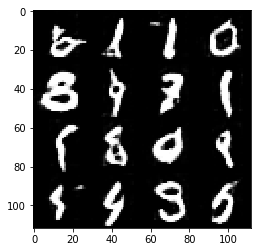

Epoch 1/2... Discriminator Loss: 1.3346... Generator Loss: 0.5491
Epoch 1/2... Discriminator Loss: 1.0672... Generator Loss: 1.0335
Epoch 1/2... Discriminator Loss: 1.3302... Generator Loss: 0.7959
Epoch 1/2... Discriminator Loss: 0.8036... Generator Loss: 1.1695
Epoch 1/2... Discriminator Loss: 1.0540... Generator Loss: 0.7758
Epoch 1/2... Discriminator Loss: 1.3446... Generator Loss: 0.5681
Epoch 1/2... Discriminator Loss: 1.2092... Generator Loss: 0.6057
Epoch 1/2... Discriminator Loss: 1.0806... Generator Loss: 0.8375
Epoch 1/2... Discriminator Loss: 1.0828... Generator Loss: 0.7188
Epoch 1/2... Discriminator Loss: 0.9112... Generator Loss: 1.1578


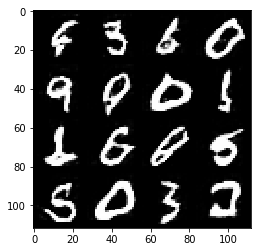

Epoch 1/2... Discriminator Loss: 0.7193... Generator Loss: 1.1409
Epoch 1/2... Discriminator Loss: 0.7550... Generator Loss: 0.9795
Epoch 1/2... Discriminator Loss: 1.1089... Generator Loss: 0.5219
Epoch 1/2... Discriminator Loss: 0.8234... Generator Loss: 1.0289
Epoch 1/2... Discriminator Loss: 1.0107... Generator Loss: 0.8400
Epoch 1/2... Discriminator Loss: 1.4505... Generator Loss: 0.5639
Epoch 1/2... Discriminator Loss: 1.3967... Generator Loss: 0.4353
Epoch 1/2... Discriminator Loss: 1.1020... Generator Loss: 0.6515
Epoch 1/2... Discriminator Loss: 1.4706... Generator Loss: 0.5200
Epoch 1/2... Discriminator Loss: 0.9840... Generator Loss: 0.7826


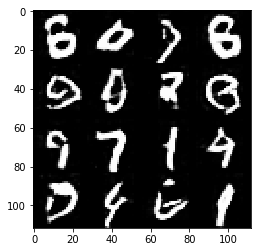

Epoch 1/2... Discriminator Loss: 1.1664... Generator Loss: 0.5979
Epoch 1/2... Discriminator Loss: 1.1141... Generator Loss: 0.7543
Epoch 1/2... Discriminator Loss: 1.3853... Generator Loss: 0.6129
Epoch 1/2... Discriminator Loss: 1.1596... Generator Loss: 0.8593
Epoch 1/2... Discriminator Loss: 1.0946... Generator Loss: 0.8117
Epoch 1/2... Discriminator Loss: 0.9733... Generator Loss: 0.6988
Epoch 1/2... Discriminator Loss: 0.9727... Generator Loss: 1.1822
Epoch 1/2... Discriminator Loss: 1.1057... Generator Loss: 1.1419
Epoch 1/2... Discriminator Loss: 1.2888... Generator Loss: 0.9008
Epoch 1/2... Discriminator Loss: 0.8096... Generator Loss: 1.1641


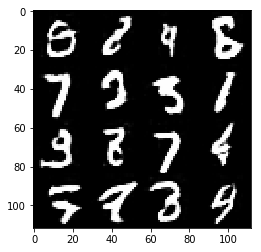

Epoch 1/2... Discriminator Loss: 1.3868... Generator Loss: 0.4795
Epoch 1/2... Discriminator Loss: 1.0109... Generator Loss: 1.1834
Epoch 1/2... Discriminator Loss: 0.8444... Generator Loss: 1.1277
Epoch 1/2... Discriminator Loss: 1.2302... Generator Loss: 0.6115
Epoch 1/2... Discriminator Loss: 1.5302... Generator Loss: 0.5229
Epoch 1/2... Discriminator Loss: 0.7016... Generator Loss: 1.5479
Epoch 1/2... Discriminator Loss: 1.1176... Generator Loss: 1.0247
Epoch 1/2... Discriminator Loss: 1.1793... Generator Loss: 0.5980
Epoch 1/2... Discriminator Loss: 1.1982... Generator Loss: 0.8798
Epoch 1/2... Discriminator Loss: 1.0159... Generator Loss: 0.9711


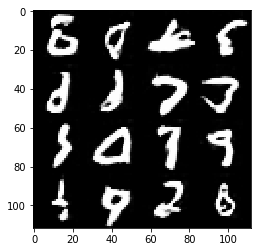

Epoch 1/2... Discriminator Loss: 1.6750... Generator Loss: 0.4787
Epoch 1/2... Discriminator Loss: 0.9954... Generator Loss: 0.8915
Epoch 1/2... Discriminator Loss: 1.1843... Generator Loss: 0.7262
Epoch 1/2... Discriminator Loss: 0.8867... Generator Loss: 0.9029
Epoch 1/2... Discriminator Loss: 0.9124... Generator Loss: 1.3812
Epoch 1/2... Discriminator Loss: 1.1696... Generator Loss: 0.6188
Epoch 1/2... Discriminator Loss: 1.1335... Generator Loss: 1.0171
Epoch 1/2... Discriminator Loss: 1.0863... Generator Loss: 0.7816
Epoch 1/2... Discriminator Loss: 1.1026... Generator Loss: 0.6676
Epoch 1/2... Discriminator Loss: 1.5987... Generator Loss: 0.5141


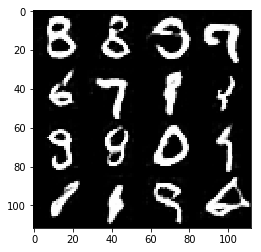

Epoch 1/2... Discriminator Loss: 1.0040... Generator Loss: 0.8153
Epoch 1/2... Discriminator Loss: 0.7502... Generator Loss: 1.1867
Epoch 1/2... Discriminator Loss: 0.7869... Generator Loss: 1.5868
Epoch 1/2... Discriminator Loss: 1.1501... Generator Loss: 0.8183
Epoch 1/2... Discriminator Loss: 0.9126... Generator Loss: 0.9025
Epoch 1/2... Discriminator Loss: 0.6965... Generator Loss: 1.2115
Epoch 1/2... Discriminator Loss: 1.0339... Generator Loss: 0.9220
Epoch 1/2... Discriminator Loss: 1.1107... Generator Loss: 0.7025
Epoch 1/2... Discriminator Loss: 0.8884... Generator Loss: 1.0944
Epoch 1/2... Discriminator Loss: 1.0834... Generator Loss: 0.8606


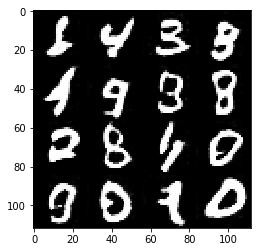

Epoch 1/2... Discriminator Loss: 0.7242... Generator Loss: 1.2240
Epoch 1/2... Discriminator Loss: 0.8142... Generator Loss: 1.0772
Epoch 1/2... Discriminator Loss: 1.4332... Generator Loss: 0.5345
Epoch 1/2... Discriminator Loss: 0.9964... Generator Loss: 0.8297
Epoch 1/2... Discriminator Loss: 0.9537... Generator Loss: 0.7502
Epoch 1/2... Discriminator Loss: 0.9130... Generator Loss: 1.1425
Epoch 1/2... Discriminator Loss: 1.3591... Generator Loss: 0.5181
Epoch 1/2... Discriminator Loss: 0.7218... Generator Loss: 1.2303
Epoch 1/2... Discriminator Loss: 1.0731... Generator Loss: 0.7569
Epoch 1/2... Discriminator Loss: 0.8703... Generator Loss: 1.1419


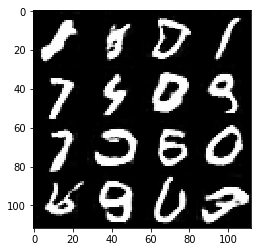

Epoch 2/2... Discriminator Loss: 0.9432... Generator Loss: 0.7675
Epoch 2/2... Discriminator Loss: 1.5761... Generator Loss: 0.4875
Epoch 2/2... Discriminator Loss: 1.0714... Generator Loss: 0.7523
Epoch 2/2... Discriminator Loss: 1.1759... Generator Loss: 0.5816
Epoch 2/2... Discriminator Loss: 0.8262... Generator Loss: 0.9303
Epoch 2/2... Discriminator Loss: 0.8875... Generator Loss: 0.8349
Epoch 2/2... Discriminator Loss: 1.1599... Generator Loss: 0.8928
Epoch 2/2... Discriminator Loss: 1.6302... Generator Loss: 0.4139
Epoch 2/2... Discriminator Loss: 0.8156... Generator Loss: 1.1291
Epoch 2/2... Discriminator Loss: 0.7584... Generator Loss: 1.1831


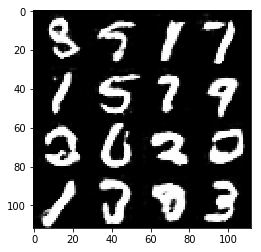

Epoch 2/2... Discriminator Loss: 1.0175... Generator Loss: 0.8290
Epoch 2/2... Discriminator Loss: 1.5831... Generator Loss: 0.4261
Epoch 2/2... Discriminator Loss: 1.0162... Generator Loss: 0.8479
Epoch 2/2... Discriminator Loss: 1.0221... Generator Loss: 0.7577
Epoch 2/2... Discriminator Loss: 1.1003... Generator Loss: 0.7360
Epoch 2/2... Discriminator Loss: 1.3618... Generator Loss: 0.5084
Epoch 2/2... Discriminator Loss: 1.3085... Generator Loss: 0.7367
Epoch 2/2... Discriminator Loss: 1.3640... Generator Loss: 0.5265
Epoch 2/2... Discriminator Loss: 0.9038... Generator Loss: 1.0685
Epoch 2/2... Discriminator Loss: 1.4291... Generator Loss: 0.4175
Epoch 2/2... Discriminator Loss: 0.7167... Generator Loss: 1.2126
Epoch 2/2... Discriminator Loss: 0.9362... Generator Loss: 1.0198
Epoch 2/2... Discriminator Loss: 1.3988... Generator Loss: 0.4858
Epoch 2/2... Discriminator Loss: 0.9032... Generator Loss: 0.7184


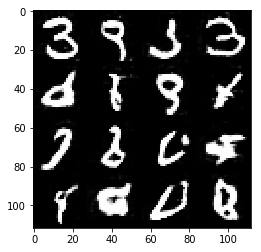

Epoch 2/2... Discriminator Loss: 0.9230... Generator Loss: 1.1450
Epoch 2/2... Discriminator Loss: 0.8012... Generator Loss: 1.1091
Epoch 2/2... Discriminator Loss: 1.3770... Generator Loss: 0.4161
Epoch 2/2... Discriminator Loss: 1.0644... Generator Loss: 0.7055
Epoch 2/2... Discriminator Loss: 0.9902... Generator Loss: 0.8344
Epoch 2/2... Discriminator Loss: 0.8776... Generator Loss: 1.1244
Epoch 2/2... Discriminator Loss: 1.3687... Generator Loss: 0.7294
Epoch 2/2... Discriminator Loss: 1.4082... Generator Loss: 0.6398
Epoch 2/2... Discriminator Loss: 0.7380... Generator Loss: 0.9963
Epoch 2/2... Discriminator Loss: 1.2461... Generator Loss: 0.7036


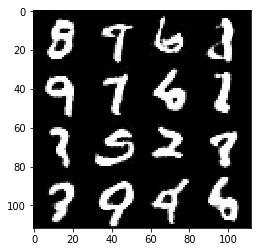

Epoch 2/2... Discriminator Loss: 1.3322... Generator Loss: 0.6687
Epoch 2/2... Discriminator Loss: 0.6353... Generator Loss: 1.2452
Epoch 2/2... Discriminator Loss: 0.8838... Generator Loss: 0.8719
Epoch 2/2... Discriminator Loss: 1.4200... Generator Loss: 0.5473
Epoch 2/2... Discriminator Loss: 0.8595... Generator Loss: 0.9961
Epoch 2/2... Discriminator Loss: 0.6885... Generator Loss: 1.3102
Epoch 2/2... Discriminator Loss: 0.8228... Generator Loss: 0.9639
Epoch 2/2... Discriminator Loss: 1.3591... Generator Loss: 0.6340
Epoch 2/2... Discriminator Loss: 0.9332... Generator Loss: 0.9084
Epoch 2/2... Discriminator Loss: 1.2799... Generator Loss: 0.5450


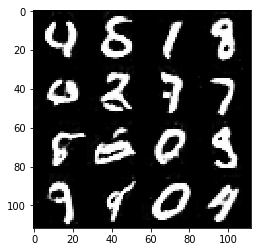

Epoch 2/2... Discriminator Loss: 1.2320... Generator Loss: 0.5310
Epoch 2/2... Discriminator Loss: 0.9723... Generator Loss: 0.8891
Epoch 2/2... Discriminator Loss: 0.7903... Generator Loss: 1.2202
Epoch 2/2... Discriminator Loss: 1.3875... Generator Loss: 0.6550
Epoch 2/2... Discriminator Loss: 0.8538... Generator Loss: 0.8453
Epoch 2/2... Discriminator Loss: 0.4385... Generator Loss: 1.5567
Epoch 2/2... Discriminator Loss: 1.1105... Generator Loss: 0.7067
Epoch 2/2... Discriminator Loss: 1.0844... Generator Loss: 0.6451
Epoch 2/2... Discriminator Loss: 1.3798... Generator Loss: 0.5811
Epoch 2/2... Discriminator Loss: 0.9955... Generator Loss: 0.8442


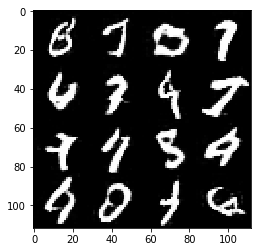

Epoch 2/2... Discriminator Loss: 2.1951... Generator Loss: 0.2121
Epoch 2/2... Discriminator Loss: 0.9224... Generator Loss: 0.8714
Epoch 2/2... Discriminator Loss: 0.8451... Generator Loss: 1.0505
Epoch 2/2... Discriminator Loss: 0.6926... Generator Loss: 1.3928
Epoch 2/2... Discriminator Loss: 1.0999... Generator Loss: 0.8080
Epoch 2/2... Discriminator Loss: 0.7491... Generator Loss: 0.9736
Epoch 2/2... Discriminator Loss: 0.8768... Generator Loss: 0.8704
Epoch 2/2... Discriminator Loss: 1.2938... Generator Loss: 0.7680
Epoch 2/2... Discriminator Loss: 1.1291... Generator Loss: 0.7874
Epoch 2/2... Discriminator Loss: 1.3988... Generator Loss: 0.4206


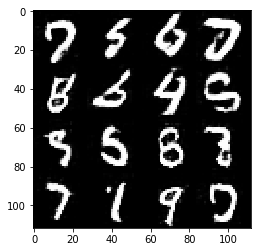

Epoch 2/2... Discriminator Loss: 0.8745... Generator Loss: 0.9374
Epoch 2/2... Discriminator Loss: 0.7864... Generator Loss: 1.3207
Epoch 2/2... Discriminator Loss: 1.0763... Generator Loss: 0.8935
Epoch 2/2... Discriminator Loss: 1.0920... Generator Loss: 1.0506
Epoch 2/2... Discriminator Loss: 0.6742... Generator Loss: 1.4160
Epoch 2/2... Discriminator Loss: 0.8538... Generator Loss: 0.9538
Epoch 2/2... Discriminator Loss: 0.8579... Generator Loss: 0.8605
Epoch 2/2... Discriminator Loss: 1.1135... Generator Loss: 0.6566
Epoch 2/2... Discriminator Loss: 0.8830... Generator Loss: 1.1744
Epoch 2/2... Discriminator Loss: 0.8670... Generator Loss: 0.8223


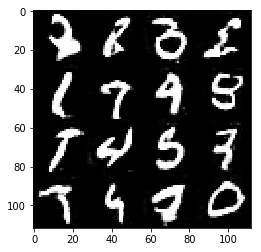

Epoch 2/2... Discriminator Loss: 1.1398... Generator Loss: 0.8156
Epoch 2/2... Discriminator Loss: 0.8594... Generator Loss: 1.3023
Epoch 2/2... Discriminator Loss: 0.8900... Generator Loss: 0.9351
Epoch 2/2... Discriminator Loss: 0.4768... Generator Loss: 1.4527
Epoch 2/2... Discriminator Loss: 1.1839... Generator Loss: 0.6735
Epoch 2/2... Discriminator Loss: 1.3345... Generator Loss: 0.7493
Epoch 2/2... Discriminator Loss: 0.9544... Generator Loss: 0.8992
Epoch 2/2... Discriminator Loss: 0.8672... Generator Loss: 1.2752
Epoch 2/2... Discriminator Loss: 1.4553... Generator Loss: 0.4925
Epoch 2/2... Discriminator Loss: 0.5132... Generator Loss: 1.5129


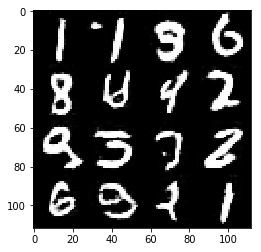

Epoch 2/2... Discriminator Loss: 0.9104... Generator Loss: 0.9952
Epoch 2/2... Discriminator Loss: 1.2799... Generator Loss: 0.5793
Epoch 2/2... Discriminator Loss: 1.1939... Generator Loss: 0.6158
Epoch 2/2... Discriminator Loss: 1.4446... Generator Loss: 0.3888
Epoch 2/2... Discriminator Loss: 1.1023... Generator Loss: 0.8670
Epoch 2/2... Discriminator Loss: 0.7904... Generator Loss: 1.0064
Epoch 2/2... Discriminator Loss: 0.8641... Generator Loss: 0.8556
Epoch 2/2... Discriminator Loss: 1.4589... Generator Loss: 0.5301
Epoch 2/2... Discriminator Loss: 1.4853... Generator Loss: 0.4880
Epoch 2/2... Discriminator Loss: 1.1445... Generator Loss: 0.6864


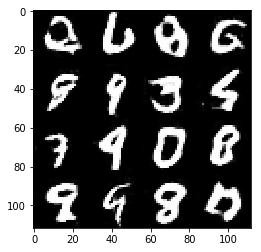

Epoch 2/2... Discriminator Loss: 1.1055... Generator Loss: 0.6573
Epoch 2/2... Discriminator Loss: 1.1411... Generator Loss: 0.7880
Epoch 2/2... Discriminator Loss: 1.2467... Generator Loss: 0.5723
Epoch 2/2... Discriminator Loss: 1.4167... Generator Loss: 0.6715
Epoch 2/2... Discriminator Loss: 0.9236... Generator Loss: 1.0394
Epoch 2/2... Discriminator Loss: 1.1260... Generator Loss: 0.8517
Epoch 2/2... Discriminator Loss: 1.2805... Generator Loss: 0.6519
Epoch 2/2... Discriminator Loss: 1.4313... Generator Loss: 0.8475
Epoch 2/2... Discriminator Loss: 1.0240... Generator Loss: 0.7550
Epoch 2/2... Discriminator Loss: 1.3993... Generator Loss: 0.5840


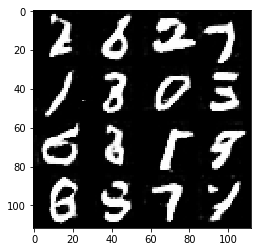

Epoch 2/2... Discriminator Loss: 0.9648... Generator Loss: 0.9787
Epoch 2/2... Discriminator Loss: 1.0108... Generator Loss: 0.8596
Epoch 2/2... Discriminator Loss: 0.8346... Generator Loss: 1.2009
Epoch 2/2... Discriminator Loss: 0.8512... Generator Loss: 1.0666
Epoch 2/2... Discriminator Loss: 1.0976... Generator Loss: 0.7537
Epoch 2/2... Discriminator Loss: 0.8678... Generator Loss: 1.1569
Epoch 2/2... Discriminator Loss: 1.1086... Generator Loss: 0.7599
Epoch 2/2... Discriminator Loss: 1.3470... Generator Loss: 0.5788
Epoch 2/2... Discriminator Loss: 1.5164... Generator Loss: 0.4519
Epoch 2/2... Discriminator Loss: 0.8288... Generator Loss: 0.7935


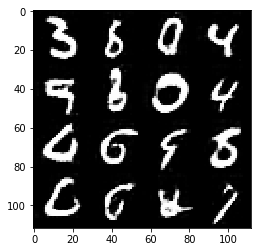

Epoch 2/2... Discriminator Loss: 0.5168... Generator Loss: 1.3578
Epoch 2/2... Discriminator Loss: 0.7550... Generator Loss: 1.0368
Epoch 2/2... Discriminator Loss: 0.6388... Generator Loss: 1.4602
Epoch 2/2... Discriminator Loss: 0.7308... Generator Loss: 1.3536
Epoch 2/2... Discriminator Loss: 0.9631... Generator Loss: 0.8812
Epoch 2/2... Discriminator Loss: 1.3905... Generator Loss: 0.6356
Epoch 2/2... Discriminator Loss: 1.3116... Generator Loss: 0.5395
Epoch 2/2... Discriminator Loss: 1.8152... Generator Loss: 0.3063
Epoch 2/2... Discriminator Loss: 0.9890... Generator Loss: 0.8110
Epoch 2/2... Discriminator Loss: 1.1866... Generator Loss: 0.6972


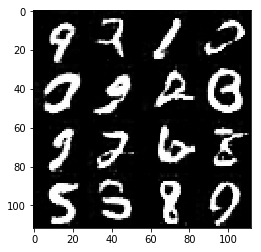

Epoch 2/2... Discriminator Loss: 1.0173... Generator Loss: 0.8576
Epoch 2/2... Discriminator Loss: 1.0488... Generator Loss: 0.7659
Epoch 2/2... Discriminator Loss: 1.2201... Generator Loss: 0.6622
Epoch 2/2... Discriminator Loss: 0.6976... Generator Loss: 1.1573
Epoch 2/2... Discriminator Loss: 0.9498... Generator Loss: 1.0061
Epoch 2/2... Discriminator Loss: 0.9149... Generator Loss: 0.8198
Epoch 2/2... Discriminator Loss: 1.1047... Generator Loss: 0.6400
Epoch 2/2... Discriminator Loss: 1.2225... Generator Loss: 0.5380
Epoch 2/2... Discriminator Loss: 0.7985... Generator Loss: 1.1470
Epoch 2/2... Discriminator Loss: 1.1068... Generator Loss: 0.9454


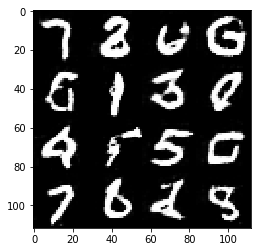

Epoch 2/2... Discriminator Loss: 1.3243... Generator Loss: 0.5977
Epoch 2/2... Discriminator Loss: 0.8923... Generator Loss: 0.8497
Epoch 2/2... Discriminator Loss: 1.3817... Generator Loss: 0.5073
Epoch 2/2... Discriminator Loss: 0.9358... Generator Loss: 1.2415
Epoch 2/2... Discriminator Loss: 1.1999... Generator Loss: 0.6689
Epoch 2/2... Discriminator Loss: 0.9557... Generator Loss: 0.7485
Epoch 2/2... Discriminator Loss: 1.0578... Generator Loss: 0.7133
Epoch 2/2... Discriminator Loss: 1.3137... Generator Loss: 0.4844
Epoch 2/2... Discriminator Loss: 0.7523... Generator Loss: 1.3937
Epoch 2/2... Discriminator Loss: 1.6023... Generator Loss: 0.4014


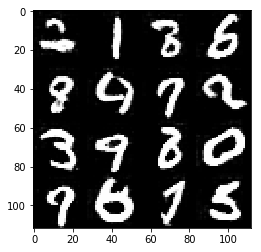

Epoch 2/2... Discriminator Loss: 0.8870... Generator Loss: 1.0519
Epoch 2/2... Discriminator Loss: 1.1808... Generator Loss: 0.6685
Epoch 2/2... Discriminator Loss: 1.2606... Generator Loss: 0.6677
Epoch 2/2... Discriminator Loss: 1.1334... Generator Loss: 0.7714
Epoch 2/2... Discriminator Loss: 1.4854... Generator Loss: 0.4072
Epoch 2/2... Discriminator Loss: 0.7546... Generator Loss: 1.0078
Epoch 2/2... Discriminator Loss: 0.9659... Generator Loss: 0.8918
Epoch 2/2... Discriminator Loss: 1.0212... Generator Loss: 1.0318
Epoch 2/2... Discriminator Loss: 1.4300... Generator Loss: 0.5123
Epoch 2/2... Discriminator Loss: 1.0701... Generator Loss: 0.9270


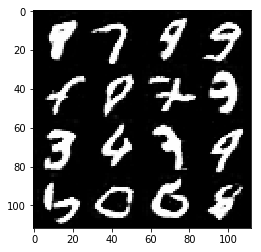

Epoch 2/2... Discriminator Loss: 1.2792... Generator Loss: 0.4434
Epoch 2/2... Discriminator Loss: 0.9270... Generator Loss: 0.9435
Epoch 2/2... Discriminator Loss: 0.6491... Generator Loss: 1.3164
Epoch 2/2... Discriminator Loss: 1.0241... Generator Loss: 0.9838
Epoch 2/2... Discriminator Loss: 0.8470... Generator Loss: 0.8572
Epoch 2/2... Discriminator Loss: 1.0493... Generator Loss: 0.7380
Epoch 2/2... Discriminator Loss: 0.7316... Generator Loss: 0.9367
Epoch 2/2... Discriminator Loss: 0.8461... Generator Loss: 1.0327
Epoch 2/2... Discriminator Loss: 0.8624... Generator Loss: 1.0313
Epoch 2/2... Discriminator Loss: 0.8805... Generator Loss: 1.0709


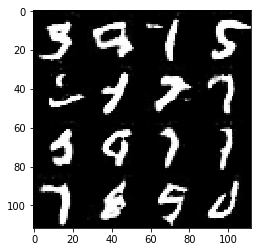

Epoch 2/2... Discriminator Loss: 1.2015... Generator Loss: 0.8429
Epoch 2/2... Discriminator Loss: 1.0411... Generator Loss: 0.7122
Epoch 2/2... Discriminator Loss: 0.6349... Generator Loss: 1.4742
Epoch 2/2... Discriminator Loss: 1.1528... Generator Loss: 1.0820
Epoch 2/2... Discriminator Loss: 0.7423... Generator Loss: 1.2283
Epoch 2/2... Discriminator Loss: 0.6996... Generator Loss: 1.3229
Epoch 2/2... Discriminator Loss: 0.9258... Generator Loss: 0.9099
Epoch 2/2... Discriminator Loss: 0.6269... Generator Loss: 1.1193
Epoch 2/2... Discriminator Loss: 1.4183... Generator Loss: 0.5365
Epoch 2/2... Discriminator Loss: 1.0810... Generator Loss: 0.8042


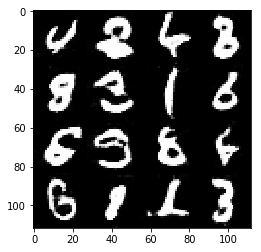

Epoch 2/2... Discriminator Loss: 1.1845... Generator Loss: 0.7000
Epoch 2/2... Discriminator Loss: 0.8561... Generator Loss: 0.9383
Epoch 2/2... Discriminator Loss: 0.8260... Generator Loss: 0.9384
Epoch 2/2... Discriminator Loss: 0.9383... Generator Loss: 0.8782
Epoch 2/2... Discriminator Loss: 1.1337... Generator Loss: 0.7116
Epoch 2/2... Discriminator Loss: 0.9613... Generator Loss: 1.0299
Epoch 2/2... Discriminator Loss: 1.1175... Generator Loss: 0.6485
Epoch 2/2... Discriminator Loss: 1.1863... Generator Loss: 0.7205
Epoch 2/2... Discriminator Loss: 0.9482... Generator Loss: 0.8021
Epoch 2/2... Discriminator Loss: 1.3225... Generator Loss: 0.5245


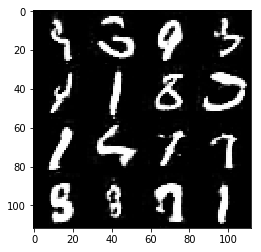

Epoch 2/2... Discriminator Loss: 1.3770... Generator Loss: 0.7494
Epoch 2/2... Discriminator Loss: 1.3112... Generator Loss: 0.5733
Epoch 2/2... Discriminator Loss: 1.0131... Generator Loss: 0.9140
Epoch 2/2... Discriminator Loss: 0.9262... Generator Loss: 1.1971
Epoch 2/2... Discriminator Loss: 1.6151... Generator Loss: 0.5112
Epoch 2/2... Discriminator Loss: 1.5552... Generator Loss: 0.4936
Epoch 2/2... Discriminator Loss: 1.1625... Generator Loss: 0.7063
Epoch 2/2... Discriminator Loss: 1.0531... Generator Loss: 0.8720
Epoch 2/2... Discriminator Loss: 1.4267... Generator Loss: 0.6868
Epoch 2/2... Discriminator Loss: 1.0651... Generator Loss: 0.8187


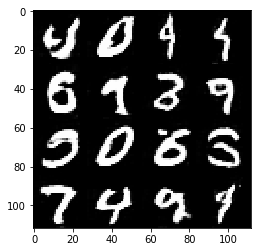

Epoch 2/2... Discriminator Loss: 0.8136... Generator Loss: 0.9234
Epoch 2/2... Discriminator Loss: 1.2456... Generator Loss: 0.6786
Epoch 2/2... Discriminator Loss: 1.2023... Generator Loss: 0.5576
Epoch 2/2... Discriminator Loss: 0.6946... Generator Loss: 0.9858
Epoch 2/2... Discriminator Loss: 0.8000... Generator Loss: 1.1011
Epoch 2/2... Discriminator Loss: 1.2176... Generator Loss: 0.6940
Epoch 2/2... Discriminator Loss: 1.0898... Generator Loss: 0.7961
Epoch 2/2... Discriminator Loss: 1.3316... Generator Loss: 0.5829
Epoch 2/2... Discriminator Loss: 0.8454... Generator Loss: 1.1001
Epoch 2/2... Discriminator Loss: 1.0756... Generator Loss: 0.8599


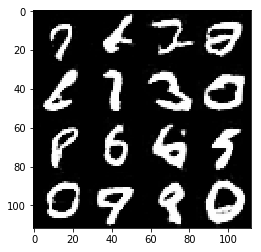

Epoch 2/2... Discriminator Loss: 1.3008... Generator Loss: 0.6755
Epoch 2/2... Discriminator Loss: 1.2390... Generator Loss: 0.6767
Epoch 2/2... Discriminator Loss: 1.0552... Generator Loss: 0.7935
Epoch 2/2... Discriminator Loss: 1.1938... Generator Loss: 0.9751
Epoch 2/2... Discriminator Loss: 1.0035... Generator Loss: 1.0549
Epoch 2/2... Discriminator Loss: 1.0091... Generator Loss: 0.8414
Epoch 2/2... Discriminator Loss: 1.1378... Generator Loss: 0.7547
Epoch 2/2... Discriminator Loss: 0.8602... Generator Loss: 1.1143
Epoch 2/2... Discriminator Loss: 1.3348... Generator Loss: 0.6559
Epoch 2/2... Discriminator Loss: 1.1117... Generator Loss: 0.8914


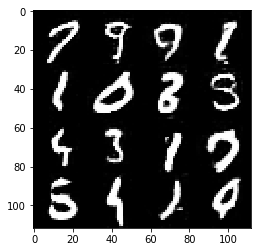

Epoch 2/2... Discriminator Loss: 1.2841... Generator Loss: 0.5968
Epoch 2/2... Discriminator Loss: 0.7654... Generator Loss: 1.0942
Epoch 2/2... Discriminator Loss: 0.6287... Generator Loss: 1.2785
Epoch 2/2... Discriminator Loss: 0.7433... Generator Loss: 1.1278
Epoch 2/2... Discriminator Loss: 1.2469... Generator Loss: 0.5849
Epoch 2/2... Discriminator Loss: 1.0193... Generator Loss: 0.9453
Epoch 2/2... Discriminator Loss: 0.5942... Generator Loss: 1.4450
Epoch 2/2... Discriminator Loss: 1.4980... Generator Loss: 0.5845
Epoch 2/2... Discriminator Loss: 0.9939... Generator Loss: 1.2849
Epoch 2/2... Discriminator Loss: 1.1461... Generator Loss: 0.8224


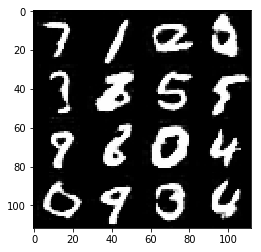

Epoch 2/2... Discriminator Loss: 1.4002... Generator Loss: 0.5906
Epoch 2/2... Discriminator Loss: 1.1593... Generator Loss: 0.6150
Epoch 2/2... Discriminator Loss: 1.1646... Generator Loss: 0.6242
Epoch 2/2... Discriminator Loss: 0.8473... Generator Loss: 0.8348
Epoch 2/2... Discriminator Loss: 0.7841... Generator Loss: 0.9623
Epoch 2/2... Discriminator Loss: 0.8375... Generator Loss: 1.0531
Epoch 2/2... Discriminator Loss: 1.2399... Generator Loss: 0.8240
Epoch 2/2... Discriminator Loss: 0.5469... Generator Loss: 1.5330
Epoch 2/2... Discriminator Loss: 1.3582... Generator Loss: 0.6355
Epoch 2/2... Discriminator Loss: 1.0036... Generator Loss: 0.7883


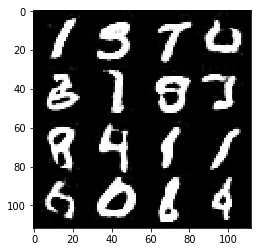

Epoch 2/2... Discriminator Loss: 0.8542... Generator Loss: 1.2481
Epoch 2/2... Discriminator Loss: 0.8309... Generator Loss: 1.1385
Epoch 2/2... Discriminator Loss: 0.8813... Generator Loss: 0.9484
Epoch 2/2... Discriminator Loss: 0.7498... Generator Loss: 1.2591
Epoch 2/2... Discriminator Loss: 0.8065... Generator Loss: 0.9093
Epoch 2/2... Discriminator Loss: 0.8970... Generator Loss: 1.0196
Epoch 2/2... Discriminator Loss: 1.0273... Generator Loss: 0.6173
Epoch 2/2... Discriminator Loss: 1.3942... Generator Loss: 0.5798
Epoch 2/2... Discriminator Loss: 1.4519... Generator Loss: 0.5012
Epoch 2/2... Discriminator Loss: 2.0459... Generator Loss: 0.3726


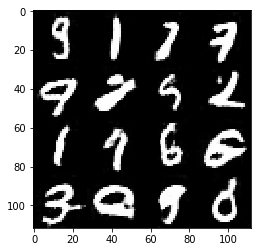

Epoch 2/2... Discriminator Loss: 1.0545... Generator Loss: 0.7379
Epoch 2/2... Discriminator Loss: 1.2822... Generator Loss: 0.5624
Epoch 2/2... Discriminator Loss: 1.1069... Generator Loss: 0.7283
Epoch 2/2... Discriminator Loss: 1.2130... Generator Loss: 0.6142
Epoch 2/2... Discriminator Loss: 1.7919... Generator Loss: 0.3903
Epoch 2/2... Discriminator Loss: 1.2101... Generator Loss: 0.8508
Epoch 2/2... Discriminator Loss: 0.9346... Generator Loss: 1.1955
Epoch 2/2... Discriminator Loss: 1.1040... Generator Loss: 0.9050
Epoch 2/2... Discriminator Loss: 0.7717... Generator Loss: 1.1250
Epoch 2/2... Discriminator Loss: 1.1049... Generator Loss: 0.7655


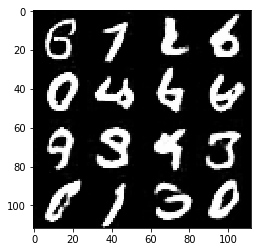

Epoch 2/2... Discriminator Loss: 1.0154... Generator Loss: 0.6849
Epoch 2/2... Discriminator Loss: 1.4330... Generator Loss: 0.4738
Epoch 2/2... Discriminator Loss: 1.1226... Generator Loss: 0.7448
Epoch 2/2... Discriminator Loss: 0.9837... Generator Loss: 1.0206
Epoch 2/2... Discriminator Loss: 1.5826... Generator Loss: 0.6540
Epoch 2/2... Discriminator Loss: 1.5468... Generator Loss: 0.4151
Epoch 2/2... Discriminator Loss: 0.8807... Generator Loss: 0.9422
Epoch 2/2... Discriminator Loss: 0.9470... Generator Loss: 1.0134
Epoch 2/2... Discriminator Loss: 1.4983... Generator Loss: 0.5150
Epoch 2/2... Discriminator Loss: 1.2677... Generator Loss: 0.5866


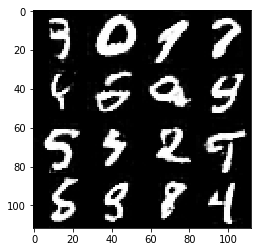

Epoch 2/2... Discriminator Loss: 1.0103... Generator Loss: 1.0710
Epoch 2/2... Discriminator Loss: 0.9598... Generator Loss: 1.1324
Epoch 2/2... Discriminator Loss: 0.7809... Generator Loss: 1.2914
Epoch 2/2... Discriminator Loss: 1.1717... Generator Loss: 0.6902
Epoch 2/2... Discriminator Loss: 0.7371... Generator Loss: 1.3676
Epoch 2/2... Discriminator Loss: 0.6823... Generator Loss: 1.2954
Epoch 2/2... Discriminator Loss: 1.6280... Generator Loss: 0.5516
Epoch 2/2... Discriminator Loss: 0.6854... Generator Loss: 1.0734
Epoch 2/2... Discriminator Loss: 0.8764... Generator Loss: 0.9786
Epoch 2/2... Discriminator Loss: 0.9690... Generator Loss: 0.8701


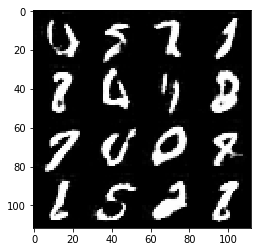

Epoch 2/2... Discriminator Loss: 1.0339... Generator Loss: 0.8810
Epoch 2/2... Discriminator Loss: 0.7087... Generator Loss: 1.4069
Epoch 2/2... Discriminator Loss: 0.9589... Generator Loss: 0.9426
Epoch 2/2... Discriminator Loss: 1.0762... Generator Loss: 0.9911
Epoch 2/2... Discriminator Loss: 1.0004... Generator Loss: 0.7927
Epoch 2/2... Discriminator Loss: 1.2091... Generator Loss: 0.6980
Epoch 2/2... Discriminator Loss: 0.7543... Generator Loss: 1.3388
Epoch 2/2... Discriminator Loss: 0.9875... Generator Loss: 0.8102
Epoch 2/2... Discriminator Loss: 1.5093... Generator Loss: 0.5163
Epoch 2/2... Discriminator Loss: 1.1042... Generator Loss: 0.6345


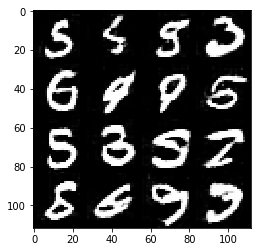

Epoch 2/2... Discriminator Loss: 0.8640... Generator Loss: 1.0183
Epoch 2/2... Discriminator Loss: 0.5833... Generator Loss: 1.4157
Epoch 2/2... Discriminator Loss: 1.1446... Generator Loss: 0.8316
Epoch 2/2... Discriminator Loss: 1.1404... Generator Loss: 0.6763
Epoch 2/2... Discriminator Loss: 1.1841... Generator Loss: 0.7369
Epoch 2/2... Discriminator Loss: 1.4366... Generator Loss: 0.4924
Epoch 2/2... Discriminator Loss: 1.1890... Generator Loss: 0.5767
Epoch 2/2... Discriminator Loss: 1.3212... Generator Loss: 0.7817
Epoch 2/2... Discriminator Loss: 1.2367... Generator Loss: 1.3100
Epoch 2/2... Discriminator Loss: 1.0683... Generator Loss: 0.7741


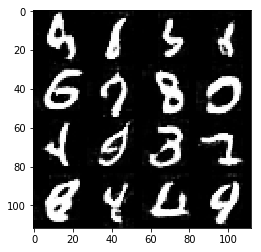

Epoch 2/2... Discriminator Loss: 1.2131... Generator Loss: 0.8084
Epoch 2/2... Discriminator Loss: 0.9172... Generator Loss: 0.9904
Epoch 2/2... Discriminator Loss: 1.1570... Generator Loss: 0.8829
Epoch 2/2... Discriminator Loss: 0.5740... Generator Loss: 1.3955
Epoch 2/2... Discriminator Loss: 1.3246... Generator Loss: 0.6418
Epoch 2/2... Discriminator Loss: 0.9890... Generator Loss: 0.7095
Epoch 2/2... Discriminator Loss: 0.8918... Generator Loss: 1.0396
Epoch 2/2... Discriminator Loss: 1.6425... Generator Loss: 0.4477
Epoch 2/2... Discriminator Loss: 1.2054... Generator Loss: 0.7910
Epoch 2/2... Discriminator Loss: 1.5446... Generator Loss: 0.4118


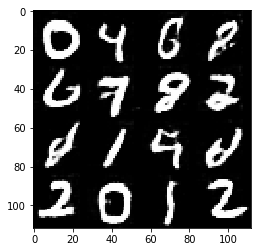

Epoch 2/2... Discriminator Loss: 0.9879... Generator Loss: 0.6978
Epoch 2/2... Discriminator Loss: 1.3747... Generator Loss: 0.8316
Epoch 2/2... Discriminator Loss: 0.8650... Generator Loss: 0.9291
Epoch 2/2... Discriminator Loss: 1.2669... Generator Loss: 0.5970
Epoch 2/2... Discriminator Loss: 0.9260... Generator Loss: 0.9496
Epoch 2/2... Discriminator Loss: 0.8346... Generator Loss: 0.9327
Epoch 2/2... Discriminator Loss: 1.1828... Generator Loss: 0.6131
Epoch 2/2... Discriminator Loss: 1.1610... Generator Loss: 0.6158
Epoch 2/2... Discriminator Loss: 0.5673... Generator Loss: 1.7590
Epoch 2/2... Discriminator Loss: 0.7437... Generator Loss: 1.0666


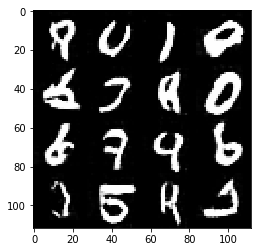

Epoch 2/2... Discriminator Loss: 1.0398... Generator Loss: 0.8088
Epoch 2/2... Discriminator Loss: 0.8120... Generator Loss: 1.2696
Epoch 2/2... Discriminator Loss: 0.9132... Generator Loss: 0.9557
Epoch 2/2... Discriminator Loss: 1.2221... Generator Loss: 1.1291
Epoch 2/2... Discriminator Loss: 0.4940... Generator Loss: 1.4779
Epoch 2/2... Discriminator Loss: 0.9433... Generator Loss: 1.0605
Epoch 2/2... Discriminator Loss: 1.0094... Generator Loss: 0.8056
Epoch 2/2... Discriminator Loss: 1.0738... Generator Loss: 1.2474
Epoch 2/2... Discriminator Loss: 0.8212... Generator Loss: 1.1989
Epoch 2/2... Discriminator Loss: 0.6150... Generator Loss: 1.4022


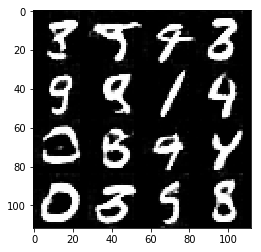

Epoch 2/2... Discriminator Loss: 1.0566... Generator Loss: 0.6992
Epoch 2/2... Discriminator Loss: 0.7915... Generator Loss: 1.0985
Epoch 2/2... Discriminator Loss: 0.9067... Generator Loss: 1.1150
Epoch 2/2... Discriminator Loss: 0.9166... Generator Loss: 1.0059
Epoch 2/2... Discriminator Loss: 0.8289... Generator Loss: 1.3028
Epoch 2/2... Discriminator Loss: 1.5043... Generator Loss: 0.5215
Epoch 2/2... Discriminator Loss: 0.9191... Generator Loss: 0.8768
Epoch 2/2... Discriminator Loss: 1.4946... Generator Loss: 0.5748
Epoch 2/2... Discriminator Loss: 1.4384... Generator Loss: 0.6195
Epoch 2/2... Discriminator Loss: 1.1106... Generator Loss: 0.7648


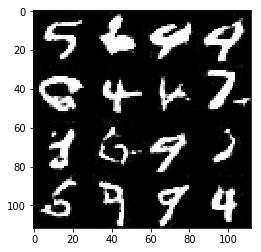

Epoch 2/2... Discriminator Loss: 1.2839... Generator Loss: 0.5413
Epoch 2/2... Discriminator Loss: 1.1730... Generator Loss: 0.7104
Epoch 2/2... Discriminator Loss: 1.1512... Generator Loss: 0.7445
Epoch 2/2... Discriminator Loss: 0.9317... Generator Loss: 0.9005
Epoch 2/2... Discriminator Loss: 1.4596... Generator Loss: 0.4833
Epoch 2/2... Discriminator Loss: 1.2599... Generator Loss: 0.5824
Epoch 2/2... Discriminator Loss: 0.7445... Generator Loss: 1.1640
Epoch 2/2... Discriminator Loss: 0.8591... Generator Loss: 0.8991
Epoch 2/2... Discriminator Loss: 1.9606... Generator Loss: 0.4586
Epoch 2/2... Discriminator Loss: 1.2000... Generator Loss: 0.9065


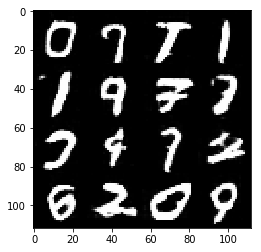

Epoch 2/2... Discriminator Loss: 1.1285... Generator Loss: 0.5571
Epoch 2/2... Discriminator Loss: 1.2141... Generator Loss: 0.7443
Epoch 2/2... Discriminator Loss: 0.8229... Generator Loss: 0.9764
Epoch 2/2... Discriminator Loss: 0.5791... Generator Loss: 1.3097
Epoch 2/2... Discriminator Loss: 1.0563... Generator Loss: 0.7627
Epoch 2/2... Discriminator Loss: 0.9566... Generator Loss: 0.7947
Epoch 2/2... Discriminator Loss: 0.8441... Generator Loss: 0.9018
Epoch 2/2... Discriminator Loss: 0.6149... Generator Loss: 0.8780
Epoch 2/2... Discriminator Loss: 1.2956... Generator Loss: 0.5572
Epoch 2/2... Discriminator Loss: 0.5995... Generator Loss: 1.4612


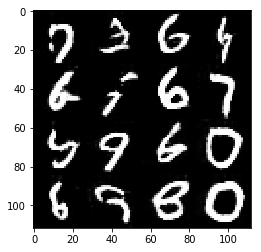

Epoch 2/2... Discriminator Loss: 1.1756... Generator Loss: 0.9065
Epoch 2/2... Discriminator Loss: 1.1083... Generator Loss: 0.6638
Epoch 2/2... Discriminator Loss: 0.8496... Generator Loss: 1.0484
Epoch 2/2... Discriminator Loss: 1.0651... Generator Loss: 0.6982
Epoch 2/2... Discriminator Loss: 1.0877... Generator Loss: 0.7698
Epoch 2/2... Discriminator Loss: 1.2882... Generator Loss: 0.8219
Epoch 2/2... Discriminator Loss: 0.8805... Generator Loss: 0.9181
Epoch 2/2... Discriminator Loss: 0.7397... Generator Loss: 1.1527
Epoch 2/2... Discriminator Loss: 1.0298... Generator Loss: 0.8069
Epoch 2/2... Discriminator Loss: 1.0390... Generator Loss: 0.9012


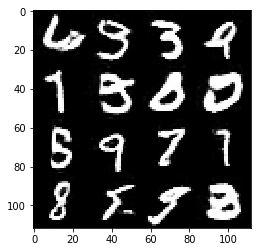

Epoch 2/2... Discriminator Loss: 1.2028... Generator Loss: 0.9749
Epoch 2/2... Discriminator Loss: 1.2235... Generator Loss: 0.6217
Epoch 2/2... Discriminator Loss: 1.2310... Generator Loss: 0.8461
Epoch 2/2... Discriminator Loss: 1.2652... Generator Loss: 0.7513
Epoch 2/2... Discriminator Loss: 1.0952... Generator Loss: 0.6311
Epoch 2/2... Discriminator Loss: 0.6224... Generator Loss: 1.3104
Epoch 2/2... Discriminator Loss: 0.7738... Generator Loss: 1.1171
Epoch 2/2... Discriminator Loss: 0.9575... Generator Loss: 0.9353
Epoch 2/2... Discriminator Loss: 1.1881... Generator Loss: 0.6030
Epoch 2/2... Discriminator Loss: 1.0076... Generator Loss: 0.8697


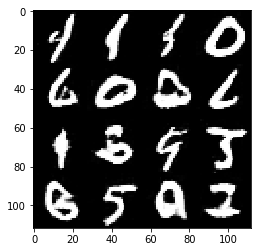

Epoch 2/2... Discriminator Loss: 0.8122... Generator Loss: 0.8730
Epoch 2/2... Discriminator Loss: 1.2253... Generator Loss: 0.6284
Epoch 2/2... Discriminator Loss: 1.2918... Generator Loss: 0.6038
Epoch 2/2... Discriminator Loss: 1.2499... Generator Loss: 0.5052
Epoch 2/2... Discriminator Loss: 1.0604... Generator Loss: 0.6874
Epoch 2/2... Discriminator Loss: 0.7493... Generator Loss: 1.1605
Epoch 2/2... Discriminator Loss: 1.1388... Generator Loss: 0.5984
Epoch 2/2... Discriminator Loss: 1.2969... Generator Loss: 0.6042
Epoch 2/2... Discriminator Loss: 1.0312... Generator Loss: 0.9574
Epoch 2/2... Discriminator Loss: 1.4156... Generator Loss: 0.5561


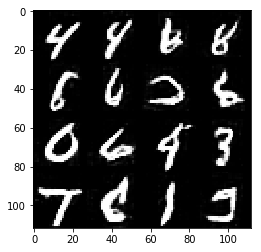

Epoch 2/2... Discriminator Loss: 0.6102... Generator Loss: 1.4094
Epoch 2/2... Discriminator Loss: 0.9987... Generator Loss: 0.8954
Epoch 2/2... Discriminator Loss: 1.2537... Generator Loss: 0.9356
Epoch 2/2... Discriminator Loss: 1.0798... Generator Loss: 0.6523
Epoch 2/2... Discriminator Loss: 0.9228... Generator Loss: 0.8414
Epoch 2/2... Discriminator Loss: 1.2466... Generator Loss: 0.4956
Epoch 2/2... Discriminator Loss: 0.9528... Generator Loss: 1.2547
Epoch 2/2... Discriminator Loss: 0.8717... Generator Loss: 0.6980
Epoch 2/2... Discriminator Loss: 1.0829... Generator Loss: 0.8059
Epoch 2/2... Discriminator Loss: 0.8316... Generator Loss: 0.8391


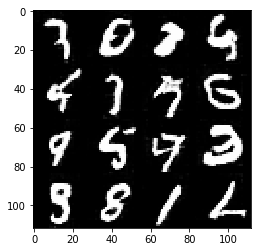

Epoch 2/2... Discriminator Loss: 1.6444... Generator Loss: 0.4144
Epoch 2/2... Discriminator Loss: 1.3303... Generator Loss: 0.8320
Epoch 2/2... Discriminator Loss: 1.0252... Generator Loss: 0.8444
Epoch 2/2... Discriminator Loss: 1.0431... Generator Loss: 0.7959
Epoch 2/2... Discriminator Loss: 0.9771... Generator Loss: 0.7170
Epoch 2/2... Discriminator Loss: 1.4471... Generator Loss: 0.5846
Epoch 2/2... Discriminator Loss: 0.7697... Generator Loss: 1.4752
Epoch 2/2... Discriminator Loss: 0.7624... Generator Loss: 1.1541
Epoch 2/2... Discriminator Loss: 0.9711... Generator Loss: 0.9601
Epoch 2/2... Discriminator Loss: 1.0874... Generator Loss: 0.7119


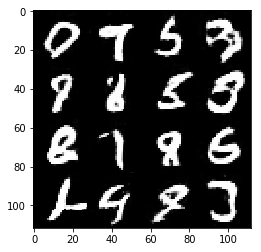

Epoch 2/2... Discriminator Loss: 0.7756... Generator Loss: 1.0620
Epoch 2/2... Discriminator Loss: 1.3958... Generator Loss: 0.5557
Epoch 2/2... Discriminator Loss: 1.3579... Generator Loss: 0.5682
Epoch 2/2... Discriminator Loss: 0.9887... Generator Loss: 0.6710
Epoch 2/2... Discriminator Loss: 1.6509... Generator Loss: 0.5769
Epoch 2/2... Discriminator Loss: 0.8029... Generator Loss: 1.1332
Epoch 2/2... Discriminator Loss: 1.2138... Generator Loss: 1.0177
Epoch 2/2... Discriminator Loss: 1.4855... Generator Loss: 0.5559
Epoch 2/2... Discriminator Loss: 0.8358... Generator Loss: 1.0089
Epoch 2/2... Discriminator Loss: 1.1028... Generator Loss: 0.8382


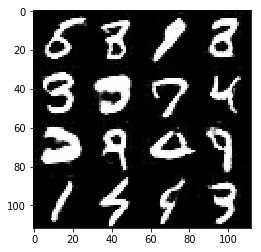

Epoch 2/2... Discriminator Loss: 1.2493... Generator Loss: 0.5060
Epoch 2/2... Discriminator Loss: 1.2275... Generator Loss: 0.7443
Epoch 2/2... Discriminator Loss: 1.1499... Generator Loss: 0.8094
Epoch 2/2... Discriminator Loss: 1.2135... Generator Loss: 0.9794
Epoch 2/2... Discriminator Loss: 1.2789... Generator Loss: 0.5610
Epoch 2/2... Discriminator Loss: 1.2112... Generator Loss: 0.8380
Epoch 2/2... Discriminator Loss: 0.8939... Generator Loss: 0.7748
Epoch 2/2... Discriminator Loss: 0.7105... Generator Loss: 1.3183
Epoch 2/2... Discriminator Loss: 1.2732... Generator Loss: 0.7431
Epoch 2/2... Discriminator Loss: 0.8548... Generator Loss: 1.0912


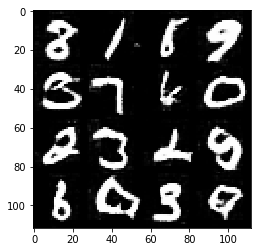

Epoch 2/2... Discriminator Loss: 0.8004... Generator Loss: 1.1211
Epoch 2/2... Discriminator Loss: 1.1237... Generator Loss: 0.8709
Epoch 2/2... Discriminator Loss: 0.8265... Generator Loss: 0.9781
Epoch 2/2... Discriminator Loss: 0.7340... Generator Loss: 1.1014
Epoch 2/2... Discriminator Loss: 0.8065... Generator Loss: 1.0342
Epoch 2/2... Discriminator Loss: 1.1115... Generator Loss: 0.6027
Epoch 2/2... Discriminator Loss: 0.8455... Generator Loss: 0.9603
Epoch 2/2... Discriminator Loss: 0.9531... Generator Loss: 1.0394
Epoch 2/2... Discriminator Loss: 0.8819... Generator Loss: 0.9378
Epoch 2/2... Discriminator Loss: 1.0810... Generator Loss: 0.7986


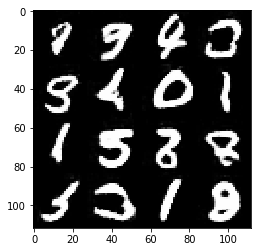

Epoch 2/2... Discriminator Loss: 0.7423... Generator Loss: 1.2002
Epoch 2/2... Discriminator Loss: 0.8882... Generator Loss: 0.9433
Epoch 2/2... Discriminator Loss: 1.0094... Generator Loss: 1.1101
Epoch 2/2... Discriminator Loss: 1.4148... Generator Loss: 0.4480
Epoch 2/2... Discriminator Loss: 1.5929... Generator Loss: 0.5074
Epoch 2/2... Discriminator Loss: 1.3523... Generator Loss: 0.7273
Epoch 2/2... Discriminator Loss: 0.8129... Generator Loss: 1.0128
Epoch 2/2... Discriminator Loss: 1.2259... Generator Loss: 1.0903
Epoch 2/2... Discriminator Loss: 0.8348... Generator Loss: 0.8308
Epoch 2/2... Discriminator Loss: 1.2844... Generator Loss: 0.7770


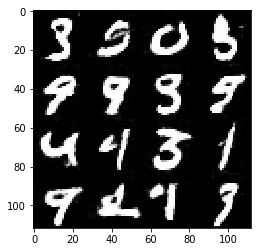

Epoch 2/2... Discriminator Loss: 1.0658... Generator Loss: 0.7448
Epoch 2/2... Discriminator Loss: 1.0255... Generator Loss: 0.9138
Epoch 2/2... Discriminator Loss: 1.0602... Generator Loss: 0.8693
Epoch 2/2... Discriminator Loss: 1.4519... Generator Loss: 0.5074
Epoch 2/2... Discriminator Loss: 1.4009... Generator Loss: 0.6039
Epoch 2/2... Discriminator Loss: 1.1370... Generator Loss: 0.7128
Epoch 2/2... Discriminator Loss: 1.1671... Generator Loss: 1.5046
Epoch 2/2... Discriminator Loss: 1.0353... Generator Loss: 0.9307
Epoch 2/2... Discriminator Loss: 1.0764... Generator Loss: 0.9345
Epoch 2/2... Discriminator Loss: 0.9373... Generator Loss: 0.8320


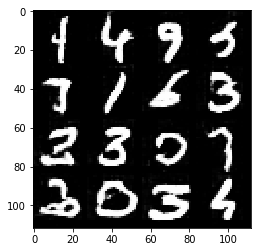

Epoch 2/2... Discriminator Loss: 1.0219... Generator Loss: 0.7365
Epoch 2/2... Discriminator Loss: 1.2194... Generator Loss: 0.8127
Epoch 2/2... Discriminator Loss: 0.9916... Generator Loss: 0.9031
Epoch 2/2... Discriminator Loss: 1.1392... Generator Loss: 0.8180
Epoch 2/2... Discriminator Loss: 1.0141... Generator Loss: 0.9939
Epoch 2/2... Discriminator Loss: 0.5942... Generator Loss: 1.2313
Epoch 2/2... Discriminator Loss: 1.6352... Generator Loss: 0.4385
Epoch 2/2... Discriminator Loss: 1.1406... Generator Loss: 0.8900
Epoch 2/2... Discriminator Loss: 1.2028... Generator Loss: 0.6531
Epoch 2/2... Discriminator Loss: 1.0007... Generator Loss: 0.9541


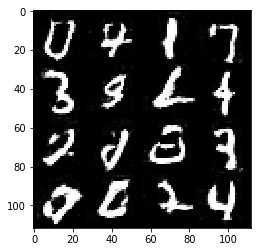

Epoch 2/2... Discriminator Loss: 1.2851... Generator Loss: 0.7339
Epoch 2/2... Discriminator Loss: 1.2664... Generator Loss: 0.6703
Epoch 2/2... Discriminator Loss: 0.6358... Generator Loss: 1.5302
Epoch 2/2... Discriminator Loss: 0.7944... Generator Loss: 0.9011
Epoch 2/2... Discriminator Loss: 0.8698... Generator Loss: 1.1511
Epoch 2/2... Discriminator Loss: 1.3223... Generator Loss: 0.7345
Epoch 2/2... Discriminator Loss: 1.0377... Generator Loss: 0.8308
Epoch 2/2... Discriminator Loss: 0.6589... Generator Loss: 1.1039
Epoch 2/2... Discriminator Loss: 0.9495... Generator Loss: 1.1152
Epoch 2/2... Discriminator Loss: 0.8359... Generator Loss: 1.0649


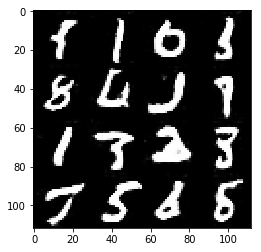

Epoch 2/2... Discriminator Loss: 0.8032... Generator Loss: 1.1804
Epoch 2/2... Discriminator Loss: 0.8715... Generator Loss: 1.1104
Epoch 2/2... Discriminator Loss: 1.2448... Generator Loss: 0.8463
Epoch 2/2... Discriminator Loss: 0.8439... Generator Loss: 1.0799
Epoch 2/2... Discriminator Loss: 0.7588... Generator Loss: 1.1015
Epoch 2/2... Discriminator Loss: 0.7059... Generator Loss: 1.0374
Epoch 2/2... Discriminator Loss: 0.7484... Generator Loss: 1.0097
Epoch 2/2... Discriminator Loss: 0.4269... Generator Loss: 1.6579
Epoch 2/2... Discriminator Loss: 1.0421... Generator Loss: 0.7013
Epoch 2/2... Discriminator Loss: 0.8298... Generator Loss: 0.9381


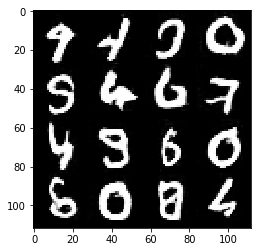

Epoch 2/2... Discriminator Loss: 1.1699... Generator Loss: 0.5936
Epoch 2/2... Discriminator Loss: 1.2079... Generator Loss: 1.0446
Epoch 2/2... Discriminator Loss: 0.7541... Generator Loss: 1.1289
Epoch 2/2... Discriminator Loss: 1.1816... Generator Loss: 0.7018
Epoch 2/2... Discriminator Loss: 0.8680... Generator Loss: 0.9827
Epoch 2/2... Discriminator Loss: 1.0478... Generator Loss: 0.8090
Epoch 2/2... Discriminator Loss: 1.0748... Generator Loss: 0.7375
Epoch 2/2... Discriminator Loss: 1.5748... Generator Loss: 0.6268
Epoch 2/2... Discriminator Loss: 1.2727... Generator Loss: 0.7013
Epoch 2/2... Discriminator Loss: 1.2348... Generator Loss: 0.6480


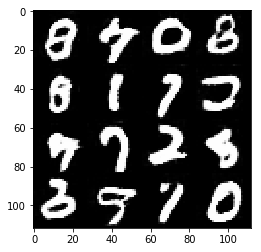

Epoch 2/2... Discriminator Loss: 0.8753... Generator Loss: 1.0351
Epoch 2/2... Discriminator Loss: 0.8732... Generator Loss: 0.9979
Epoch 2/2... Discriminator Loss: 1.1415... Generator Loss: 0.5516
Epoch 2/2... Discriminator Loss: 0.7540... Generator Loss: 0.9927
Epoch 2/2... Discriminator Loss: 0.9754... Generator Loss: 0.9819
Epoch 2/2... Discriminator Loss: 1.1406... Generator Loss: 0.6783
Epoch 2/2... Discriminator Loss: 1.0750... Generator Loss: 0.7343
Epoch 2/2... Discriminator Loss: 0.8361... Generator Loss: 0.9514
Epoch 2/2... Discriminator Loss: 1.2236... Generator Loss: 1.2187
Epoch 2/2... Discriminator Loss: 0.7434... Generator Loss: 1.0778


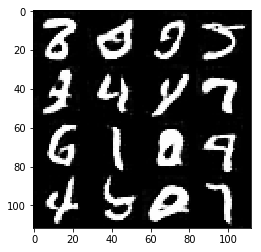

Epoch 2/2... Discriminator Loss: 0.7009... Generator Loss: 1.0283
Epoch 2/2... Discriminator Loss: 1.1956... Generator Loss: 0.7326
Epoch 2/2... Discriminator Loss: 1.0297... Generator Loss: 0.9652
Epoch 2/2... Discriminator Loss: 0.6711... Generator Loss: 1.0072
Epoch 2/2... Discriminator Loss: 1.2415... Generator Loss: 0.6446
Epoch 2/2... Discriminator Loss: 0.9763... Generator Loss: 0.8856
Epoch 2/2... Discriminator Loss: 0.8995... Generator Loss: 0.9226
Epoch 2/2... Discriminator Loss: 1.2655... Generator Loss: 0.9019
Epoch 2/2... Discriminator Loss: 0.7436... Generator Loss: 0.9424
Epoch 2/2... Discriminator Loss: 0.8860... Generator Loss: 0.9487


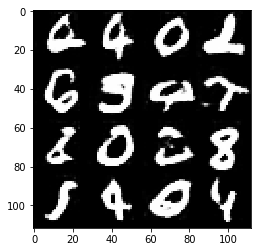

Epoch 2/2... Discriminator Loss: 1.4766... Generator Loss: 1.2343
Epoch 2/2... Discriminator Loss: 0.9176... Generator Loss: 1.0024
Epoch 2/2... Discriminator Loss: 1.5594... Generator Loss: 0.4819
Epoch 2/2... Discriminator Loss: 0.6937... Generator Loss: 0.9188
Epoch 2/2... Discriminator Loss: 1.1115... Generator Loss: 0.7168
Epoch 2/2... Discriminator Loss: 1.0923... Generator Loss: 0.8227
Epoch 2/2... Discriminator Loss: 1.0531... Generator Loss: 0.7866
Epoch 2/2... Discriminator Loss: 1.1932... Generator Loss: 0.6342
Epoch 2/2... Discriminator Loss: 1.9647... Generator Loss: 0.3000
Epoch 2/2... Discriminator Loss: 1.0372... Generator Loss: 0.6930


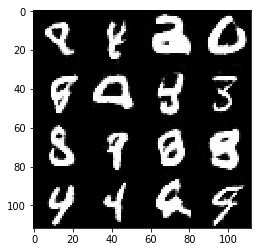

Epoch 2/2... Discriminator Loss: 0.9362... Generator Loss: 0.9748
Epoch 2/2... Discriminator Loss: 0.8994... Generator Loss: 0.8553
Epoch 2/2... Discriminator Loss: 1.2318... Generator Loss: 0.6648
Epoch 2/2... Discriminator Loss: 1.3041... Generator Loss: 0.7597
Epoch 2/2... Discriminator Loss: 1.5485... Generator Loss: 0.5179
Epoch 2/2... Discriminator Loss: 1.2505... Generator Loss: 0.5912
Epoch 2/2... Discriminator Loss: 0.9003... Generator Loss: 1.0572
Epoch 2/2... Discriminator Loss: 0.6879... Generator Loss: 1.3380
Epoch 2/2... Discriminator Loss: 1.1029... Generator Loss: 0.4904
Epoch 2/2... Discriminator Loss: 0.7789... Generator Loss: 0.8466


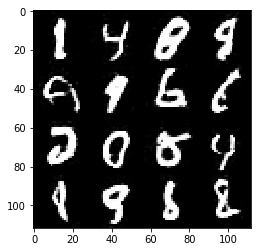

Epoch 2/2... Discriminator Loss: 1.0110... Generator Loss: 0.7690
Epoch 2/2... Discriminator Loss: 0.8766... Generator Loss: 1.1411
Epoch 2/2... Discriminator Loss: 1.0912... Generator Loss: 0.8898
Epoch 2/2... Discriminator Loss: 1.1908... Generator Loss: 0.7378
Epoch 2/2... Discriminator Loss: 0.7107... Generator Loss: 1.0844
Epoch 2/2... Discriminator Loss: 1.0459... Generator Loss: 0.8219
Epoch 2/2... Discriminator Loss: 1.0951... Generator Loss: 0.6572
Epoch 2/2... Discriminator Loss: 1.1010... Generator Loss: 0.7600
Epoch 2/2... Discriminator Loss: 1.0542... Generator Loss: 1.1218
Epoch 2/2... Discriminator Loss: 0.7005... Generator Loss: 1.2401


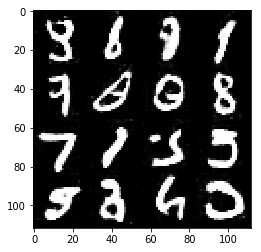

Epoch 2/2... Discriminator Loss: 1.1237... Generator Loss: 0.4575
Epoch 2/2... Discriminator Loss: 0.7349... Generator Loss: 1.8695
Epoch 2/2... Discriminator Loss: 0.9898... Generator Loss: 0.8599
Epoch 2/2... Discriminator Loss: 1.2293... Generator Loss: 0.6493
Epoch 2/2... Discriminator Loss: 1.2102... Generator Loss: 0.7970
Epoch 2/2... Discriminator Loss: 1.0893... Generator Loss: 0.8242
Epoch 2/2... Discriminator Loss: 1.0628... Generator Loss: 0.9751
Epoch 2/2... Discriminator Loss: 1.0677... Generator Loss: 0.7401
Epoch 2/2... Discriminator Loss: 0.9476... Generator Loss: 0.9096
Epoch 2/2... Discriminator Loss: 0.9944... Generator Loss: 1.0810


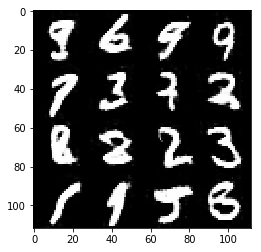

Epoch 2/2... Discriminator Loss: 1.7687... Generator Loss: 0.4774
Epoch 2/2... Discriminator Loss: 0.9163... Generator Loss: 1.0476
Epoch 2/2... Discriminator Loss: 1.1670... Generator Loss: 0.7398
Epoch 2/2... Discriminator Loss: 0.8268... Generator Loss: 1.2654
Epoch 2/2... Discriminator Loss: 0.8825... Generator Loss: 1.3438
Epoch 2/2... Discriminator Loss: 0.9098... Generator Loss: 0.8251
Epoch 2/2... Discriminator Loss: 0.6511... Generator Loss: 1.3710
Epoch 2/2... Discriminator Loss: 0.8233... Generator Loss: 0.9614
Epoch 2/2... Discriminator Loss: 0.8014... Generator Loss: 1.0533
Epoch 2/2... Discriminator Loss: 1.3673... Generator Loss: 0.5346


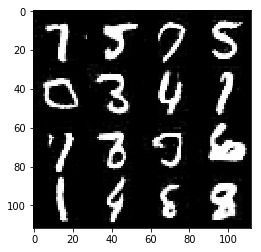

Epoch 2/2... Discriminator Loss: 0.8466... Generator Loss: 1.0494
Epoch 2/2... Discriminator Loss: 0.9183... Generator Loss: 0.7991
Epoch 2/2... Discriminator Loss: 0.7774... Generator Loss: 0.8763
Epoch 2/2... Discriminator Loss: 1.3873... Generator Loss: 0.6676
Epoch 2/2... Discriminator Loss: 1.1852... Generator Loss: 0.6508
Epoch 2/2... Discriminator Loss: 0.9033... Generator Loss: 1.2225
Epoch 2/2... Discriminator Loss: 1.2346... Generator Loss: 0.6906
Epoch 2/2... Discriminator Loss: 0.9836... Generator Loss: 0.8950
Epoch 2/2... Discriminator Loss: 1.2424... Generator Loss: 0.6287
Epoch 2/2... Discriminator Loss: 0.8009... Generator Loss: 0.9990


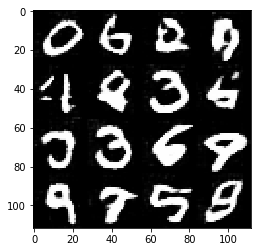

Epoch 2/2... Discriminator Loss: 1.0043... Generator Loss: 0.8452
Epoch 2/2... Discriminator Loss: 0.8252... Generator Loss: 1.0712
Epoch 2/2... Discriminator Loss: 0.8363... Generator Loss: 0.9173
Epoch 2/2... Discriminator Loss: 1.4512... Generator Loss: 0.4459
Epoch 2/2... Discriminator Loss: 1.3178... Generator Loss: 0.4367
Epoch 2/2... Discriminator Loss: 1.1113... Generator Loss: 0.8643
Epoch 2/2... Discriminator Loss: 1.1630... Generator Loss: 0.5215
Epoch 2/2... Discriminator Loss: 1.0763... Generator Loss: 0.7917
Epoch 2/2... Discriminator Loss: 0.8472... Generator Loss: 0.8900
Epoch 2/2... Discriminator Loss: 0.7970... Generator Loss: 1.2278


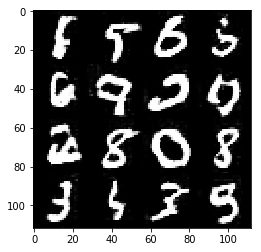

In [ ]:
batch_size = 8
z_dim = 100
learning_rate = 0.00005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.0796... Generator Loss: 0.1940
Epoch 1/1... Discriminator Loss: 2.4436... Generator Loss: 0.1008
Epoch 1/1... Discriminator Loss: 2.7341... Generator Loss: 0.2029
Epoch 1/1... Discriminator Loss: 2.1775... Generator Loss: 0.1850
Epoch 1/1... Discriminator Loss: 1.4964... Generator Loss: 0.5104
Epoch 1/1... Discriminator Loss: 1.1760... Generator Loss: 0.8411
Epoch 1/1... Discriminator Loss: 1.1624... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.3596... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.5032... Generator Loss: 0.4170
Epoch 1/1... Discriminator Loss: 0.9318... Generator Loss: 0.7519


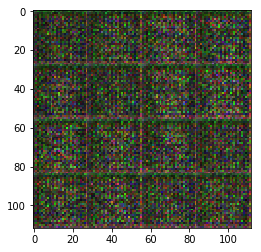

Epoch 1/1... Discriminator Loss: 1.3145... Generator Loss: 0.7933
Epoch 1/1... Discriminator Loss: 1.6148... Generator Loss: 0.6306
Epoch 1/1... Discriminator Loss: 0.8534... Generator Loss: 1.2720
Epoch 1/1... Discriminator Loss: 1.5517... Generator Loss: 0.8497
Epoch 1/1... Discriminator Loss: 1.0371... Generator Loss: 0.8824
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.8121
Epoch 1/1... Discriminator Loss: 0.9092... Generator Loss: 1.0422
Epoch 1/1... Discriminator Loss: 0.6757... Generator Loss: 1.1508
Epoch 1/1... Discriminator Loss: 1.0849... Generator Loss: 0.8364
Epoch 1/1... Discriminator Loss: 0.5831... Generator Loss: 1.2593


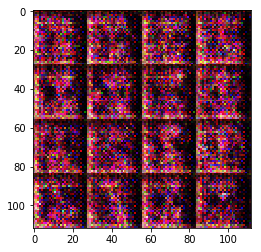

Epoch 1/1... Discriminator Loss: 0.6179... Generator Loss: 1.2145
Epoch 1/1... Discriminator Loss: 0.7717... Generator Loss: 1.1218
Epoch 1/1... Discriminator Loss: 0.9166... Generator Loss: 0.9157
Epoch 1/1... Discriminator Loss: 0.6034... Generator Loss: 1.7943
Epoch 1/1... Discriminator Loss: 0.8853... Generator Loss: 1.0933
Epoch 1/1... Discriminator Loss: 0.8131... Generator Loss: 0.9700
Epoch 1/1... Discriminator Loss: 0.7310... Generator Loss: 1.1700
Epoch 1/1... Discriminator Loss: 1.6156... Generator Loss: 0.6088
Epoch 1/1... Discriminator Loss: 0.6982... Generator Loss: 1.1211
Epoch 1/1... Discriminator Loss: 1.1861... Generator Loss: 0.8813


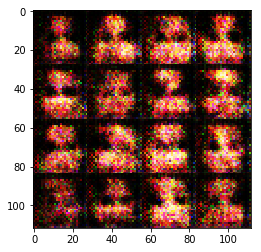

Epoch 1/1... Discriminator Loss: 0.7984... Generator Loss: 1.0394
Epoch 1/1... Discriminator Loss: 0.6021... Generator Loss: 1.3799
Epoch 1/1... Discriminator Loss: 1.0200... Generator Loss: 0.9055
Epoch 1/1... Discriminator Loss: 0.4613... Generator Loss: 1.5279
Epoch 1/1... Discriminator Loss: 0.8241... Generator Loss: 1.1352
Epoch 1/1... Discriminator Loss: 0.6007... Generator Loss: 1.1992
Epoch 1/1... Discriminator Loss: 0.6910... Generator Loss: 1.3543
Epoch 1/1... Discriminator Loss: 0.6947... Generator Loss: 1.5074
Epoch 1/1... Discriminator Loss: 0.5975... Generator Loss: 1.0723
Epoch 1/1... Discriminator Loss: 0.7751... Generator Loss: 1.4335


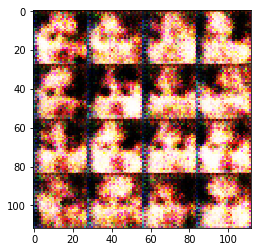

Epoch 1/1... Discriminator Loss: 1.0542... Generator Loss: 0.8566
Epoch 1/1... Discriminator Loss: 0.6987... Generator Loss: 1.1761
Epoch 1/1... Discriminator Loss: 0.9213... Generator Loss: 1.0923
Epoch 1/1... Discriminator Loss: 1.1194... Generator Loss: 1.3388
Epoch 1/1... Discriminator Loss: 0.7431... Generator Loss: 0.9680
Epoch 1/1... Discriminator Loss: 0.5320... Generator Loss: 1.4443
Epoch 1/1... Discriminator Loss: 0.2183... Generator Loss: 2.5120
Epoch 1/1... Discriminator Loss: 0.3506... Generator Loss: 1.9246
Epoch 1/1... Discriminator Loss: 0.5339... Generator Loss: 1.3016
Epoch 1/1... Discriminator Loss: 0.3528... Generator Loss: 1.7403


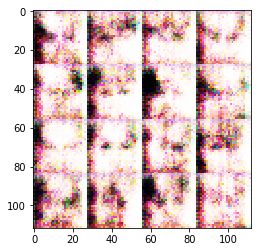

Epoch 1/1... Discriminator Loss: 0.1949... Generator Loss: 2.4026
Epoch 1/1... Discriminator Loss: 0.3105... Generator Loss: 2.0467
Epoch 1/1... Discriminator Loss: 0.1542... Generator Loss: 2.8882
Epoch 1/1... Discriminator Loss: 0.5102... Generator Loss: 1.0802
Epoch 1/1... Discriminator Loss: 0.4266... Generator Loss: 1.6658
Epoch 1/1... Discriminator Loss: 0.4480... Generator Loss: 1.8416
Epoch 1/1... Discriminator Loss: 0.4714... Generator Loss: 1.9363
Epoch 1/1... Discriminator Loss: 0.2872... Generator Loss: 2.0278
Epoch 1/1... Discriminator Loss: 0.7158... Generator Loss: 1.5877
Epoch 1/1... Discriminator Loss: 0.8198... Generator Loss: 0.9128


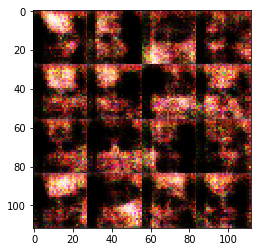

Epoch 1/1... Discriminator Loss: 0.3577... Generator Loss: 1.8875
Epoch 1/1... Discriminator Loss: 0.6429... Generator Loss: 1.2956
Epoch 1/1... Discriminator Loss: 0.4588... Generator Loss: 2.5975
Epoch 1/1... Discriminator Loss: 0.5568... Generator Loss: 1.4211
Epoch 1/1... Discriminator Loss: 0.6923... Generator Loss: 1.5225
Epoch 1/1... Discriminator Loss: 0.3100... Generator Loss: 2.2112
Epoch 1/1... Discriminator Loss: 0.3708... Generator Loss: 1.7851
Epoch 1/1... Discriminator Loss: 0.3639... Generator Loss: 1.5073
Epoch 1/1... Discriminator Loss: 0.4533... Generator Loss: 1.6626
Epoch 1/1... Discriminator Loss: 0.5113... Generator Loss: 1.7695


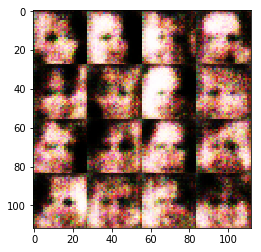

Epoch 1/1... Discriminator Loss: 0.3981... Generator Loss: 2.0502
Epoch 1/1... Discriminator Loss: 0.8569... Generator Loss: 1.3013
Epoch 1/1... Discriminator Loss: 0.2921... Generator Loss: 1.6178
Epoch 1/1... Discriminator Loss: 0.3128... Generator Loss: 1.8454
Epoch 1/1... Discriminator Loss: 0.9908... Generator Loss: 0.9472
Epoch 1/1... Discriminator Loss: 0.2830... Generator Loss: 2.3156
Epoch 1/1... Discriminator Loss: 0.6434... Generator Loss: 2.0935
Epoch 1/1... Discriminator Loss: 0.3963... Generator Loss: 1.9614
Epoch 1/1... Discriminator Loss: 1.0386... Generator Loss: 1.2970
Epoch 1/1... Discriminator Loss: 0.5066... Generator Loss: 2.0191


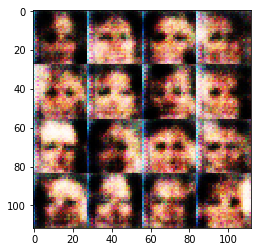

Epoch 1/1... Discriminator Loss: 0.7839... Generator Loss: 1.3098
Epoch 1/1... Discriminator Loss: 0.8191... Generator Loss: 1.3667
Epoch 1/1... Discriminator Loss: 0.3293... Generator Loss: 1.6862
Epoch 1/1... Discriminator Loss: 0.2931... Generator Loss: 2.6744
Epoch 1/1... Discriminator Loss: 0.3402... Generator Loss: 1.8501
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 0.7738
Epoch 1/1... Discriminator Loss: 0.5067... Generator Loss: 1.5107
Epoch 1/1... Discriminator Loss: 0.3447... Generator Loss: 1.7903
Epoch 1/1... Discriminator Loss: 0.7319... Generator Loss: 1.0388
Epoch 1/1... Discriminator Loss: 0.3372... Generator Loss: 2.0932


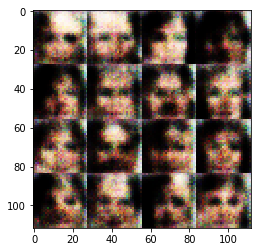

Epoch 1/1... Discriminator Loss: 0.7421... Generator Loss: 1.0556
Epoch 1/1... Discriminator Loss: 0.5120... Generator Loss: 1.2925
Epoch 1/1... Discriminator Loss: 0.2691... Generator Loss: 2.5536
Epoch 1/1... Discriminator Loss: 0.8441... Generator Loss: 1.2175
Epoch 1/1... Discriminator Loss: 0.6333... Generator Loss: 1.2771
Epoch 1/1... Discriminator Loss: 0.2769... Generator Loss: 1.8315
Epoch 1/1... Discriminator Loss: 0.5320... Generator Loss: 1.7081
Epoch 1/1... Discriminator Loss: 0.3372... Generator Loss: 2.2021
Epoch 1/1... Discriminator Loss: 0.6607... Generator Loss: 1.1200
Epoch 1/1... Discriminator Loss: 0.2864... Generator Loss: 1.7598


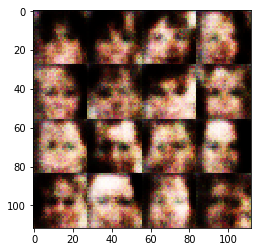

Epoch 1/1... Discriminator Loss: 0.4087... Generator Loss: 1.7099
Epoch 1/1... Discriminator Loss: 0.5772... Generator Loss: 1.8096
Epoch 1/1... Discriminator Loss: 0.4307... Generator Loss: 1.9292
Epoch 1/1... Discriminator Loss: 0.7781... Generator Loss: 0.8666
Epoch 1/1... Discriminator Loss: 0.9931... Generator Loss: 0.9036
Epoch 1/1... Discriminator Loss: 0.4076... Generator Loss: 1.8197
Epoch 1/1... Discriminator Loss: 0.7982... Generator Loss: 1.0261
Epoch 1/1... Discriminator Loss: 0.3721... Generator Loss: 1.7669
Epoch 1/1... Discriminator Loss: 0.3953... Generator Loss: 1.5182
Epoch 1/1... Discriminator Loss: 0.7231... Generator Loss: 1.5764


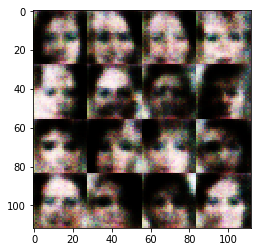

Epoch 1/1... Discriminator Loss: 0.4120... Generator Loss: 1.4262
Epoch 1/1... Discriminator Loss: 0.4266... Generator Loss: 1.4909
Epoch 1/1... Discriminator Loss: 0.2475... Generator Loss: 2.2303
Epoch 1/1... Discriminator Loss: 0.8954... Generator Loss: 0.8991
Epoch 1/1... Discriminator Loss: 0.3048... Generator Loss: 1.9408
Epoch 1/1... Discriminator Loss: 0.4794... Generator Loss: 1.7674
Epoch 1/1... Discriminator Loss: 0.4399... Generator Loss: 1.1989
Epoch 1/1... Discriminator Loss: 0.5020... Generator Loss: 1.5452
Epoch 1/1... Discriminator Loss: 0.4895... Generator Loss: 1.9691
Epoch 1/1... Discriminator Loss: 0.4390... Generator Loss: 1.2515


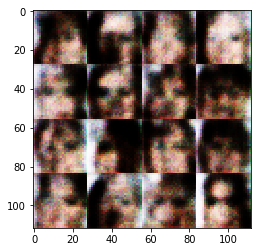

Epoch 1/1... Discriminator Loss: 0.6828... Generator Loss: 1.2158
Epoch 1/1... Discriminator Loss: 0.4099... Generator Loss: 2.2763
Epoch 1/1... Discriminator Loss: 0.3411... Generator Loss: 1.6217
Epoch 1/1... Discriminator Loss: 0.3934... Generator Loss: 1.8442
Epoch 1/1... Discriminator Loss: 0.5850... Generator Loss: 1.5261
Epoch 1/1... Discriminator Loss: 0.6440... Generator Loss: 1.2284
Epoch 1/1... Discriminator Loss: 0.6215... Generator Loss: 1.1849
Epoch 1/1... Discriminator Loss: 0.5340... Generator Loss: 1.5927
Epoch 1/1... Discriminator Loss: 0.6402... Generator Loss: 1.2517
Epoch 1/1... Discriminator Loss: 0.2850... Generator Loss: 1.8125


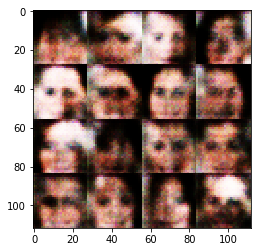

Epoch 1/1... Discriminator Loss: 0.3641... Generator Loss: 1.7706
Epoch 1/1... Discriminator Loss: 0.7061... Generator Loss: 1.1005
Epoch 1/1... Discriminator Loss: 0.6259... Generator Loss: 1.0362
Epoch 1/1... Discriminator Loss: 0.8072... Generator Loss: 1.1359
Epoch 1/1... Discriminator Loss: 0.8887... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 0.4714... Generator Loss: 1.2585
Epoch 1/1... Discriminator Loss: 0.6022... Generator Loss: 1.7322
Epoch 1/1... Discriminator Loss: 1.0402... Generator Loss: 1.1887
Epoch 1/1... Discriminator Loss: 0.4899... Generator Loss: 1.4332
Epoch 1/1... Discriminator Loss: 0.7290... Generator Loss: 0.9078


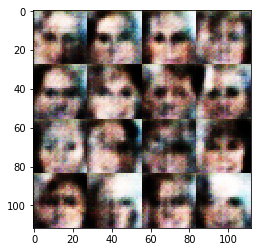

Epoch 1/1... Discriminator Loss: 0.9032... Generator Loss: 0.8116
Epoch 1/1... Discriminator Loss: 0.5099... Generator Loss: 2.2735
Epoch 1/1... Discriminator Loss: 0.6790... Generator Loss: 1.3672
Epoch 1/1... Discriminator Loss: 0.5973... Generator Loss: 1.3031
Epoch 1/1... Discriminator Loss: 0.8031... Generator Loss: 1.1137
Epoch 1/1... Discriminator Loss: 0.5356... Generator Loss: 1.5789
Epoch 1/1... Discriminator Loss: 0.6277... Generator Loss: 1.2999
Epoch 1/1... Discriminator Loss: 1.1080... Generator Loss: 0.4711
Epoch 1/1... Discriminator Loss: 0.9090... Generator Loss: 1.2037
Epoch 1/1... Discriminator Loss: 0.4688... Generator Loss: 1.4456


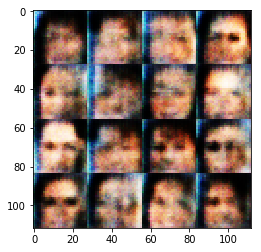

Epoch 1/1... Discriminator Loss: 0.4084... Generator Loss: 1.8791
Epoch 1/1... Discriminator Loss: 0.6082... Generator Loss: 1.1274
Epoch 1/1... Discriminator Loss: 0.4364... Generator Loss: 1.6392
Epoch 1/1... Discriminator Loss: 1.6294... Generator Loss: 0.8810
Epoch 1/1... Discriminator Loss: 0.8711... Generator Loss: 1.0167
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.8709
Epoch 1/1... Discriminator Loss: 1.2512... Generator Loss: 0.6676
Epoch 1/1... Discriminator Loss: 0.7023... Generator Loss: 1.1070
Epoch 1/1... Discriminator Loss: 1.2148... Generator Loss: 0.6810
Epoch 1/1... Discriminator Loss: 0.6928... Generator Loss: 1.1261


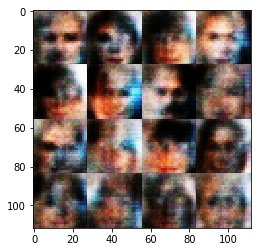

Epoch 1/1... Discriminator Loss: 0.7918... Generator Loss: 1.0226
Epoch 1/1... Discriminator Loss: 0.5165... Generator Loss: 1.5735
Epoch 1/1... Discriminator Loss: 1.0483... Generator Loss: 0.9367
Epoch 1/1... Discriminator Loss: 0.3509... Generator Loss: 1.9108
Epoch 1/1... Discriminator Loss: 0.2490... Generator Loss: 2.8521
Epoch 1/1... Discriminator Loss: 0.3435... Generator Loss: 1.2931
Epoch 1/1... Discriminator Loss: 0.6818... Generator Loss: 0.8858
Epoch 1/1... Discriminator Loss: 0.5636... Generator Loss: 1.6001
Epoch 1/1... Discriminator Loss: 0.5627... Generator Loss: 1.6065
Epoch 1/1... Discriminator Loss: 0.3413... Generator Loss: 2.6432


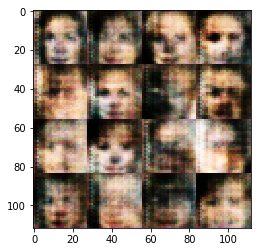

Epoch 1/1... Discriminator Loss: 0.6471... Generator Loss: 1.0231
Epoch 1/1... Discriminator Loss: 0.5478... Generator Loss: 2.0845
Epoch 1/1... Discriminator Loss: 0.6540... Generator Loss: 0.9622
Epoch 1/1... Discriminator Loss: 1.2976... Generator Loss: 0.6744
Epoch 1/1... Discriminator Loss: 0.8724... Generator Loss: 0.5280
Epoch 1/1... Discriminator Loss: 0.7868... Generator Loss: 1.3018
Epoch 1/1... Discriminator Loss: 0.6152... Generator Loss: 1.2807
Epoch 1/1... Discriminator Loss: 0.5738... Generator Loss: 1.1822
Epoch 1/1... Discriminator Loss: 0.9044... Generator Loss: 1.0732
Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.7063


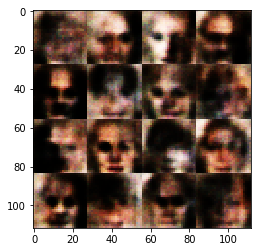

Epoch 1/1... Discriminator Loss: 0.8759... Generator Loss: 1.2202
Epoch 1/1... Discriminator Loss: 0.7119... Generator Loss: 1.6624
Epoch 1/1... Discriminator Loss: 0.5302... Generator Loss: 1.5178
Epoch 1/1... Discriminator Loss: 0.7291... Generator Loss: 1.0633
Epoch 1/1... Discriminator Loss: 1.1172... Generator Loss: 1.0829
Epoch 1/1... Discriminator Loss: 0.5975... Generator Loss: 1.3854
Epoch 1/1... Discriminator Loss: 0.6865... Generator Loss: 1.2850
Epoch 1/1... Discriminator Loss: 0.3659... Generator Loss: 1.5571
Epoch 1/1... Discriminator Loss: 0.6675... Generator Loss: 1.5907
Epoch 1/1... Discriminator Loss: 0.9248... Generator Loss: 1.1677


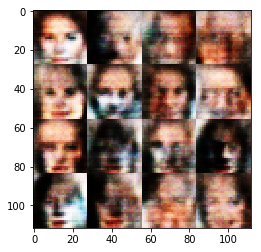

Epoch 1/1... Discriminator Loss: 0.6543... Generator Loss: 0.8023
Epoch 1/1... Discriminator Loss: 0.6724... Generator Loss: 1.5277
Epoch 1/1... Discriminator Loss: 0.7058... Generator Loss: 1.2111
Epoch 1/1... Discriminator Loss: 0.7511... Generator Loss: 1.2215
Epoch 1/1... Discriminator Loss: 0.8620... Generator Loss: 1.0438
Epoch 1/1... Discriminator Loss: 0.8710... Generator Loss: 0.9703
Epoch 1/1... Discriminator Loss: 0.7016... Generator Loss: 1.1358
Epoch 1/1... Discriminator Loss: 0.9448... Generator Loss: 0.9027
Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 0.6217
Epoch 1/1... Discriminator Loss: 1.1796... Generator Loss: 0.4265


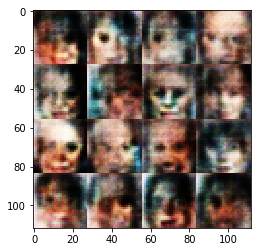

Epoch 1/1... Discriminator Loss: 0.6406... Generator Loss: 1.7024
Epoch 1/1... Discriminator Loss: 0.9918... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 0.3149... Generator Loss: 2.0930
Epoch 1/1... Discriminator Loss: 0.2544... Generator Loss: 2.4400
Epoch 1/1... Discriminator Loss: 0.2798... Generator Loss: 2.3003
Epoch 1/1... Discriminator Loss: 0.9924... Generator Loss: 0.8585
Epoch 1/1... Discriminator Loss: 0.5645... Generator Loss: 1.5423
Epoch 1/1... Discriminator Loss: 0.4171... Generator Loss: 1.9983
Epoch 1/1... Discriminator Loss: 0.5466... Generator Loss: 1.2916
Epoch 1/1... Discriminator Loss: 0.7610... Generator Loss: 1.5032


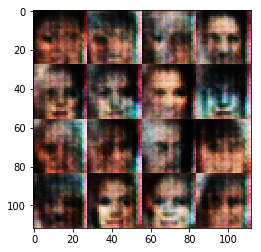

Epoch 1/1... Discriminator Loss: 0.5967... Generator Loss: 1.8704
Epoch 1/1... Discriminator Loss: 0.3946... Generator Loss: 2.2493
Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 1.2533
Epoch 1/1... Discriminator Loss: 0.5096... Generator Loss: 2.8665
Epoch 1/1... Discriminator Loss: 0.5668... Generator Loss: 1.8261
Epoch 1/1... Discriminator Loss: 1.0773... Generator Loss: 0.9479
Epoch 1/1... Discriminator Loss: 0.7069... Generator Loss: 1.2132
Epoch 1/1... Discriminator Loss: 0.2960... Generator Loss: 2.3230
Epoch 1/1... Discriminator Loss: 0.8200... Generator Loss: 0.8468
Epoch 1/1... Discriminator Loss: 0.7119... Generator Loss: 1.0831


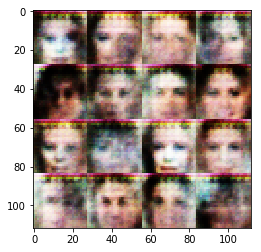

Epoch 1/1... Discriminator Loss: 0.5065... Generator Loss: 1.6278
Epoch 1/1... Discriminator Loss: 0.6335... Generator Loss: 1.2127
Epoch 1/1... Discriminator Loss: 0.3898... Generator Loss: 2.0012
Epoch 1/1... Discriminator Loss: 0.7029... Generator Loss: 1.4202
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 1.1207
Epoch 1/1... Discriminator Loss: 0.6416... Generator Loss: 1.4402
Epoch 1/1... Discriminator Loss: 0.7394... Generator Loss: 1.0139
Epoch 1/1... Discriminator Loss: 0.8393... Generator Loss: 1.1792
Epoch 1/1... Discriminator Loss: 0.9389... Generator Loss: 0.8794
Epoch 1/1... Discriminator Loss: 1.0190... Generator Loss: 0.6387


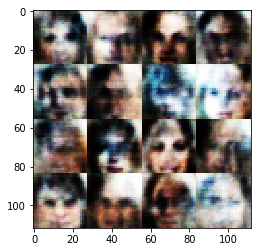

Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 0.5252... Generator Loss: 1.5875
Epoch 1/1... Discriminator Loss: 1.1864... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 0.5125... Generator Loss: 1.5334
Epoch 1/1... Discriminator Loss: 0.9755... Generator Loss: 0.6126
Epoch 1/1... Discriminator Loss: 1.1360... Generator Loss: 0.9552
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.7063... Generator Loss: 0.4406
Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.4715
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.8277


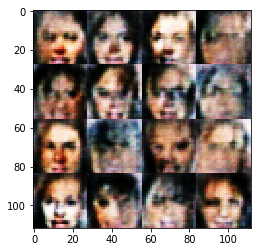

Epoch 1/1... Discriminator Loss: 1.0725... Generator Loss: 0.7705
Epoch 1/1... Discriminator Loss: 1.3572... Generator Loss: 0.4875
Epoch 1/1... Discriminator Loss: 0.8803... Generator Loss: 0.8282
Epoch 1/1... Discriminator Loss: 1.1099... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 0.8972... Generator Loss: 1.1715
Epoch 1/1... Discriminator Loss: 0.8577... Generator Loss: 1.3437
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.7180
Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 0.7088... Generator Loss: 1.3433
Epoch 1/1... Discriminator Loss: 0.9027... Generator Loss: 1.0105


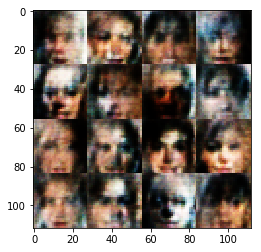

Epoch 1/1... Discriminator Loss: 1.6482... Generator Loss: 0.3863
Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 0.5001
Epoch 1/1... Discriminator Loss: 1.0898... Generator Loss: 0.5309
Epoch 1/1... Discriminator Loss: 0.9218... Generator Loss: 0.9745
Epoch 1/1... Discriminator Loss: 1.1620... Generator Loss: 0.8130
Epoch 1/1... Discriminator Loss: 0.7021... Generator Loss: 0.8960
Epoch 1/1... Discriminator Loss: 0.9852... Generator Loss: 0.7130
Epoch 1/1... Discriminator Loss: 0.9247... Generator Loss: 1.0682
Epoch 1/1... Discriminator Loss: 0.9690... Generator Loss: 0.7223
Epoch 1/1... Discriminator Loss: 0.9999... Generator Loss: 0.8610


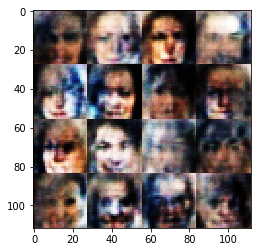

Epoch 1/1... Discriminator Loss: 1.2276... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.7428
Epoch 1/1... Discriminator Loss: 0.9101... Generator Loss: 0.9703
Epoch 1/1... Discriminator Loss: 1.5980... Generator Loss: 0.6688
Epoch 1/1... Discriminator Loss: 0.5838... Generator Loss: 1.2054
Epoch 1/1... Discriminator Loss: 1.2272... Generator Loss: 0.6942
Epoch 1/1... Discriminator Loss: 1.1739... Generator Loss: 0.8943
Epoch 1/1... Discriminator Loss: 0.8002... Generator Loss: 1.0237
Epoch 1/1... Discriminator Loss: 1.0059... Generator Loss: 1.0030
Epoch 1/1... Discriminator Loss: 0.8057... Generator Loss: 0.9526


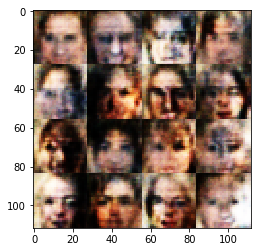

Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 0.8203
Epoch 1/1... Discriminator Loss: 1.6676... Generator Loss: 0.5501
Epoch 1/1... Discriminator Loss: 1.1995... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.3138... Generator Loss: 0.5496
Epoch 1/1... Discriminator Loss: 0.8070... Generator Loss: 1.0372
Epoch 1/1... Discriminator Loss: 0.8544... Generator Loss: 0.9081
Epoch 1/1... Discriminator Loss: 1.1624... Generator Loss: 0.9802
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.5582
Epoch 1/1... Discriminator Loss: 1.0312... Generator Loss: 0.6308
Epoch 1/1... Discriminator Loss: 1.1653... Generator Loss: 0.7262


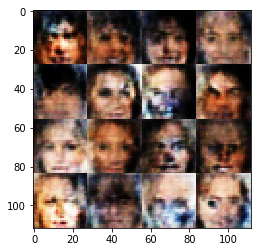

Epoch 1/1... Discriminator Loss: 0.8561... Generator Loss: 1.1810
Epoch 1/1... Discriminator Loss: 0.9423... Generator Loss: 1.0350
Epoch 1/1... Discriminator Loss: 1.5958... Generator Loss: 0.5994
Epoch 1/1... Discriminator Loss: 1.0014... Generator Loss: 0.6251
Epoch 1/1... Discriminator Loss: 1.2055... Generator Loss: 0.5398
Epoch 1/1... Discriminator Loss: 0.9861... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 0.9247
Epoch 1/1... Discriminator Loss: 1.1466... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 0.8958... Generator Loss: 0.8174
Epoch 1/1... Discriminator Loss: 1.1267... Generator Loss: 0.9743


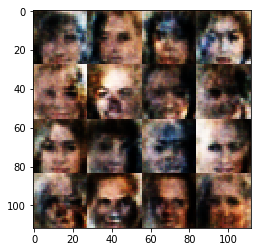

Epoch 1/1... Discriminator Loss: 1.3085... Generator Loss: 0.4770
Epoch 1/1... Discriminator Loss: 1.0505... Generator Loss: 0.7021
Epoch 1/1... Discriminator Loss: 1.5824... Generator Loss: 0.5405
Epoch 1/1... Discriminator Loss: 0.9056... Generator Loss: 0.9548
Epoch 1/1... Discriminator Loss: 1.0415... Generator Loss: 0.7970
Epoch 1/1... Discriminator Loss: 0.7206... Generator Loss: 1.2324
Epoch 1/1... Discriminator Loss: 0.7720... Generator Loss: 1.1192
Epoch 1/1... Discriminator Loss: 1.2786... Generator Loss: 0.8867
Epoch 1/1... Discriminator Loss: 1.2175... Generator Loss: 0.7077
Epoch 1/1... Discriminator Loss: 1.2168... Generator Loss: 0.6760


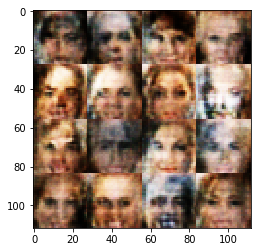

Epoch 1/1... Discriminator Loss: 1.5735... Generator Loss: 0.5748
Epoch 1/1... Discriminator Loss: 1.1541... Generator Loss: 0.6265
Epoch 1/1... Discriminator Loss: 1.3751... Generator Loss: 0.5411
Epoch 1/1... Discriminator Loss: 0.9528... Generator Loss: 0.9633
Epoch 1/1... Discriminator Loss: 1.7224... Generator Loss: 0.4112
Epoch 1/1... Discriminator Loss: 0.9731... Generator Loss: 0.8454
Epoch 1/1... Discriminator Loss: 1.2424... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 0.9979... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.1227... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.0833... Generator Loss: 0.9119


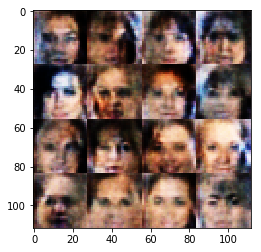

Epoch 1/1... Discriminator Loss: 1.2023... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.0820... Generator Loss: 0.7159
Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.5394
Epoch 1/1... Discriminator Loss: 0.9946... Generator Loss: 0.8226
Epoch 1/1... Discriminator Loss: 1.6357... Generator Loss: 0.4679
Epoch 1/1... Discriminator Loss: 1.0425... Generator Loss: 0.8234
Epoch 1/1... Discriminator Loss: 1.0860... Generator Loss: 0.6903
Epoch 1/1... Discriminator Loss: 1.1010... Generator Loss: 0.7286
Epoch 1/1... Discriminator Loss: 1.6470... Generator Loss: 0.5372
Epoch 1/1... Discriminator Loss: 1.1986... Generator Loss: 0.6897


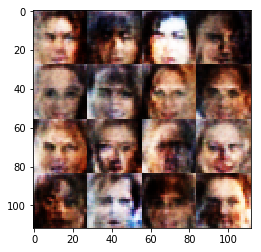

Epoch 1/1... Discriminator Loss: 1.5116... Generator Loss: 0.3721
Epoch 1/1... Discriminator Loss: 1.7221... Generator Loss: 0.6463
Epoch 1/1... Discriminator Loss: 1.1100... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.3509... Generator Loss: 0.6285
Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.8029
Epoch 1/1... Discriminator Loss: 0.9558... Generator Loss: 0.7396
Epoch 1/1... Discriminator Loss: 1.5045... Generator Loss: 0.5982
Epoch 1/1... Discriminator Loss: 1.4433... Generator Loss: 0.5599
Epoch 1/1... Discriminator Loss: 1.3307... Generator Loss: 0.5719
Epoch 1/1... Discriminator Loss: 1.0075... Generator Loss: 0.8188


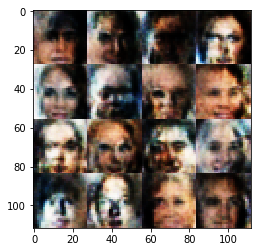

Epoch 1/1... Discriminator Loss: 1.4861... Generator Loss: 0.7349
Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 0.7348
Epoch 1/1... Discriminator Loss: 1.2671... Generator Loss: 0.8021
Epoch 1/1... Discriminator Loss: 1.4657... Generator Loss: 0.4785
Epoch 1/1... Discriminator Loss: 0.9180... Generator Loss: 0.6936
Epoch 1/1... Discriminator Loss: 1.7227... Generator Loss: 0.3764
Epoch 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.4649
Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.6608
Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 0.9626
Epoch 1/1... Discriminator Loss: 1.7354... Generator Loss: 0.3895


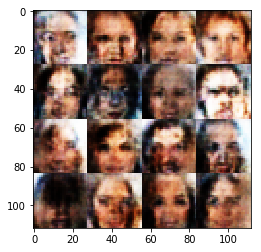

Epoch 1/1... Discriminator Loss: 1.1235... Generator Loss: 0.6049
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 0.5277
Epoch 1/1... Discriminator Loss: 0.9079... Generator Loss: 1.1387
Epoch 1/1... Discriminator Loss: 0.9553... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 1.0626... Generator Loss: 0.5668
Epoch 1/1... Discriminator Loss: 1.4922... Generator Loss: 0.3970
Epoch 1/1... Discriminator Loss: 1.4055... Generator Loss: 0.4083
Epoch 1/1... Discriminator Loss: 1.6013... Generator Loss: 0.4754
Epoch 1/1... Discriminator Loss: 1.1074... Generator Loss: 0.7729
Epoch 1/1... Discriminator Loss: 1.2259... Generator Loss: 0.6143


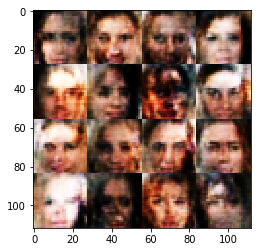

Epoch 1/1... Discriminator Loss: 1.6512... Generator Loss: 0.4453
Epoch 1/1... Discriminator Loss: 1.5149... Generator Loss: 0.3232
Epoch 1/1... Discriminator Loss: 1.3699... Generator Loss: 0.6115
Epoch 1/1... Discriminator Loss: 1.2567... Generator Loss: 0.5998
Epoch 1/1... Discriminator Loss: 1.3578... Generator Loss: 0.4667
Epoch 1/1... Discriminator Loss: 1.1020... Generator Loss: 0.9948
Epoch 1/1... Discriminator Loss: 0.9987... Generator Loss: 0.6441
Epoch 1/1... Discriminator Loss: 1.4595... Generator Loss: 0.6272
Epoch 1/1... Discriminator Loss: 1.4574... Generator Loss: 0.6237
Epoch 1/1... Discriminator Loss: 1.1290... Generator Loss: 0.7930


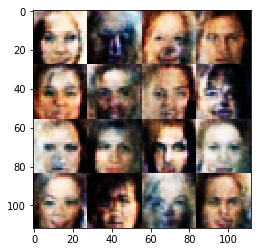

Epoch 1/1... Discriminator Loss: 1.4260... Generator Loss: 0.6430
Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.5691
Epoch 1/1... Discriminator Loss: 1.5231... Generator Loss: 0.4314
Epoch 1/1... Discriminator Loss: 1.8114... Generator Loss: 0.4013
Epoch 1/1... Discriminator Loss: 1.4647... Generator Loss: 0.5177
Epoch 1/1... Discriminator Loss: 1.0721... Generator Loss: 0.7984
Epoch 1/1... Discriminator Loss: 0.9298... Generator Loss: 0.8163
Epoch 1/1... Discriminator Loss: 1.0002... Generator Loss: 1.0290
Epoch 1/1... Discriminator Loss: 1.2925... Generator Loss: 0.6997
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.6240


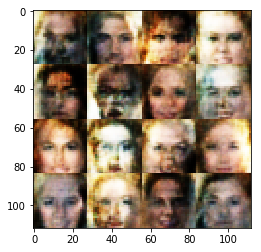

Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.5966
Epoch 1/1... Discriminator Loss: 0.9899... Generator Loss: 0.7357
Epoch 1/1... Discriminator Loss: 1.9039... Generator Loss: 0.4168
Epoch 1/1... Discriminator Loss: 1.5922... Generator Loss: 0.6195
Epoch 1/1... Discriminator Loss: 1.2690... Generator Loss: 0.6227
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 1.1461... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.3947... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.0256... Generator Loss: 1.2883
Epoch 1/1... Discriminator Loss: 1.4118... Generator Loss: 0.4738


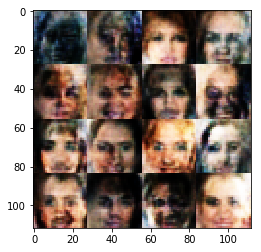

Epoch 1/1... Discriminator Loss: 0.8029... Generator Loss: 0.8493
Epoch 1/1... Discriminator Loss: 0.7767... Generator Loss: 0.9730
Epoch 1/1... Discriminator Loss: 1.4432... Generator Loss: 0.5272
Epoch 1/1... Discriminator Loss: 1.2472... Generator Loss: 0.4633
Epoch 1/1... Discriminator Loss: 1.1406... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 0.9020... Generator Loss: 1.3418
Epoch 1/1... Discriminator Loss: 1.0609... Generator Loss: 0.5938
Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.4098
Epoch 1/1... Discriminator Loss: 1.2136... Generator Loss: 0.9448
Epoch 1/1... Discriminator Loss: 1.6570... Generator Loss: 0.5246


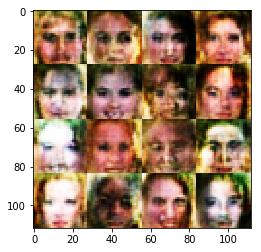

Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 0.7544
Epoch 1/1... Discriminator Loss: 1.2785... Generator Loss: 0.8648
Epoch 1/1... Discriminator Loss: 1.7397... Generator Loss: 0.4124
Epoch 1/1... Discriminator Loss: 1.4414... Generator Loss: 0.5819
Epoch 1/1... Discriminator Loss: 1.0248... Generator Loss: 0.7414
Epoch 1/1... Discriminator Loss: 0.7774... Generator Loss: 1.0814
Epoch 1/1... Discriminator Loss: 1.8042... Generator Loss: 0.5822
Epoch 1/1... Discriminator Loss: 1.3183... Generator Loss: 0.4908
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.6266
Epoch 1/1... Discriminator Loss: 0.6338... Generator Loss: 0.8494


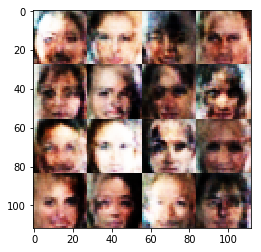

Epoch 1/1... Discriminator Loss: 1.3312... Generator Loss: 0.7877
Epoch 1/1... Discriminator Loss: 1.5174... Generator Loss: 0.4037
Epoch 1/1... Discriminator Loss: 1.2057... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 0.4952
Epoch 1/1... Discriminator Loss: 0.8449... Generator Loss: 0.6679
Epoch 1/1... Discriminator Loss: 1.8769... Generator Loss: 0.4999
Epoch 1/1... Discriminator Loss: 1.1374... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 1.5744... Generator Loss: 0.5218
Epoch 1/1... Discriminator Loss: 1.1595... Generator Loss: 0.8231
Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 0.6509


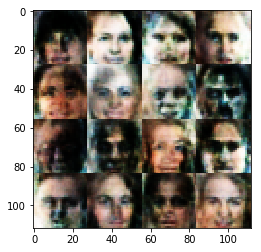

Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.5483
Epoch 1/1... Discriminator Loss: 0.8995... Generator Loss: 0.8863
Epoch 1/1... Discriminator Loss: 1.6150... Generator Loss: 0.4881
Epoch 1/1... Discriminator Loss: 1.0046... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.7344... Generator Loss: 0.5975
Epoch 1/1... Discriminator Loss: 1.4705... Generator Loss: 0.4976
Epoch 1/1... Discriminator Loss: 1.0021... Generator Loss: 1.0067
Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.6554
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.6154
Epoch 1/1... Discriminator Loss: 1.1401... Generator Loss: 0.6303


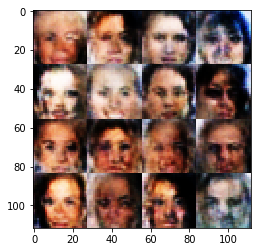

Epoch 1/1... Discriminator Loss: 1.4161... Generator Loss: 0.5798
Epoch 1/1... Discriminator Loss: 1.2504... Generator Loss: 0.5959
Epoch 1/1... Discriminator Loss: 0.8309... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.2125... Generator Loss: 0.6415
Epoch 1/1... Discriminator Loss: 2.0037... Generator Loss: 0.5639
Epoch 1/1... Discriminator Loss: 1.1626... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.4698... Generator Loss: 0.7935
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.1036... Generator Loss: 0.5805
Epoch 1/1... Discriminator Loss: 1.2372... Generator Loss: 0.7116


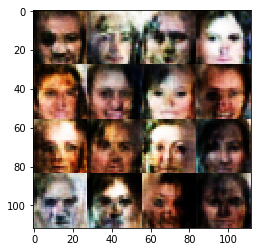

Epoch 1/1... Discriminator Loss: 1.3184... Generator Loss: 0.5858
Epoch 1/1... Discriminator Loss: 1.5387... Generator Loss: 0.5244
Epoch 1/1... Discriminator Loss: 1.5446... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.5201... Generator Loss: 0.3751
Epoch 1/1... Discriminator Loss: 1.1866... Generator Loss: 0.7510
Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 0.9420
Epoch 1/1... Discriminator Loss: 1.8766... Generator Loss: 0.4878
Epoch 1/1... Discriminator Loss: 1.2640... Generator Loss: 0.6250
Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.5877
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 0.4767


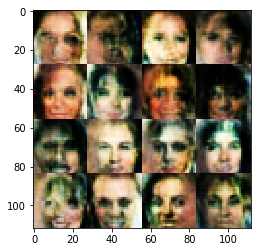

Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.4482
Epoch 1/1... Discriminator Loss: 1.4929... Generator Loss: 0.7594
Epoch 1/1... Discriminator Loss: 1.4561... Generator Loss: 0.4412
Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.4810
Epoch 1/1... Discriminator Loss: 1.5997... Generator Loss: 0.4553
Epoch 1/1... Discriminator Loss: 1.7716... Generator Loss: 0.4588
Epoch 1/1... Discriminator Loss: 1.2364... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.5932
Epoch 1/1... Discriminator Loss: 1.7978... Generator Loss: 0.3900
Epoch 1/1... Discriminator Loss: 1.0078... Generator Loss: 0.7959


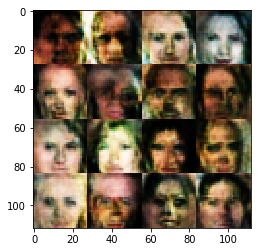

Epoch 1/1... Discriminator Loss: 1.7057... Generator Loss: 0.3926
Epoch 1/1... Discriminator Loss: 0.7459... Generator Loss: 1.1109
Epoch 1/1... Discriminator Loss: 0.6353... Generator Loss: 1.0621
Epoch 1/1... Discriminator Loss: 1.4462... Generator Loss: 0.7417
Epoch 1/1... Discriminator Loss: 1.8297... Generator Loss: 0.4106
Epoch 1/1... Discriminator Loss: 1.0039... Generator Loss: 0.7637
Epoch 1/1... Discriminator Loss: 1.2116... Generator Loss: 0.6301
Epoch 1/1... Discriminator Loss: 1.8084... Generator Loss: 0.3310
Epoch 1/1... Discriminator Loss: 1.2749... Generator Loss: 0.7364
Epoch 1/1... Discriminator Loss: 1.6679... Generator Loss: 0.4315


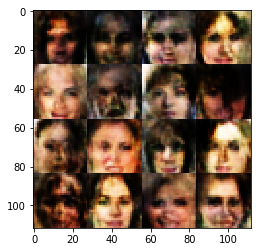

Epoch 1/1... Discriminator Loss: 1.6462... Generator Loss: 0.6105
Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.6278
Epoch 1/1... Discriminator Loss: 2.5673... Generator Loss: 0.1992
Epoch 1/1... Discriminator Loss: 1.1175... Generator Loss: 0.6459
Epoch 1/1... Discriminator Loss: 1.3158... Generator Loss: 0.5956
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.4781
Epoch 1/1... Discriminator Loss: 1.0577... Generator Loss: 0.7185
Epoch 1/1... Discriminator Loss: 1.7123... Generator Loss: 0.4374
Epoch 1/1... Discriminator Loss: 1.5768... Generator Loss: 0.6012
Epoch 1/1... Discriminator Loss: 0.8116... Generator Loss: 0.8361


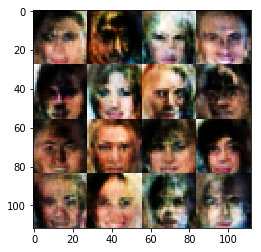

Epoch 1/1... Discriminator Loss: 1.5208... Generator Loss: 0.5675
Epoch 1/1... Discriminator Loss: 1.3024... Generator Loss: 0.5291
Epoch 1/1... Discriminator Loss: 0.9919... Generator Loss: 0.6596
Epoch 1/1... Discriminator Loss: 1.0320... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.6220... Generator Loss: 0.3925
Epoch 1/1... Discriminator Loss: 1.2928... Generator Loss: 0.5781
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.4222
Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 0.5819
Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.5237
Epoch 1/1... Discriminator Loss: 1.5301... Generator Loss: 0.3844


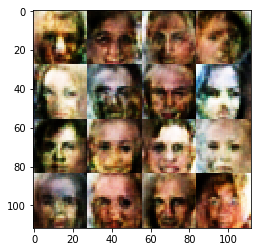

Epoch 1/1... Discriminator Loss: 1.0413... Generator Loss: 0.9452
Epoch 1/1... Discriminator Loss: 1.7465... Generator Loss: 0.2560
Epoch 1/1... Discriminator Loss: 0.9884... Generator Loss: 0.5598
Epoch 1/1... Discriminator Loss: 1.8148... Generator Loss: 0.4516
Epoch 1/1... Discriminator Loss: 1.4046... Generator Loss: 0.6735
Epoch 1/1... Discriminator Loss: 1.5444... Generator Loss: 0.4134
Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.6474
Epoch 1/1... Discriminator Loss: 0.9899... Generator Loss: 1.0254
Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.5379
Epoch 1/1... Discriminator Loss: 1.1216... Generator Loss: 0.7364


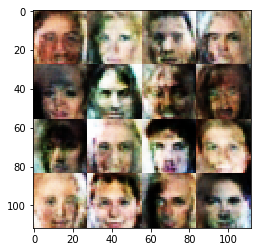

Epoch 1/1... Discriminator Loss: 1.1381... Generator Loss: 0.5925
Epoch 1/1... Discriminator Loss: 2.1020... Generator Loss: 0.3687
Epoch 1/1... Discriminator Loss: 1.2396... Generator Loss: 0.4327
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.5471
Epoch 1/1... Discriminator Loss: 1.9627... Generator Loss: 0.4227
Epoch 1/1... Discriminator Loss: 0.8400... Generator Loss: 1.1192
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 0.7466
Epoch 1/1... Discriminator Loss: 1.4409... Generator Loss: 0.6495
Epoch 1/1... Discriminator Loss: 1.9150... Generator Loss: 0.3609
Epoch 1/1... Discriminator Loss: 1.6635... Generator Loss: 0.5507


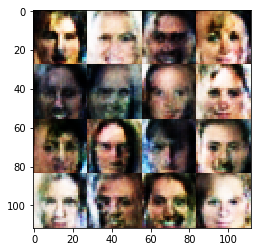

Epoch 1/1... Discriminator Loss: 1.2324... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 0.8541... Generator Loss: 1.0655
Epoch 1/1... Discriminator Loss: 1.8974... Generator Loss: 0.3590
Epoch 1/1... Discriminator Loss: 1.5499... Generator Loss: 0.5113
Epoch 1/1... Discriminator Loss: 0.9037... Generator Loss: 0.9081
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.5917
Epoch 1/1... Discriminator Loss: 1.4010... Generator Loss: 0.4084
Epoch 1/1... Discriminator Loss: 0.9215... Generator Loss: 0.8200
Epoch 1/1... Discriminator Loss: 1.5605... Generator Loss: 0.3673
Epoch 1/1... Discriminator Loss: 1.2087... Generator Loss: 0.6792


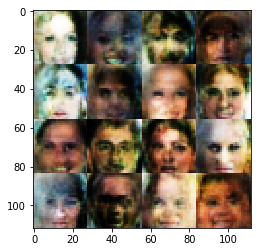

Epoch 1/1... Discriminator Loss: 1.3394... Generator Loss: 0.5804
Epoch 1/1... Discriminator Loss: 1.2132... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.3504... Generator Loss: 0.5000
Epoch 1/1... Discriminator Loss: 1.5846... Generator Loss: 0.4687
Epoch 1/1... Discriminator Loss: 1.6503... Generator Loss: 0.3071
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 0.9210
Epoch 1/1... Discriminator Loss: 1.3515... Generator Loss: 0.4449
Epoch 1/1... Discriminator Loss: 1.0564... Generator Loss: 0.7319
Epoch 1/1... Discriminator Loss: 1.5972... Generator Loss: 0.3382
Epoch 1/1... Discriminator Loss: 1.2359... Generator Loss: 0.7298


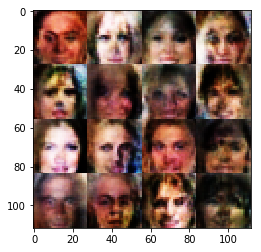

Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.5151
Epoch 1/1... Discriminator Loss: 1.2958... Generator Loss: 0.4315
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.6199
Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.5126
Epoch 1/1... Discriminator Loss: 1.4775... Generator Loss: 0.5156
Epoch 1/1... Discriminator Loss: 1.1491... Generator Loss: 0.8342
Epoch 1/1... Discriminator Loss: 1.6165... Generator Loss: 0.5459
Epoch 1/1... Discriminator Loss: 1.9979... Generator Loss: 0.6419
Epoch 1/1... Discriminator Loss: 1.5073... Generator Loss: 0.4528
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.4596


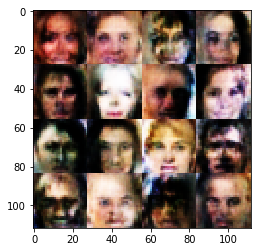

Epoch 1/1... Discriminator Loss: 0.8533... Generator Loss: 0.6944
Epoch 1/1... Discriminator Loss: 1.8464... Generator Loss: 0.6064
Epoch 1/1... Discriminator Loss: 1.6427... Generator Loss: 0.4494
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.6457
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 0.6084
Epoch 1/1... Discriminator Loss: 0.8900... Generator Loss: 0.7930
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.7587
Epoch 1/1... Discriminator Loss: 0.6880... Generator Loss: 1.2501
Epoch 1/1... Discriminator Loss: 1.0111... Generator Loss: 0.6110
Epoch 1/1... Discriminator Loss: 1.2235... Generator Loss: 0.6240


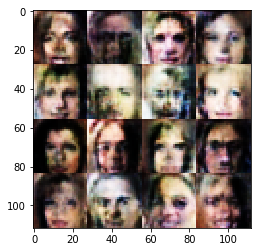

Epoch 1/1... Discriminator Loss: 1.9220... Generator Loss: 0.2747
Epoch 1/1... Discriminator Loss: 1.1472... Generator Loss: 0.5938
Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.4940
Epoch 1/1... Discriminator Loss: 1.5005... Generator Loss: 0.4567
Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 0.5490
Epoch 1/1... Discriminator Loss: 2.2186... Generator Loss: 0.1922
Epoch 1/1... Discriminator Loss: 1.2146... Generator Loss: 0.6825
Epoch 1/1... Discriminator Loss: 1.5990... Generator Loss: 0.5638
Epoch 1/1... Discriminator Loss: 1.1261... Generator Loss: 0.6646
Epoch 1/1... Discriminator Loss: 0.8945... Generator Loss: 0.8722


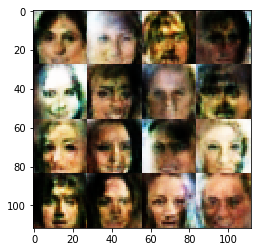

Epoch 1/1... Discriminator Loss: 1.8533... Generator Loss: 0.3353
Epoch 1/1... Discriminator Loss: 1.8188... Generator Loss: 0.4006
Epoch 1/1... Discriminator Loss: 1.4435... Generator Loss: 0.4768
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.4180
Epoch 1/1... Discriminator Loss: 1.7946... Generator Loss: 0.3654
Epoch 1/1... Discriminator Loss: 1.2500... Generator Loss: 0.5943
Epoch 1/1... Discriminator Loss: 1.6834... Generator Loss: 0.3280
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.9938
Epoch 1/1... Discriminator Loss: 1.3255... Generator Loss: 0.7182
Epoch 1/1... Discriminator Loss: 1.1759... Generator Loss: 0.5699


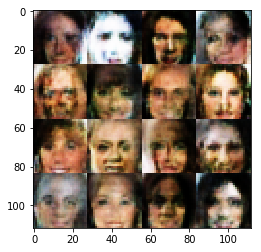

Epoch 1/1... Discriminator Loss: 0.9008... Generator Loss: 0.9488
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.3989
Epoch 1/1... Discriminator Loss: 0.5243... Generator Loss: 1.3856
Epoch 1/1... Discriminator Loss: 1.4177... Generator Loss: 0.5049
Epoch 1/1... Discriminator Loss: 1.6771... Generator Loss: 0.5606
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.7710
Epoch 1/1... Discriminator Loss: 1.2351... Generator Loss: 0.5229
Epoch 1/1... Discriminator Loss: 1.4988... Generator Loss: 0.5429
Epoch 1/1... Discriminator Loss: 0.8021... Generator Loss: 0.9515
Epoch 1/1... Discriminator Loss: 1.2219... Generator Loss: 0.5602


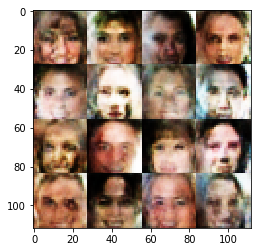

Epoch 1/1... Discriminator Loss: 1.7814... Generator Loss: 0.4083
Epoch 1/1... Discriminator Loss: 1.1365... Generator Loss: 0.6129
Epoch 1/1... Discriminator Loss: 1.4089... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 1.5799... Generator Loss: 0.4570
Epoch 1/1... Discriminator Loss: 1.7516... Generator Loss: 0.3236
Epoch 1/1... Discriminator Loss: 1.0573... Generator Loss: 0.6204
Epoch 1/1... Discriminator Loss: 2.1581... Generator Loss: 0.2835
Epoch 1/1... Discriminator Loss: 1.5372... Generator Loss: 0.4308
Epoch 1/1... Discriminator Loss: 1.3223... Generator Loss: 0.6033
Epoch 1/1... Discriminator Loss: 1.4905... Generator Loss: 0.5572


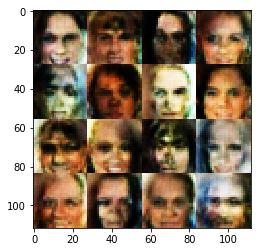

Epoch 1/1... Discriminator Loss: 0.8905... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.4484... Generator Loss: 0.3977
Epoch 1/1... Discriminator Loss: 1.6990... Generator Loss: 0.4239
Epoch 1/1... Discriminator Loss: 1.5809... Generator Loss: 0.5927
Epoch 1/1... Discriminator Loss: 0.9755... Generator Loss: 0.9377
Epoch 1/1... Discriminator Loss: 1.4379... Generator Loss: 0.5024
Epoch 1/1... Discriminator Loss: 1.2284... Generator Loss: 0.5169
Epoch 1/1... Discriminator Loss: 1.8444... Generator Loss: 0.3842
Epoch 1/1... Discriminator Loss: 1.6282... Generator Loss: 0.3049
Epoch 1/1... Discriminator Loss: 1.4995... Generator Loss: 0.3858


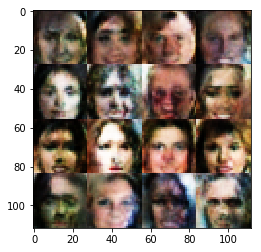

Epoch 1/1... Discriminator Loss: 1.4997... Generator Loss: 0.4801
Epoch 1/1... Discriminator Loss: 1.5741... Generator Loss: 0.4580
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.7956
Epoch 1/1... Discriminator Loss: 1.2339... Generator Loss: 0.4754
Epoch 1/1... Discriminator Loss: 1.7886... Generator Loss: 0.4578
Epoch 1/1... Discriminator Loss: 1.0485... Generator Loss: 0.7734
Epoch 1/1... Discriminator Loss: 1.7190... Generator Loss: 0.4370
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.1818... Generator Loss: 0.6354
Epoch 1/1... Discriminator Loss: 1.8313... Generator Loss: 0.4265


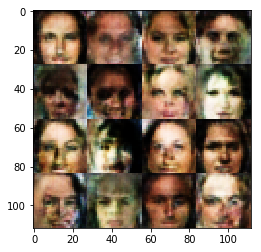

Epoch 1/1... Discriminator Loss: 2.0540... Generator Loss: 0.3966
Epoch 1/1... Discriminator Loss: 1.1924... Generator Loss: 0.5435
Epoch 1/1... Discriminator Loss: 1.2461... Generator Loss: 0.7822
Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.4726
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.4855
Epoch 1/1... Discriminator Loss: 1.3157... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.1449... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 0.9461... Generator Loss: 0.8864
Epoch 1/1... Discriminator Loss: 0.9260... Generator Loss: 0.6198
Epoch 1/1... Discriminator Loss: 0.7994... Generator Loss: 0.9311


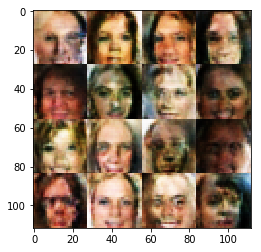

Epoch 1/1... Discriminator Loss: 1.1933... Generator Loss: 0.6127
Epoch 1/1... Discriminator Loss: 1.5505... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.4782... Generator Loss: 0.5833
Epoch 1/1... Discriminator Loss: 1.2753... Generator Loss: 0.5408
Epoch 1/1... Discriminator Loss: 0.9267... Generator Loss: 0.8724
Epoch 1/1... Discriminator Loss: 1.1566... Generator Loss: 0.9315
Epoch 1/1... Discriminator Loss: 1.7964... Generator Loss: 0.3647
Epoch 1/1... Discriminator Loss: 1.1653... Generator Loss: 0.6471
Epoch 1/1... Discriminator Loss: 1.4907... Generator Loss: 0.5965
Epoch 1/1... Discriminator Loss: 2.2389... Generator Loss: 0.2864


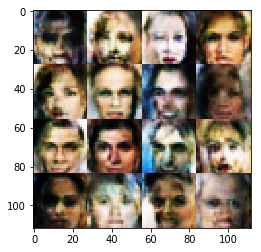

Epoch 1/1... Discriminator Loss: 1.4287... Generator Loss: 0.7245
Epoch 1/1... Discriminator Loss: 1.2778... Generator Loss: 0.6470
Epoch 1/1... Discriminator Loss: 0.8425... Generator Loss: 0.8783
Epoch 1/1... Discriminator Loss: 1.2774... Generator Loss: 0.6283
Epoch 1/1... Discriminator Loss: 1.5167... Generator Loss: 0.6240
Epoch 1/1... Discriminator Loss: 1.4789... Generator Loss: 0.4872
Epoch 1/1... Discriminator Loss: 1.4769... Generator Loss: 0.5018
Epoch 1/1... Discriminator Loss: 1.4850... Generator Loss: 0.6237
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.5364
Epoch 1/1... Discriminator Loss: 2.0314... Generator Loss: 0.3283


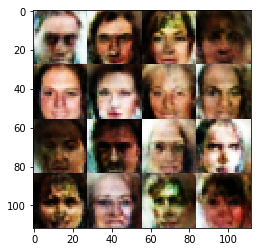

Epoch 1/1... Discriminator Loss: 1.1610... Generator Loss: 0.5743
Epoch 1/1... Discriminator Loss: 0.9875... Generator Loss: 0.6791
Epoch 1/1... Discriminator Loss: 1.4692... Generator Loss: 0.3979
Epoch 1/1... Discriminator Loss: 1.3450... Generator Loss: 0.4960
Epoch 1/1... Discriminator Loss: 1.1171... Generator Loss: 0.8161
Epoch 1/1... Discriminator Loss: 1.5754... Generator Loss: 0.4996
Epoch 1/1... Discriminator Loss: 1.1015... Generator Loss: 0.7171
Epoch 1/1... Discriminator Loss: 1.7148... Generator Loss: 0.4274
Epoch 1/1... Discriminator Loss: 1.5390... Generator Loss: 0.4930
Epoch 1/1... Discriminator Loss: 1.1710... Generator Loss: 0.8305


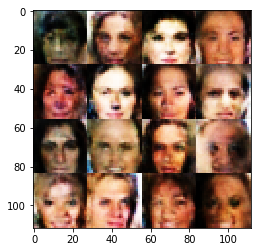

Epoch 1/1... Discriminator Loss: 1.3372... Generator Loss: 0.7199
Epoch 1/1... Discriminator Loss: 1.2457... Generator Loss: 0.6387
Epoch 1/1... Discriminator Loss: 1.2419... Generator Loss: 0.5998
Epoch 1/1... Discriminator Loss: 1.5690... Generator Loss: 0.4169
Epoch 1/1... Discriminator Loss: 1.4608... Generator Loss: 0.5246
Epoch 1/1... Discriminator Loss: 1.1385... Generator Loss: 0.6782
Epoch 1/1... Discriminator Loss: 1.0042... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.5349... Generator Loss: 0.4306
Epoch 1/1... Discriminator Loss: 1.6886... Generator Loss: 0.4162
Epoch 1/1... Discriminator Loss: 1.5214... Generator Loss: 0.4294


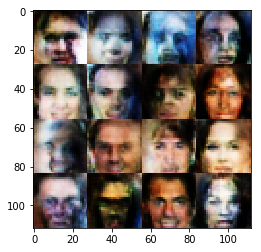

Epoch 1/1... Discriminator Loss: 1.5796... Generator Loss: 0.5438
Epoch 1/1... Discriminator Loss: 1.1263... Generator Loss: 0.5335
Epoch 1/1... Discriminator Loss: 1.6537... Generator Loss: 0.5993
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.5564... Generator Loss: 0.7049
Epoch 1/1... Discriminator Loss: 1.8941... Generator Loss: 0.5392
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 1.7779... Generator Loss: 0.5518
Epoch 1/1... Discriminator Loss: 1.7562... Generator Loss: 0.6009
Epoch 1/1... Discriminator Loss: 1.5744... Generator Loss: 0.3910


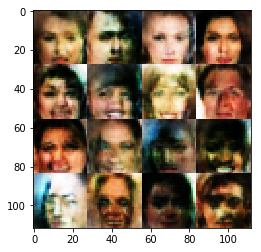

Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 1.1642... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.4844
Epoch 1/1... Discriminator Loss: 1.3515... Generator Loss: 0.6357
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.1371... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 1.4741... Generator Loss: 0.5017
Epoch 1/1... Discriminator Loss: 1.1259... Generator Loss: 0.6293
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.5976
Epoch 1/1... Discriminator Loss: 1.8418... Generator Loss: 0.3355


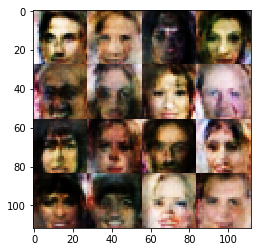

Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.5019
Epoch 1/1... Discriminator Loss: 1.2948... Generator Loss: 0.4364
Epoch 1/1... Discriminator Loss: 1.4654... Generator Loss: 0.5095
Epoch 1/1... Discriminator Loss: 1.3708... Generator Loss: 0.5886
Epoch 1/1... Discriminator Loss: 1.3061... Generator Loss: 0.6494
Epoch 1/1... Discriminator Loss: 1.6177... Generator Loss: 0.4065
Epoch 1/1... Discriminator Loss: 1.5687... Generator Loss: 0.5081
Epoch 1/1... Discriminator Loss: 0.6388... Generator Loss: 0.8340
Epoch 1/1... Discriminator Loss: 1.7682... Generator Loss: 0.4057
Epoch 1/1... Discriminator Loss: 0.8000... Generator Loss: 1.0077


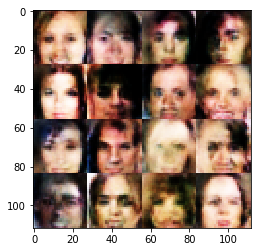

Epoch 1/1... Discriminator Loss: 1.3030... Generator Loss: 0.8230
Epoch 1/1... Discriminator Loss: 1.4100... Generator Loss: 0.4624
Epoch 1/1... Discriminator Loss: 1.2186... Generator Loss: 0.6114
Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.4247
Epoch 1/1... Discriminator Loss: 1.3805... Generator Loss: 0.5475
Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.6156
Epoch 1/1... Discriminator Loss: 1.5049... Generator Loss: 0.5597
Epoch 1/1... Discriminator Loss: 1.9663... Generator Loss: 0.4421
Epoch 1/1... Discriminator Loss: 1.4601... Generator Loss: 0.5080
Epoch 1/1... Discriminator Loss: 1.2818... Generator Loss: 0.5316


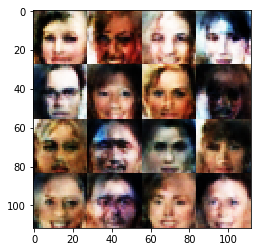

Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.5717
Epoch 1/1... Discriminator Loss: 0.9510... Generator Loss: 0.9540
Epoch 1/1... Discriminator Loss: 1.3578... Generator Loss: 0.5375
Epoch 1/1... Discriminator Loss: 1.2268... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 1.0252... Generator Loss: 0.6292
Epoch 1/1... Discriminator Loss: 0.9326... Generator Loss: 0.7102
Epoch 1/1... Discriminator Loss: 1.7424... Generator Loss: 0.4084
Epoch 1/1... Discriminator Loss: 1.4662... Generator Loss: 0.8740
Epoch 1/1... Discriminator Loss: 1.2224... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.2709... Generator Loss: 0.6359


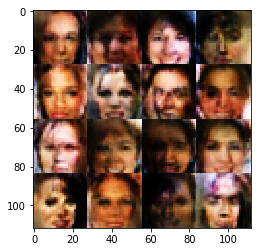

Epoch 1/1... Discriminator Loss: 1.6250... Generator Loss: 0.4637
Epoch 1/1... Discriminator Loss: 1.3801... Generator Loss: 0.5107
Epoch 1/1... Discriminator Loss: 1.7179... Generator Loss: 0.4885
Epoch 1/1... Discriminator Loss: 1.1825... Generator Loss: 0.6512
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.6220
Epoch 1/1... Discriminator Loss: 1.3285... Generator Loss: 0.5109
Epoch 1/1... Discriminator Loss: 1.4330... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.4954... Generator Loss: 0.4746
Epoch 1/1... Discriminator Loss: 1.1954... Generator Loss: 0.5837
Epoch 1/1... Discriminator Loss: 1.3726... Generator Loss: 0.6947


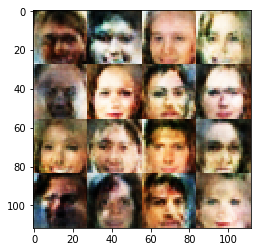

Epoch 1/1... Discriminator Loss: 1.4682... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.8871... Generator Loss: 0.3777
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.4176
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.4982
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.6222
Epoch 1/1... Discriminator Loss: 1.6506... Generator Loss: 0.3912
Epoch 1/1... Discriminator Loss: 1.4907... Generator Loss: 0.6199
Epoch 1/1... Discriminator Loss: 1.3019... Generator Loss: 0.6552
Epoch 1/1... Discriminator Loss: 0.9557... Generator Loss: 0.9253
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 0.7895


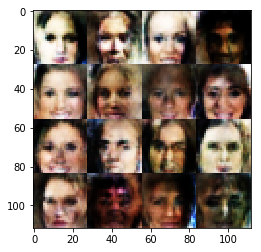

Epoch 1/1... Discriminator Loss: 1.5340... Generator Loss: 0.6171
Epoch 1/1... Discriminator Loss: 1.4788... Generator Loss: 0.5171
Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.5078
Epoch 1/1... Discriminator Loss: 1.1521... Generator Loss: 0.7917
Epoch 1/1... Discriminator Loss: 1.5638... Generator Loss: 0.5838
Epoch 1/1... Discriminator Loss: 1.2950... Generator Loss: 0.4285
Epoch 1/1... Discriminator Loss: 1.1478... Generator Loss: 0.7869
Epoch 1/1... Discriminator Loss: 2.0608... Generator Loss: 0.3624
Epoch 1/1... Discriminator Loss: 1.6344... Generator Loss: 0.5237
Epoch 1/1... Discriminator Loss: 1.0965... Generator Loss: 0.5491


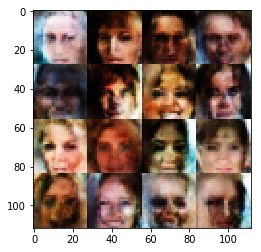

Epoch 1/1... Discriminator Loss: 1.0493... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.1389... Generator Loss: 0.6213
Epoch 1/1... Discriminator Loss: 1.6597... Generator Loss: 0.5962
Epoch 1/1... Discriminator Loss: 0.9483... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.8345... Generator Loss: 0.4572
Epoch 1/1... Discriminator Loss: 1.5800... Generator Loss: 0.4232
Epoch 1/1... Discriminator Loss: 1.8626... Generator Loss: 0.4558
Epoch 1/1... Discriminator Loss: 0.8527... Generator Loss: 1.0453
Epoch 1/1... Discriminator Loss: 1.6569... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 1.4014... Generator Loss: 0.5202


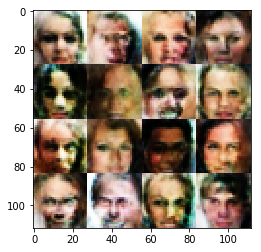

Epoch 1/1... Discriminator Loss: 1.7529... Generator Loss: 0.4360
Epoch 1/1... Discriminator Loss: 1.7011... Generator Loss: 0.4638
Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 0.6216
Epoch 1/1... Discriminator Loss: 1.0401... Generator Loss: 0.7236
Epoch 1/1... Discriminator Loss: 1.2495... Generator Loss: 0.5310
Epoch 1/1... Discriminator Loss: 1.5139... Generator Loss: 0.3813
Epoch 1/1... Discriminator Loss: 1.5897... Generator Loss: 0.3329
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.6060
Epoch 1/1... Discriminator Loss: 1.5290... Generator Loss: 0.5129
Epoch 1/1... Discriminator Loss: 1.5256... Generator Loss: 0.4387


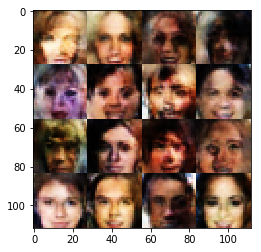

Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 0.6038
Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.6103
Epoch 1/1... Discriminator Loss: 1.3122... Generator Loss: 0.6401
Epoch 1/1... Discriminator Loss: 1.2169... Generator Loss: 0.5630
Epoch 1/1... Discriminator Loss: 1.1037... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.5562... Generator Loss: 0.3905
Epoch 1/1... Discriminator Loss: 0.7152... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.7233... Generator Loss: 0.2893
Epoch 1/1... Discriminator Loss: 0.9909... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.4594


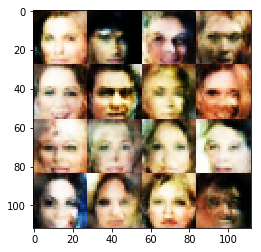

Epoch 1/1... Discriminator Loss: 1.4665... Generator Loss: 0.6955
Epoch 1/1... Discriminator Loss: 1.0371... Generator Loss: 0.7946
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 1.7524... Generator Loss: 0.5130
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.5129
Epoch 1/1... Discriminator Loss: 0.9833... Generator Loss: 0.8663
Epoch 1/1... Discriminator Loss: 1.6200... Generator Loss: 0.4097
Epoch 1/1... Discriminator Loss: 1.2303... Generator Loss: 0.4956
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.5680
Epoch 1/1... Discriminator Loss: 0.8145... Generator Loss: 0.9649


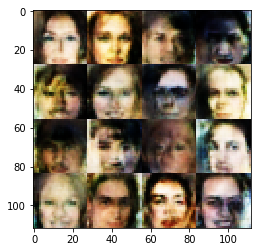

Epoch 1/1... Discriminator Loss: 1.2745... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.6588... Generator Loss: 0.7240
Epoch 1/1... Discriminator Loss: 1.1083... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.2284... Generator Loss: 0.6606
Epoch 1/1... Discriminator Loss: 1.5378... Generator Loss: 0.4879
Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 0.8258
Epoch 1/1... Discriminator Loss: 1.5890... Generator Loss: 0.4931
Epoch 1/1... Discriminator Loss: 1.5582... Generator Loss: 0.5527
Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 0.5849
Epoch 1/1... Discriminator Loss: 1.0430... Generator Loss: 0.6426


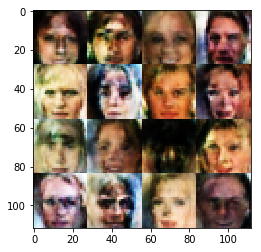

Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.4350
Epoch 1/1... Discriminator Loss: 1.6504... Generator Loss: 0.4642
Epoch 1/1... Discriminator Loss: 2.0894... Generator Loss: 0.4990
Epoch 1/1... Discriminator Loss: 1.1978... Generator Loss: 0.6087
Epoch 1/1... Discriminator Loss: 1.6169... Generator Loss: 0.4902
Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.5170
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.5108
Epoch 1/1... Discriminator Loss: 1.7341... Generator Loss: 0.4367
Epoch 1/1... Discriminator Loss: 1.1958... Generator Loss: 0.8280
Epoch 1/1... Discriminator Loss: 1.5119... Generator Loss: 0.4438


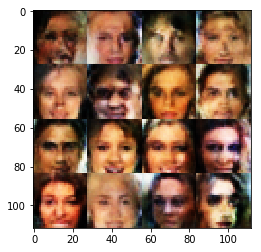

Epoch 1/1... Discriminator Loss: 1.5435... Generator Loss: 0.5500
Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.4909
Epoch 1/1... Discriminator Loss: 1.0448... Generator Loss: 0.6407
Epoch 1/1... Discriminator Loss: 2.0710... Generator Loss: 0.3648
Epoch 1/1... Discriminator Loss: 0.9397... Generator Loss: 0.6089
Epoch 1/1... Discriminator Loss: 1.4724... Generator Loss: 0.4860
Epoch 1/1... Discriminator Loss: 0.9866... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.8343... Generator Loss: 0.4728
Epoch 1/1... Discriminator Loss: 1.0662... Generator Loss: 0.6172
Epoch 1/1... Discriminator Loss: 0.9578... Generator Loss: 0.7328


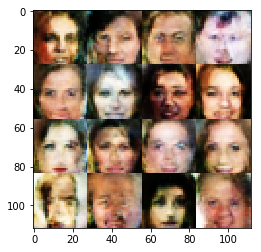

Epoch 1/1... Discriminator Loss: 1.0798... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.7512... Generator Loss: 0.4854
Epoch 1/1... Discriminator Loss: 1.9276... Generator Loss: 0.4808
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 0.6307
Epoch 1/1... Discriminator Loss: 1.7618... Generator Loss: 0.5571
Epoch 1/1... Discriminator Loss: 1.7229... Generator Loss: 0.4779
Epoch 1/1... Discriminator Loss: 1.2958... Generator Loss: 0.6445
Epoch 1/1... Discriminator Loss: 1.3336... Generator Loss: 0.6134
Epoch 1/1... Discriminator Loss: 1.2878... Generator Loss: 0.8139
Epoch 1/1... Discriminator Loss: 1.2180... Generator Loss: 0.5975


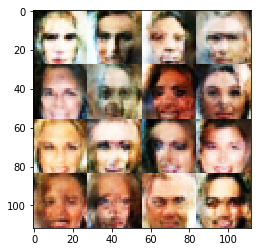

Epoch 1/1... Discriminator Loss: 1.7194... Generator Loss: 0.4552
Epoch 1/1... Discriminator Loss: 0.8453... Generator Loss: 0.8844
Epoch 1/1... Discriminator Loss: 1.5221... Generator Loss: 0.6740
Epoch 1/1... Discriminator Loss: 1.3205... Generator Loss: 0.5831
Epoch 1/1... Discriminator Loss: 1.8400... Generator Loss: 0.4219
Epoch 1/1... Discriminator Loss: 0.8223... Generator Loss: 0.8095
Epoch 1/1... Discriminator Loss: 1.5497... Generator Loss: 0.4200
Epoch 1/1... Discriminator Loss: 1.3119... Generator Loss: 0.5959
Epoch 1/1... Discriminator Loss: 1.6597... Generator Loss: 0.4856
Epoch 1/1... Discriminator Loss: 1.5264... Generator Loss: 0.4701


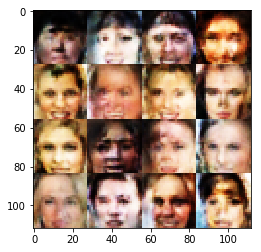

Epoch 1/1... Discriminator Loss: 1.3500... Generator Loss: 0.4777
Epoch 1/1... Discriminator Loss: 0.8953... Generator Loss: 0.6565
Epoch 1/1... Discriminator Loss: 1.2090... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 1.2453... Generator Loss: 0.5699
Epoch 1/1... Discriminator Loss: 1.5979... Generator Loss: 0.5797
Epoch 1/1... Discriminator Loss: 1.9511... Generator Loss: 0.3622
Epoch 1/1... Discriminator Loss: 1.4609... Generator Loss: 0.5727
Epoch 1/1... Discriminator Loss: 1.0821... Generator Loss: 0.7456
Epoch 1/1... Discriminator Loss: 1.4670... Generator Loss: 0.4130
Epoch 1/1... Discriminator Loss: 1.6045... Generator Loss: 0.3677


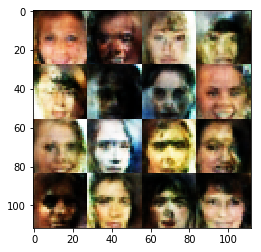

Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.5695
Epoch 1/1... Discriminator Loss: 1.0221... Generator Loss: 0.9029
Epoch 1/1... Discriminator Loss: 1.1384... Generator Loss: 0.6986
Epoch 1/1... Discriminator Loss: 1.4073... Generator Loss: 0.6848
Epoch 1/1... Discriminator Loss: 1.0523... Generator Loss: 1.1321
Epoch 1/1... Discriminator Loss: 1.3325... Generator Loss: 0.5799
Epoch 1/1... Discriminator Loss: 1.7953... Generator Loss: 0.2959
Epoch 1/1... Discriminator Loss: 1.5366... Generator Loss: 0.4076
Epoch 1/1... Discriminator Loss: 1.7193... Generator Loss: 0.3632
Epoch 1/1... Discriminator Loss: 1.5457... Generator Loss: 0.3730


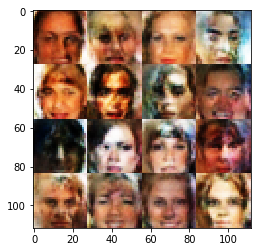

Epoch 1/1... Discriminator Loss: 1.5688... Generator Loss: 0.5006
Epoch 1/1... Discriminator Loss: 1.0464... Generator Loss: 0.5833
Epoch 1/1... Discriminator Loss: 1.2194... Generator Loss: 0.6222
Epoch 1/1... Discriminator Loss: 1.5751... Generator Loss: 0.3855
Epoch 1/1... Discriminator Loss: 1.6940... Generator Loss: 0.4126
Epoch 1/1... Discriminator Loss: 1.5290... Generator Loss: 0.4940
Epoch 1/1... Discriminator Loss: 1.2142... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.7052... Generator Loss: 0.3865
Epoch 1/1... Discriminator Loss: 1.2555... Generator Loss: 0.5566
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 0.6270


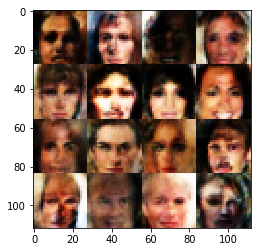

Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 1.2530... Generator Loss: 0.5769
Epoch 1/1... Discriminator Loss: 1.0751... Generator Loss: 0.8617
Epoch 1/1... Discriminator Loss: 1.8610... Generator Loss: 0.4249
Epoch 1/1... Discriminator Loss: 1.5991... Generator Loss: 0.4758
Epoch 1/1... Discriminator Loss: 1.5263... Generator Loss: 0.4422
Epoch 1/1... Discriminator Loss: 1.2538... Generator Loss: 0.5862
Epoch 1/1... Discriminator Loss: 1.0628... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.0893... Generator Loss: 0.5663


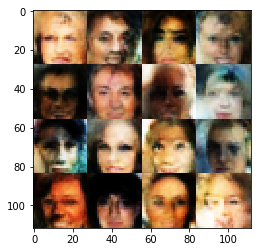

Epoch 1/1... Discriminator Loss: 1.2770... Generator Loss: 0.5513
Epoch 1/1... Discriminator Loss: 1.0885... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.1828... Generator Loss: 0.5329
Epoch 1/1... Discriminator Loss: 1.8477... Generator Loss: 0.5868
Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 0.5910
Epoch 1/1... Discriminator Loss: 1.0090... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 2.2253... Generator Loss: 0.3210
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.5036
Epoch 1/1... Discriminator Loss: 1.8567... Generator Loss: 0.3663
Epoch 1/1... Discriminator Loss: 1.4229... Generator Loss: 0.3983


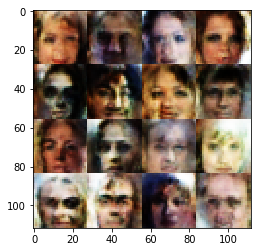

Epoch 1/1... Discriminator Loss: 1.7809... Generator Loss: 0.3797
Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.3302... Generator Loss: 0.7236
Epoch 1/1... Discriminator Loss: 1.4657... Generator Loss: 0.5248
Epoch 1/1... Discriminator Loss: 1.5603... Generator Loss: 0.4204
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.5432
Epoch 1/1... Discriminator Loss: 0.8922... Generator Loss: 0.7471
Epoch 1/1... Discriminator Loss: 1.1683... Generator Loss: 0.8169
Epoch 1/1... Discriminator Loss: 1.6786... Generator Loss: 0.4871
Epoch 1/1... Discriminator Loss: 1.8586... Generator Loss: 0.5506


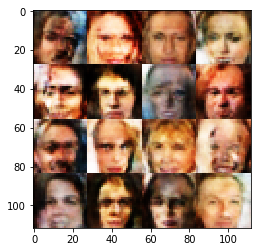

Epoch 1/1... Discriminator Loss: 1.8389... Generator Loss: 0.3978
Epoch 1/1... Discriminator Loss: 1.6764... Generator Loss: 0.5496
Epoch 1/1... Discriminator Loss: 1.9889... Generator Loss: 0.5047
Epoch 1/1... Discriminator Loss: 1.6506... Generator Loss: 0.5060
Epoch 1/1... Discriminator Loss: 1.5714... Generator Loss: 0.4200
Epoch 1/1... Discriminator Loss: 1.5388... Generator Loss: 0.5376
Epoch 1/1... Discriminator Loss: 1.2156... Generator Loss: 0.6694
Epoch 1/1... Discriminator Loss: 1.0153... Generator Loss: 0.8626
Epoch 1/1... Discriminator Loss: 1.9388... Generator Loss: 0.3477
Epoch 1/1... Discriminator Loss: 1.5652... Generator Loss: 0.4728


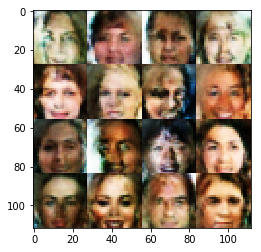

Epoch 1/1... Discriminator Loss: 1.5254... Generator Loss: 0.4954
Epoch 1/1... Discriminator Loss: 0.7324... Generator Loss: 1.2184
Epoch 1/1... Discriminator Loss: 1.2885... Generator Loss: 0.5693
Epoch 1/1... Discriminator Loss: 1.7060... Generator Loss: 0.5996
Epoch 1/1... Discriminator Loss: 1.3319... Generator Loss: 0.4442
Epoch 1/1... Discriminator Loss: 0.6902... Generator Loss: 0.9298
Epoch 1/1... Discriminator Loss: 1.0794... Generator Loss: 0.8836
Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.6585
Epoch 1/1... Discriminator Loss: 0.7351... Generator Loss: 1.2831
Epoch 1/1... Discriminator Loss: 1.5584... Generator Loss: 0.4166


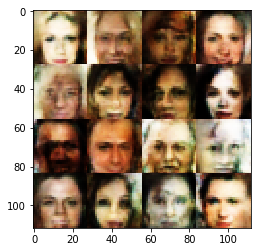

Epoch 1/1... Discriminator Loss: 1.7839... Generator Loss: 0.5248
Epoch 1/1... Discriminator Loss: 1.3170... Generator Loss: 0.4963
Epoch 1/1... Discriminator Loss: 2.2216... Generator Loss: 0.5901
Epoch 1/1... Discriminator Loss: 1.4947... Generator Loss: 0.4549
Epoch 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.8259
Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.4588
Epoch 1/1... Discriminator Loss: 1.5456... Generator Loss: 0.5443
Epoch 1/1... Discriminator Loss: 1.2341... Generator Loss: 0.5914
Epoch 1/1... Discriminator Loss: 1.5307... Generator Loss: 0.4715
Epoch 1/1... Discriminator Loss: 1.0177... Generator Loss: 0.8033


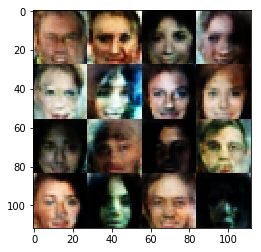

Epoch 1/1... Discriminator Loss: 1.4441... Generator Loss: 0.4149
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.6137
Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.5296
Epoch 1/1... Discriminator Loss: 1.7192... Generator Loss: 0.4285
Epoch 1/1... Discriminator Loss: 1.0773... Generator Loss: 0.7839
Epoch 1/1... Discriminator Loss: 1.2066... Generator Loss: 0.6249
Epoch 1/1... Discriminator Loss: 1.1972... Generator Loss: 0.7335
Epoch 1/1... Discriminator Loss: 1.6888... Generator Loss: 0.3534
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.4711
Epoch 1/1... Discriminator Loss: 1.4651... Generator Loss: 0.6114


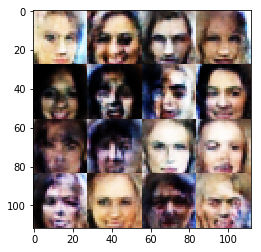

Epoch 1/1... Discriminator Loss: 1.7850... Generator Loss: 0.4225
Epoch 1/1... Discriminator Loss: 1.4856... Generator Loss: 0.4817
Epoch 1/1... Discriminator Loss: 1.1246... Generator Loss: 0.7098
Epoch 1/1... Discriminator Loss: 1.4830... Generator Loss: 0.5302
Epoch 1/1... Discriminator Loss: 1.0371... Generator Loss: 0.6332
Epoch 1/1... Discriminator Loss: 1.0970... Generator Loss: 0.6992
Epoch 1/1... Discriminator Loss: 1.9230... Generator Loss: 0.4922
Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.5564
Epoch 1/1... Discriminator Loss: 1.8640... Generator Loss: 0.3233
Epoch 1/1... Discriminator Loss: 1.3235... Generator Loss: 0.5714


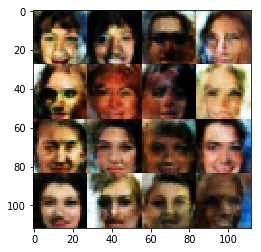

Epoch 1/1... Discriminator Loss: 1.2076... Generator Loss: 0.6526
Epoch 1/1... Discriminator Loss: 1.3799... Generator Loss: 0.4716
Epoch 1/1... Discriminator Loss: 1.4765... Generator Loss: 0.6245
Epoch 1/1... Discriminator Loss: 1.4318... Generator Loss: 0.5868
Epoch 1/1... Discriminator Loss: 1.5374... Generator Loss: 0.4014
Epoch 1/1... Discriminator Loss: 1.2119... Generator Loss: 0.6838
Epoch 1/1... Discriminator Loss: 1.3263... Generator Loss: 0.7753
Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 0.6507
Epoch 1/1... Discriminator Loss: 1.0307... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.5766... Generator Loss: 0.4919


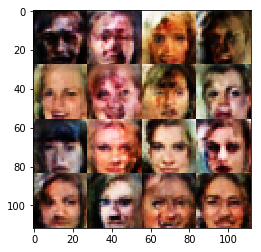

Epoch 1/1... Discriminator Loss: 1.5929... Generator Loss: 0.3836
Epoch 1/1... Discriminator Loss: 1.0646... Generator Loss: 0.6104
Epoch 1/1... Discriminator Loss: 1.7135... Generator Loss: 0.3526
Epoch 1/1... Discriminator Loss: 1.1444... Generator Loss: 0.6187
Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 0.5222
Epoch 1/1... Discriminator Loss: 1.3803... Generator Loss: 0.6391
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.6159
Epoch 1/1... Discriminator Loss: 1.9824... Generator Loss: 0.4516
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.4961
Epoch 1/1... Discriminator Loss: 1.4433... Generator Loss: 0.3962


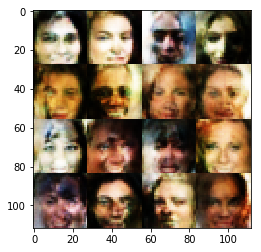

Epoch 1/1... Discriminator Loss: 1.8420... Generator Loss: 0.4739
Epoch 1/1... Discriminator Loss: 1.2580... Generator Loss: 0.5244
Epoch 1/1... Discriminator Loss: 0.9672... Generator Loss: 0.7528
Epoch 1/1... Discriminator Loss: 1.6890... Generator Loss: 0.4256
Epoch 1/1... Discriminator Loss: 1.3092... Generator Loss: 0.4988
Epoch 1/1... Discriminator Loss: 1.5604... Generator Loss: 0.3622
Epoch 1/1... Discriminator Loss: 1.6514... Generator Loss: 0.5753
Epoch 1/1... Discriminator Loss: 1.2973... Generator Loss: 0.6064
Epoch 1/1... Discriminator Loss: 1.0500... Generator Loss: 0.7488
Epoch 1/1... Discriminator Loss: 0.8171... Generator Loss: 0.9362


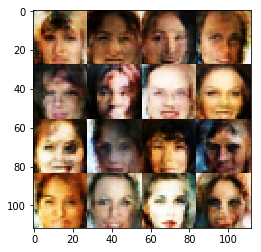

Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.5672
Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.4992
Epoch 1/1... Discriminator Loss: 1.1697... Generator Loss: 0.4990
Epoch 1/1... Discriminator Loss: 1.1858... Generator Loss: 0.7122
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.3126... Generator Loss: 0.5297
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.5884
Epoch 1/1... Discriminator Loss: 0.9834... Generator Loss: 0.6004
Epoch 1/1... Discriminator Loss: 0.8546... Generator Loss: 0.9574
Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.6174


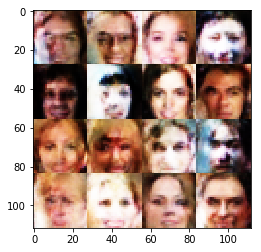

Epoch 1/1... Discriminator Loss: 1.7242... Generator Loss: 0.4465
Epoch 1/1... Discriminator Loss: 0.9936... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 0.6006
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.4176
Epoch 1/1... Discriminator Loss: 1.2766... Generator Loss: 0.5420
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.5226
Epoch 1/1... Discriminator Loss: 1.0260... Generator Loss: 0.6099
Epoch 1/1... Discriminator Loss: 0.8275... Generator Loss: 0.9545
Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 1.6225... Generator Loss: 0.4905


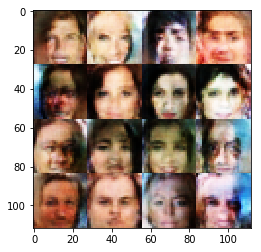

Epoch 1/1... Discriminator Loss: 1.2305... Generator Loss: 0.5781
Epoch 1/1... Discriminator Loss: 1.4747... Generator Loss: 0.3982
Epoch 1/1... Discriminator Loss: 1.5286... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.9923... Generator Loss: 0.5195
Epoch 1/1... Discriminator Loss: 2.0168... Generator Loss: 0.3240
Epoch 1/1... Discriminator Loss: 1.4877... Generator Loss: 0.4299
Epoch 1/1... Discriminator Loss: 1.1024... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.2958... Generator Loss: 0.6362
Epoch 1/1... Discriminator Loss: 1.2702... Generator Loss: 0.6121
Epoch 1/1... Discriminator Loss: 1.0609... Generator Loss: 0.6639


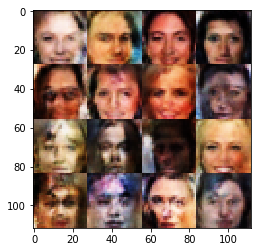

Epoch 1/1... Discriminator Loss: 2.5503... Generator Loss: 0.1807
Epoch 1/1... Discriminator Loss: 2.2260... Generator Loss: 0.3013
Epoch 1/1... Discriminator Loss: 1.6917... Generator Loss: 0.4036
Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.6133
Epoch 1/1... Discriminator Loss: 1.1005... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 2.1199... Generator Loss: 0.3971
Epoch 1/1... Discriminator Loss: 1.2146... Generator Loss: 0.6073
Epoch 1/1... Discriminator Loss: 1.5469... Generator Loss: 0.6766
Epoch 1/1... Discriminator Loss: 1.1776... Generator Loss: 0.5838
Epoch 1/1... Discriminator Loss: 1.5201... Generator Loss: 0.4899


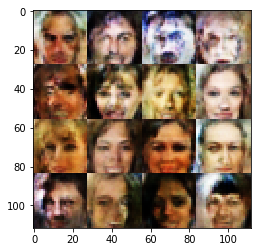

Epoch 1/1... Discriminator Loss: 1.1909... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 1.1351... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 1.5747... Generator Loss: 0.6565
Epoch 1/1... Discriminator Loss: 1.1984... Generator Loss: 0.4813
Epoch 1/1... Discriminator Loss: 1.4297... Generator Loss: 0.5350
Epoch 1/1... Discriminator Loss: 2.0980... Generator Loss: 0.3782
Epoch 1/1... Discriminator Loss: 1.2242... Generator Loss: 0.6678
Epoch 1/1... Discriminator Loss: 1.3436... Generator Loss: 0.8039
Epoch 1/1... Discriminator Loss: 1.7905... Generator Loss: 0.3948
Epoch 1/1... Discriminator Loss: 1.2432... Generator Loss: 0.7389


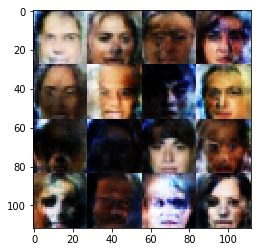

Epoch 1/1... Discriminator Loss: 1.7771... Generator Loss: 0.3853
Epoch 1/1... Discriminator Loss: 1.3480... Generator Loss: 0.6688
Epoch 1/1... Discriminator Loss: 1.5641... Generator Loss: 0.4424
Epoch 1/1... Discriminator Loss: 1.3101... Generator Loss: 0.4232
Epoch 1/1... Discriminator Loss: 0.9537... Generator Loss: 0.7139
Epoch 1/1... Discriminator Loss: 1.1388... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 0.9956... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.7167... Generator Loss: 0.4792
Epoch 1/1... Discriminator Loss: 1.6910... Generator Loss: 0.5027
Epoch 1/1... Discriminator Loss: 1.2488... Generator Loss: 0.4756


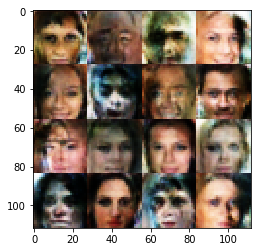

Epoch 1/1... Discriminator Loss: 0.7690... Generator Loss: 0.9391
Epoch 1/1... Discriminator Loss: 1.4588... Generator Loss: 0.5898
Epoch 1/1... Discriminator Loss: 1.7369... Generator Loss: 0.4203
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.5445
Epoch 1/1... Discriminator Loss: 1.5063... Generator Loss: 0.7608
Epoch 1/1... Discriminator Loss: 0.8812... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 0.8532
Epoch 1/1... Discriminator Loss: 1.0432... Generator Loss: 0.5623
Epoch 1/1... Discriminator Loss: 0.9826... Generator Loss: 0.8942
Epoch 1/1... Discriminator Loss: 1.1224... Generator Loss: 0.6565


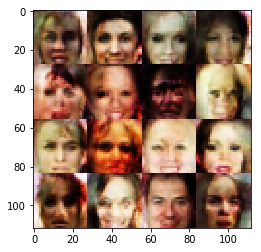

Epoch 1/1... Discriminator Loss: 1.0950... Generator Loss: 0.6796
Epoch 1/1... Discriminator Loss: 1.6662... Generator Loss: 0.4709
Epoch 1/1... Discriminator Loss: 1.2572... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.5528
Epoch 1/1... Discriminator Loss: 1.6458... Generator Loss: 0.3895
Epoch 1/1... Discriminator Loss: 1.7291... Generator Loss: 0.5449
Epoch 1/1... Discriminator Loss: 1.2292... Generator Loss: 0.5142
Epoch 1/1... Discriminator Loss: 1.8312... Generator Loss: 0.4177
Epoch 1/1... Discriminator Loss: 1.7292... Generator Loss: 0.4504
Epoch 1/1... Discriminator Loss: 1.1792... Generator Loss: 0.6095


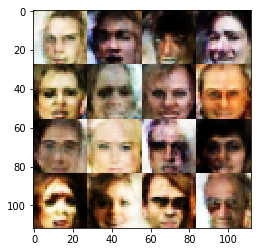

Epoch 1/1... Discriminator Loss: 1.7064... Generator Loss: 0.5647
Epoch 1/1... Discriminator Loss: 1.5476... Generator Loss: 0.5326
Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.5886
Epoch 1/1... Discriminator Loss: 0.9172... Generator Loss: 0.7613
Epoch 1/1... Discriminator Loss: 1.2548... Generator Loss: 0.6161
Epoch 1/1... Discriminator Loss: 1.0585... Generator Loss: 0.7854
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 0.4600
Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.5314
Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 0.8396
Epoch 1/1... Discriminator Loss: 1.5930... Generator Loss: 0.4390


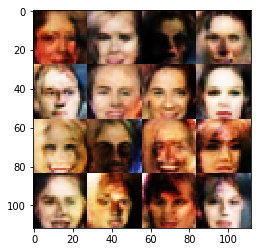

Epoch 1/1... Discriminator Loss: 1.5666... Generator Loss: 0.5359
Epoch 1/1... Discriminator Loss: 1.5650... Generator Loss: 0.4101
Epoch 1/1... Discriminator Loss: 1.1831... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.5469... Generator Loss: 0.5610
Epoch 1/1... Discriminator Loss: 1.1557... Generator Loss: 0.5924
Epoch 1/1... Discriminator Loss: 1.6003... Generator Loss: 0.4720
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.4815
Epoch 1/1... Discriminator Loss: 1.7561... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 1.0920... Generator Loss: 0.7012
Epoch 1/1... Discriminator Loss: 1.3698... Generator Loss: 0.6837


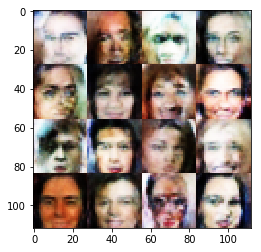

Epoch 1/1... Discriminator Loss: 1.1720... Generator Loss: 0.7162
Epoch 1/1... Discriminator Loss: 1.8557... Generator Loss: 0.6776
Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.6202
Epoch 1/1... Discriminator Loss: 1.4983... Generator Loss: 0.5752
Epoch 1/1... Discriminator Loss: 1.7258... Generator Loss: 0.5445
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.4527
Epoch 1/1... Discriminator Loss: 1.1337... Generator Loss: 0.5698
Epoch 1/1... Discriminator Loss: 2.0046... Generator Loss: 0.3174
Epoch 1/1... Discriminator Loss: 1.2052... Generator Loss: 0.6685
Epoch 1/1... Discriminator Loss: 1.0594... Generator Loss: 0.6729


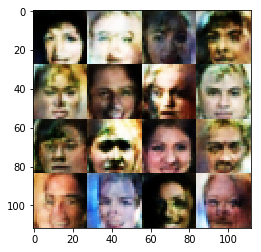

Epoch 1/1... Discriminator Loss: 1.5961... Generator Loss: 0.4871
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.5608
Epoch 1/1... Discriminator Loss: 1.0721... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.1213... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 0.6366
Epoch 1/1... Discriminator Loss: 1.5328... Generator Loss: 0.6806
Epoch 1/1... Discriminator Loss: 0.6667... Generator Loss: 1.1420
Epoch 1/1... Discriminator Loss: 1.0612... Generator Loss: 0.6460
Epoch 1/1... Discriminator Loss: 1.4962... Generator Loss: 0.4059
Epoch 1/1... Discriminator Loss: 1.3799... Generator Loss: 0.5750


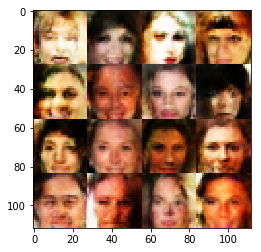

Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.6317
Epoch 1/1... Discriminator Loss: 1.1443... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 0.9231... Generator Loss: 0.8887
Epoch 1/1... Discriminator Loss: 2.3184... Generator Loss: 0.2615
Epoch 1/1... Discriminator Loss: 0.9333... Generator Loss: 0.7840
Epoch 1/1... Discriminator Loss: 1.2107... Generator Loss: 0.7723
Epoch 1/1... Discriminator Loss: 1.6488... Generator Loss: 0.3839
Epoch 1/1... Discriminator Loss: 1.1023... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 1.2850... Generator Loss: 0.6372
Epoch 1/1... Discriminator Loss: 1.6806... Generator Loss: 0.4714


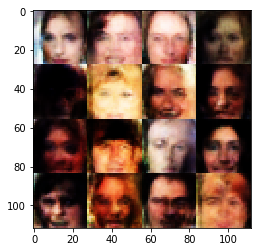

Epoch 1/1... Discriminator Loss: 0.9731... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 1.0852... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.6970... Generator Loss: 0.3895
Epoch 1/1... Discriminator Loss: 1.5132... Generator Loss: 0.4918
Epoch 1/1... Discriminator Loss: 1.4496... Generator Loss: 0.3944
Epoch 1/1... Discriminator Loss: 1.4192... Generator Loss: 0.5358
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.6058
Epoch 1/1... Discriminator Loss: 1.8480... Generator Loss: 0.5104
Epoch 1/1... Discriminator Loss: 1.5968... Generator Loss: 0.7024


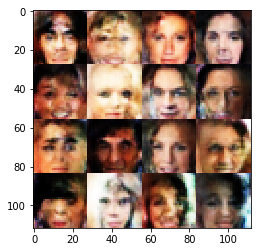

Epoch 1/1... Discriminator Loss: 0.8731... Generator Loss: 0.9881
Epoch 1/1... Discriminator Loss: 1.5307... Generator Loss: 0.4548
Epoch 1/1... Discriminator Loss: 1.6986... Generator Loss: 0.4045
Epoch 1/1... Discriminator Loss: 1.2183... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.5422... Generator Loss: 0.4574
Epoch 1/1... Discriminator Loss: 1.1863... Generator Loss: 0.5402
Epoch 1/1... Discriminator Loss: 1.9058... Generator Loss: 0.3006
Epoch 1/1... Discriminator Loss: 1.3925... Generator Loss: 0.4631
Epoch 1/1... Discriminator Loss: 1.2322... Generator Loss: 0.5414
Epoch 1/1... Discriminator Loss: 1.8134... Generator Loss: 0.3632


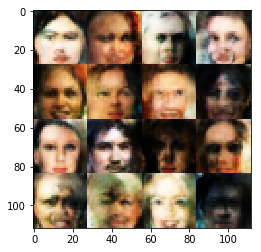

Epoch 1/1... Discriminator Loss: 0.4002... Generator Loss: 1.3627
Epoch 1/1... Discriminator Loss: 1.6563... Generator Loss: 0.4607
Epoch 1/1... Discriminator Loss: 1.5900... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 1.4435... Generator Loss: 0.6652
Epoch 1/1... Discriminator Loss: 1.4116... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.1568... Generator Loss: 0.8221
Epoch 1/1... Discriminator Loss: 1.5510... Generator Loss: 0.4361
Epoch 1/1... Discriminator Loss: 1.8980... Generator Loss: 0.3862
Epoch 1/1... Discriminator Loss: 1.2376... Generator Loss: 0.6238
Epoch 1/1... Discriminator Loss: 1.4900... Generator Loss: 0.4810


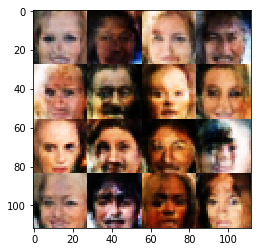

Epoch 1/1... Discriminator Loss: 1.1433... Generator Loss: 0.5976
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.4268
Epoch 1/1... Discriminator Loss: 1.1265... Generator Loss: 0.9523
Epoch 1/1... Discriminator Loss: 1.5261... Generator Loss: 0.4822
Epoch 1/1... Discriminator Loss: 1.2275... Generator Loss: 0.5712
Epoch 1/1... Discriminator Loss: 1.2722... Generator Loss: 0.5556
Epoch 1/1... Discriminator Loss: 1.4785... Generator Loss: 0.4572
Epoch 1/1... Discriminator Loss: 1.4581... Generator Loss: 0.3407
Epoch 1/1... Discriminator Loss: 1.5455... Generator Loss: 0.6028
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.5752


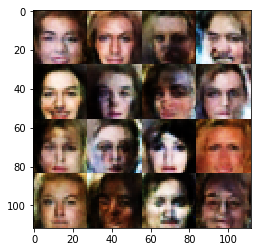

Epoch 1/1... Discriminator Loss: 1.1506... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.1734... Generator Loss: 0.6550
Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.3557... Generator Loss: 0.5875
Epoch 1/1... Discriminator Loss: 1.1286... Generator Loss: 0.7314
Epoch 1/1... Discriminator Loss: 1.2349... Generator Loss: 0.6585
Epoch 1/1... Discriminator Loss: 0.9085... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.6337... Generator Loss: 0.4563
Epoch 1/1... Discriminator Loss: 1.0306... Generator Loss: 0.6809
Epoch 1/1... Discriminator Loss: 1.0442... Generator Loss: 0.7249


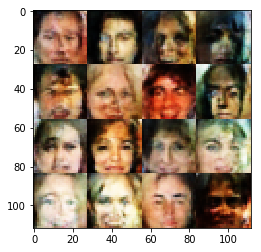

Epoch 1/1... Discriminator Loss: 1.2449... Generator Loss: 0.6963
Epoch 1/1... Discriminator Loss: 1.9527... Generator Loss: 0.3677
Epoch 1/1... Discriminator Loss: 1.0590... Generator Loss: 0.6302
Epoch 1/1... Discriminator Loss: 1.5806... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.4657... Generator Loss: 0.6276
Epoch 1/1... Discriminator Loss: 1.0233... Generator Loss: 0.7919
Epoch 1/1... Discriminator Loss: 1.4747... Generator Loss: 0.5407
Epoch 1/1... Discriminator Loss: 1.0588... Generator Loss: 0.6349
Epoch 1/1... Discriminator Loss: 1.9118... Generator Loss: 0.2746
Epoch 1/1... Discriminator Loss: 1.2848... Generator Loss: 0.5315


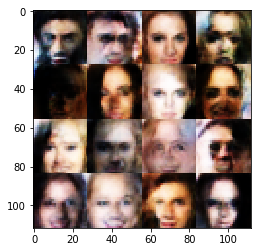

Epoch 1/1... Discriminator Loss: 1.5583... Generator Loss: 0.6336
Epoch 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.4449
Epoch 1/1... Discriminator Loss: 0.9656... Generator Loss: 0.7341
Epoch 1/1... Discriminator Loss: 1.3049... Generator Loss: 0.6086
Epoch 1/1... Discriminator Loss: 1.5384... Generator Loss: 0.5859
Epoch 1/1... Discriminator Loss: 0.5435... Generator Loss: 1.1503
Epoch 1/1... Discriminator Loss: 0.8033... Generator Loss: 0.8593
Epoch 1/1... Discriminator Loss: 1.9595... Generator Loss: 0.3444
Epoch 1/1... Discriminator Loss: 1.1410... Generator Loss: 0.7618
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.7252


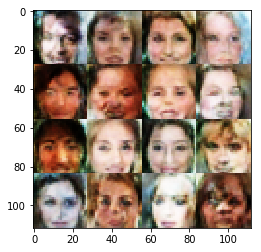

Epoch 1/1... Discriminator Loss: 1.3081... Generator Loss: 0.4376
Epoch 1/1... Discriminator Loss: 1.7687... Generator Loss: 0.5503
Epoch 1/1... Discriminator Loss: 1.3031... Generator Loss: 0.6847
Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.5026
Epoch 1/1... Discriminator Loss: 1.8011... Generator Loss: 0.5260
Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.6738
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.6075
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.5471
Epoch 1/1... Discriminator Loss: 1.4760... Generator Loss: 0.4810
Epoch 1/1... Discriminator Loss: 1.1585... Generator Loss: 0.5413


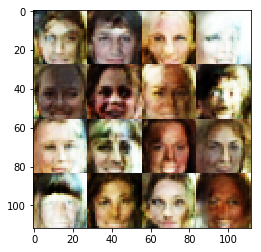

Epoch 1/1... Discriminator Loss: 1.5704... Generator Loss: 0.5760
Epoch 1/1... Discriminator Loss: 1.1926... Generator Loss: 0.5941
Epoch 1/1... Discriminator Loss: 1.8015... Generator Loss: 0.3396
Epoch 1/1... Discriminator Loss: 1.2665... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.1291... Generator Loss: 0.8690
Epoch 1/1... Discriminator Loss: 1.5237... Generator Loss: 0.4872
Epoch 1/1... Discriminator Loss: 1.0640... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.7763
Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 1.0737


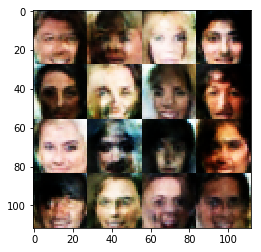

Epoch 1/1... Discriminator Loss: 1.1365... Generator Loss: 0.6237
Epoch 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.5095
Epoch 1/1... Discriminator Loss: 0.9585... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.1742... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.2869... Generator Loss: 0.4480
Epoch 1/1... Discriminator Loss: 1.2224... Generator Loss: 0.5488
Epoch 1/1... Discriminator Loss: 1.5250... Generator Loss: 0.4988
Epoch 1/1... Discriminator Loss: 1.2080... Generator Loss: 0.6006
Epoch 1/1... Discriminator Loss: 1.5944... Generator Loss: 0.4742
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.6608


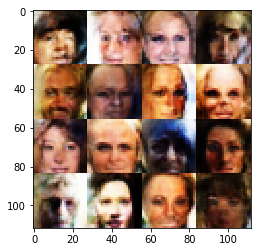

Epoch 1/1... Discriminator Loss: 1.0104... Generator Loss: 0.7130
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.7261
Epoch 1/1... Discriminator Loss: 1.5387... Generator Loss: 0.6389
Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 0.6607
Epoch 1/1... Discriminator Loss: 1.2235... Generator Loss: 0.5815
Epoch 1/1... Discriminator Loss: 1.3893... Generator Loss: 0.5405
Epoch 1/1... Discriminator Loss: 1.2512... Generator Loss: 0.4780
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.6984
Epoch 1/1... Discriminator Loss: 1.2157... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 2.2020... Generator Loss: 0.3451


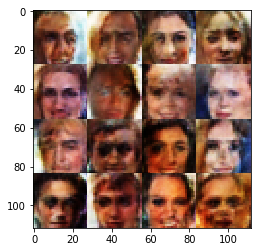

Epoch 1/1... Discriminator Loss: 1.6059... Generator Loss: 0.4306
Epoch 1/1... Discriminator Loss: 1.0524... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.7063... Generator Loss: 0.5692
Epoch 1/1... Discriminator Loss: 1.4580... Generator Loss: 0.4699
Epoch 1/1... Discriminator Loss: 1.4296... Generator Loss: 0.5394
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.5756
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 0.5077
Epoch 1/1... Discriminator Loss: 1.5087... Generator Loss: 0.4044
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.6584
Epoch 1/1... Discriminator Loss: 1.3262... Generator Loss: 0.5326


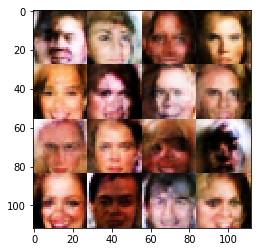

Epoch 1/1... Discriminator Loss: 1.6576... Generator Loss: 0.4294
Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 0.4509
Epoch 1/1... Discriminator Loss: 1.7373... Generator Loss: 0.5196
Epoch 1/1... Discriminator Loss: 1.1244... Generator Loss: 0.6378
Epoch 1/1... Discriminator Loss: 1.0467... Generator Loss: 0.5608
Epoch 1/1... Discriminator Loss: 1.2905... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 0.9193... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.5072
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.6810
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.4223


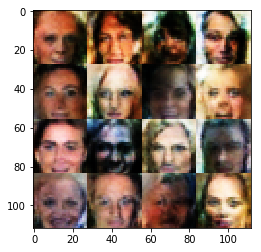

Epoch 1/1... Discriminator Loss: 0.7668... Generator Loss: 1.0182
Epoch 1/1... Discriminator Loss: 1.1600... Generator Loss: 0.8302
Epoch 1/1... Discriminator Loss: 1.2655... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 1.5606... Generator Loss: 0.3961
Epoch 1/1... Discriminator Loss: 1.6726... Generator Loss: 0.3389
Epoch 1/1... Discriminator Loss: 1.2053... Generator Loss: 0.8274
Epoch 1/1... Discriminator Loss: 1.3637... Generator Loss: 0.5336
Epoch 1/1... Discriminator Loss: 1.8799... Generator Loss: 0.5509
Epoch 1/1... Discriminator Loss: 0.8444... Generator Loss: 0.9838
Epoch 1/1... Discriminator Loss: 0.8289... Generator Loss: 0.8004


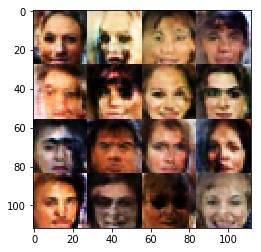

Epoch 1/1... Discriminator Loss: 1.1435... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 1.3015... Generator Loss: 0.5327
Epoch 1/1... Discriminator Loss: 1.5576... Generator Loss: 0.4561
Epoch 1/1... Discriminator Loss: 1.4797... Generator Loss: 0.4631
Epoch 1/1... Discriminator Loss: 1.1438... Generator Loss: 0.4860
Epoch 1/1... Discriminator Loss: 0.6770... Generator Loss: 0.9065
Epoch 1/1... Discriminator Loss: 1.7456... Generator Loss: 0.4501
Epoch 1/1... Discriminator Loss: 2.1613... Generator Loss: 0.3317
Epoch 1/1... Discriminator Loss: 1.5728... Generator Loss: 0.4391
Epoch 1/1... Discriminator Loss: 1.1781... Generator Loss: 0.6024


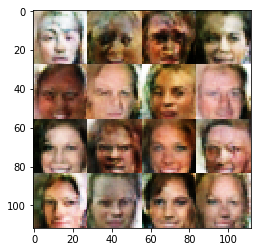

Epoch 1/1... Discriminator Loss: 1.3216... Generator Loss: 0.4343
Epoch 1/1... Discriminator Loss: 1.0337... Generator Loss: 0.7049
Epoch 1/1... Discriminator Loss: 1.1702... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.0615... Generator Loss: 0.5227
Epoch 1/1... Discriminator Loss: 1.7176... Generator Loss: 0.3524
Epoch 1/1... Discriminator Loss: 1.5335... Generator Loss: 0.5192
Epoch 1/1... Discriminator Loss: 1.1718... Generator Loss: 0.6710
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.5696
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.8276
Epoch 1/1... Discriminator Loss: 1.5363... Generator Loss: 0.5627


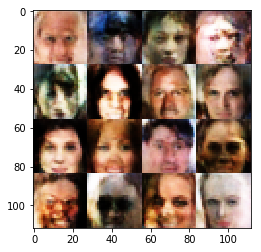

Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.5111
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 0.5293
Epoch 1/1... Discriminator Loss: 1.3012... Generator Loss: 0.6071
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.5620
Epoch 1/1... Discriminator Loss: 1.7227... Generator Loss: 0.5215
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.4783
Epoch 1/1... Discriminator Loss: 1.7873... Generator Loss: 0.4456
Epoch 1/1... Discriminator Loss: 0.9629... Generator Loss: 0.7865
Epoch 1/1... Discriminator Loss: 1.4597... Generator Loss: 0.6657
Epoch 1/1... Discriminator Loss: 1.2193... Generator Loss: 0.6071


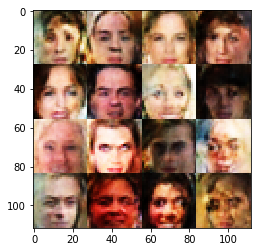

Epoch 1/1... Discriminator Loss: 1.8217... Generator Loss: 0.4224
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.6150
Epoch 1/1... Discriminator Loss: 1.0944... Generator Loss: 0.6925
Epoch 1/1... Discriminator Loss: 1.7663... Generator Loss: 0.4734
Epoch 1/1... Discriminator Loss: 1.2748... Generator Loss: 0.5624
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 0.5952
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.4395... Generator Loss: 0.5060
Epoch 1/1... Discriminator Loss: 1.5918... Generator Loss: 0.4487
Epoch 1/1... Discriminator Loss: 1.4952... Generator Loss: 0.6712


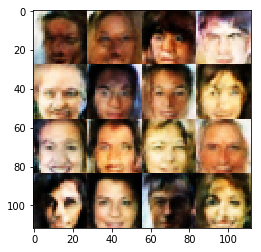

Epoch 1/1... Discriminator Loss: 1.1682... Generator Loss: 0.7096
Epoch 1/1... Discriminator Loss: 1.2348... Generator Loss: 0.5899
Epoch 1/1... Discriminator Loss: 1.3603... Generator Loss: 0.5921
Epoch 1/1... Discriminator Loss: 1.2674... Generator Loss: 0.5975
Epoch 1/1... Discriminator Loss: 1.0819... Generator Loss: 0.7295
Epoch 1/1... Discriminator Loss: 1.1228... Generator Loss: 0.6576
Epoch 1/1... Discriminator Loss: 1.2950... Generator Loss: 0.5100
Epoch 1/1... Discriminator Loss: 1.4541... Generator Loss: 0.6593
Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.4786
Epoch 1/1... Discriminator Loss: 1.4968... Generator Loss: 0.4608


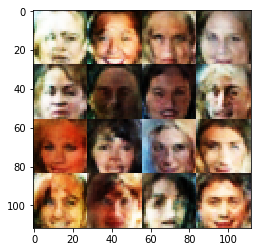

Epoch 1/1... Discriminator Loss: 0.7800... Generator Loss: 0.8235
Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 0.5296
Epoch 1/1... Discriminator Loss: 1.5686... Generator Loss: 0.4430
Epoch 1/1... Discriminator Loss: 0.9774... Generator Loss: 0.7821
Epoch 1/1... Discriminator Loss: 0.9849... Generator Loss: 1.0379
Epoch 1/1... Discriminator Loss: 1.4725... Generator Loss: 0.4037
Epoch 1/1... Discriminator Loss: 1.1659... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.0559... Generator Loss: 0.7158
Epoch 1/1... Discriminator Loss: 1.2658... Generator Loss: 0.7778
Epoch 1/1... Discriminator Loss: 0.9815... Generator Loss: 0.7717


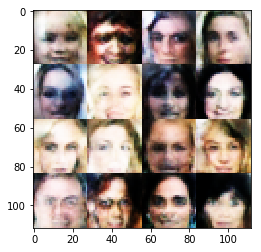

Epoch 1/1... Discriminator Loss: 1.6471... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.7720... Generator Loss: 0.4166
Epoch 1/1... Discriminator Loss: 1.4407... Generator Loss: 0.5054
Epoch 1/1... Discriminator Loss: 1.0699... Generator Loss: 0.7207
Epoch 1/1... Discriminator Loss: 1.6288... Generator Loss: 0.5624
Epoch 1/1... Discriminator Loss: 1.2391... Generator Loss: 0.5544
Epoch 1/1... Discriminator Loss: 0.8632... Generator Loss: 0.8138
Epoch 1/1... Discriminator Loss: 1.6210... Generator Loss: 0.4478
Epoch 1/1... Discriminator Loss: 1.5260... Generator Loss: 0.5210
Epoch 1/1... Discriminator Loss: 1.1701... Generator Loss: 0.5500


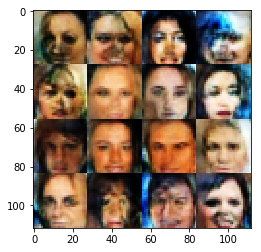

Epoch 1/1... Discriminator Loss: 1.7036... Generator Loss: 0.4139
Epoch 1/1... Discriminator Loss: 1.8437... Generator Loss: 0.3145
Epoch 1/1... Discriminator Loss: 1.0568... Generator Loss: 1.0207
Epoch 1/1... Discriminator Loss: 1.5425... Generator Loss: 0.4747
Epoch 1/1... Discriminator Loss: 1.5299... Generator Loss: 0.4786
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.5299
Epoch 1/1... Discriminator Loss: 1.2488... Generator Loss: 0.6036
Epoch 1/1... Discriminator Loss: 1.3505... Generator Loss: 0.4613
Epoch 1/1... Discriminator Loss: 1.5355... Generator Loss: 0.4068
Epoch 1/1... Discriminator Loss: 1.2832... Generator Loss: 0.5986


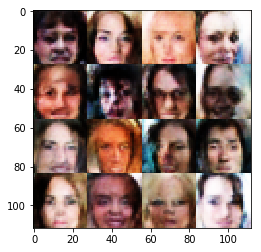

Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.5893
Epoch 1/1... Discriminator Loss: 1.0756... Generator Loss: 0.6730
Epoch 1/1... Discriminator Loss: 1.4860... Generator Loss: 0.6677
Epoch 1/1... Discriminator Loss: 1.4962... Generator Loss: 0.4460
Epoch 1/1... Discriminator Loss: 1.2213... Generator Loss: 0.6438
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.5960
Epoch 1/1... Discriminator Loss: 0.9634... Generator Loss: 0.7460
Epoch 1/1... Discriminator Loss: 1.0447... Generator Loss: 0.8759
Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.5612
Epoch 1/1... Discriminator Loss: 1.6302... Generator Loss: 0.5293


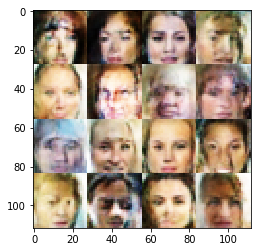

Epoch 1/1... Discriminator Loss: 1.5335... Generator Loss: 0.4576
Epoch 1/1... Discriminator Loss: 1.5610... Generator Loss: 0.4968
Epoch 1/1... Discriminator Loss: 1.4268... Generator Loss: 0.5642
Epoch 1/1... Discriminator Loss: 1.0293... Generator Loss: 0.7139
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.5026
Epoch 1/1... Discriminator Loss: 1.8360... Generator Loss: 0.5819
Epoch 1/1... Discriminator Loss: 1.0476... Generator Loss: 0.6335
Epoch 1/1... Discriminator Loss: 1.1192... Generator Loss: 0.5448
Epoch 1/1... Discriminator Loss: 1.6275... Generator Loss: 0.5112
Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.7635


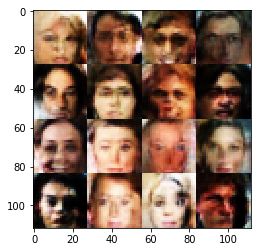

Epoch 1/1... Discriminator Loss: 1.0944... Generator Loss: 0.8008
Epoch 1/1... Discriminator Loss: 1.6543... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.4049
Epoch 1/1... Discriminator Loss: 0.9412... Generator Loss: 0.7713
Epoch 1/1... Discriminator Loss: 1.4987... Generator Loss: 0.5741
Epoch 1/1... Discriminator Loss: 1.0499... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 0.6324... Generator Loss: 1.0117
Epoch 1/1... Discriminator Loss: 1.1762... Generator Loss: 0.5775
Epoch 1/1... Discriminator Loss: 1.3022... Generator Loss: 0.5814
Epoch 1/1... Discriminator Loss: 1.4385... Generator Loss: 0.7041


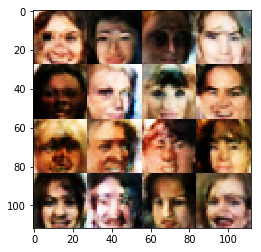

Epoch 1/1... Discriminator Loss: 1.2392... Generator Loss: 0.5294
Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.5992
Epoch 1/1... Discriminator Loss: 1.3076... Generator Loss: 0.7182
Epoch 1/1... Discriminator Loss: 0.8964... Generator Loss: 0.9073
Epoch 1/1... Discriminator Loss: 1.7684... Generator Loss: 0.3487
Epoch 1/1... Discriminator Loss: 2.0634... Generator Loss: 0.2733
Epoch 1/1... Discriminator Loss: 1.2128... Generator Loss: 0.6550
Epoch 1/1... Discriminator Loss: 0.9761... Generator Loss: 0.7891
Epoch 1/1... Discriminator Loss: 1.4901... Generator Loss: 0.5198
Epoch 1/1... Discriminator Loss: 1.5381... Generator Loss: 0.4793


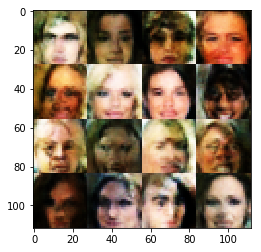

Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 0.7424
Epoch 1/1... Discriminator Loss: 1.0532... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 1.1125... Generator Loss: 0.9912
Epoch 1/1... Discriminator Loss: 1.5993... Generator Loss: 0.4015
Epoch 1/1... Discriminator Loss: 1.1139... Generator Loss: 0.6135
Epoch 1/1... Discriminator Loss: 1.4758... Generator Loss: 0.5258
Epoch 1/1... Discriminator Loss: 1.7030... Generator Loss: 0.4438
Epoch 1/1... Discriminator Loss: 1.5052... Generator Loss: 0.6085
Epoch 1/1... Discriminator Loss: 1.3019... Generator Loss: 0.6266
Epoch 1/1... Discriminator Loss: 1.5453... Generator Loss: 0.4847


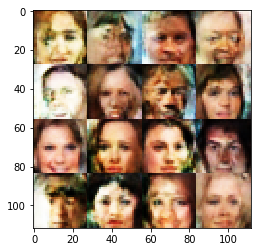

Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 0.6414
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 0.8191
Epoch 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.6906
Epoch 1/1... Discriminator Loss: 1.0583... Generator Loss: 0.6336
Epoch 1/1... Discriminator Loss: 1.6361... Generator Loss: 0.4464
Epoch 1/1... Discriminator Loss: 0.9882... Generator Loss: 0.7467
Epoch 1/1... Discriminator Loss: 1.0544... Generator Loss: 0.5733
Epoch 1/1... Discriminator Loss: 0.8880... Generator Loss: 0.7450
Epoch 1/1... Discriminator Loss: 1.5856... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.1063... Generator Loss: 0.6395


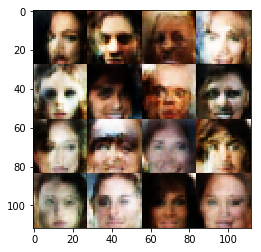

Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.6758
Epoch 1/1... Discriminator Loss: 1.3802... Generator Loss: 0.4969
Epoch 1/1... Discriminator Loss: 1.6845... Generator Loss: 0.4172
Epoch 1/1... Discriminator Loss: 1.2822... Generator Loss: 0.4670
Epoch 1/1... Discriminator Loss: 0.9004... Generator Loss: 0.9236
Epoch 1/1... Discriminator Loss: 1.8031... Generator Loss: 0.4489
Epoch 1/1... Discriminator Loss: 1.3496... Generator Loss: 0.4953
Epoch 1/1... Discriminator Loss: 1.3374... Generator Loss: 0.5866
Epoch 1/1... Discriminator Loss: 1.7395... Generator Loss: 0.6255
Epoch 1/1... Discriminator Loss: 1.1946... Generator Loss: 0.7063


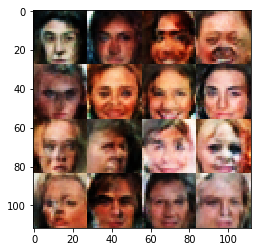

Epoch 1/1... Discriminator Loss: 1.4612... Generator Loss: 0.4142
Epoch 1/1... Discriminator Loss: 1.5548... Generator Loss: 0.4098
Epoch 1/1... Discriminator Loss: 1.5305... Generator Loss: 0.5126
Epoch 1/1... Discriminator Loss: 1.3103... Generator Loss: 0.5953
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.5200
Epoch 1/1... Discriminator Loss: 1.2888... Generator Loss: 0.5703
Epoch 1/1... Discriminator Loss: 0.8680... Generator Loss: 0.8972
Epoch 1/1... Discriminator Loss: 1.9244... Generator Loss: 0.5294
Epoch 1/1... Discriminator Loss: 1.1328... Generator Loss: 0.5781
Epoch 1/1... Discriminator Loss: 1.4872... Generator Loss: 0.5805


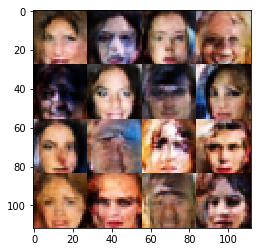

Epoch 1/1... Discriminator Loss: 1.5438... Generator Loss: 0.3762
Epoch 1/1... Discriminator Loss: 1.2085... Generator Loss: 0.6301
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.5449
Epoch 1/1... Discriminator Loss: 0.9500... Generator Loss: 1.0567
Epoch 1/1... Discriminator Loss: 1.6499... Generator Loss: 0.5229
Epoch 1/1... Discriminator Loss: 1.4781... Generator Loss: 0.6490
Epoch 1/1... Discriminator Loss: 0.9630... Generator Loss: 0.8309
Epoch 1/1... Discriminator Loss: 1.3606... Generator Loss: 0.4878
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.5611
Epoch 1/1... Discriminator Loss: 1.5183... Generator Loss: 0.5341


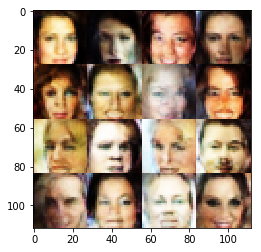

Epoch 1/1... Discriminator Loss: 1.3002... Generator Loss: 0.4055
Epoch 1/1... Discriminator Loss: 1.2846... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.6873... Generator Loss: 0.5550
Epoch 1/1... Discriminator Loss: 1.0936... Generator Loss: 0.7639
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 0.7360
Epoch 1/1... Discriminator Loss: 1.4943... Generator Loss: 0.5365
Epoch 1/1... Discriminator Loss: 1.3755... Generator Loss: 0.5589
Epoch 1/1... Discriminator Loss: 1.8580... Generator Loss: 0.3932
Epoch 1/1... Discriminator Loss: 1.8324... Generator Loss: 0.4105
Epoch 1/1... Discriminator Loss: 0.9791... Generator Loss: 0.6522


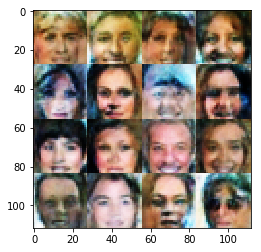

Epoch 1/1... Discriminator Loss: 1.7715... Generator Loss: 0.3637
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.8311
Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 0.6985
Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 0.5567
Epoch 1/1... Discriminator Loss: 1.1641... Generator Loss: 0.5963
Epoch 1/1... Discriminator Loss: 2.1457... Generator Loss: 0.2618
Epoch 1/1... Discriminator Loss: 1.0027... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.6858... Generator Loss: 0.3447
Epoch 1/1... Discriminator Loss: 1.4996... Generator Loss: 0.4480
Epoch 1/1... Discriminator Loss: 1.5228... Generator Loss: 0.5187


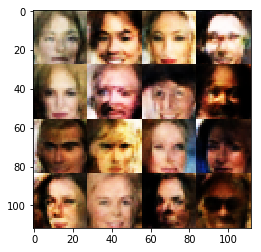

Epoch 1/1... Discriminator Loss: 1.0065... Generator Loss: 0.9023
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.5520
Epoch 1/1... Discriminator Loss: 1.2046... Generator Loss: 0.5876
Epoch 1/1... Discriminator Loss: 1.5496... Generator Loss: 0.5302
Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 0.7611
Epoch 1/1... Discriminator Loss: 1.5513... Generator Loss: 0.5343
Epoch 1/1... Discriminator Loss: 1.0807... Generator Loss: 0.6136
Epoch 1/1... Discriminator Loss: 1.1190... Generator Loss: 0.6644
Epoch 1/1... Discriminator Loss: 1.4809... Generator Loss: 0.4836
Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.7009


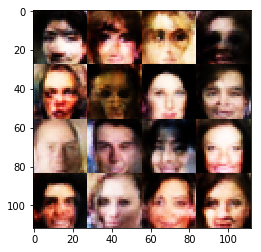

Epoch 1/1... Discriminator Loss: 1.0082... Generator Loss: 0.8885
Epoch 1/1... Discriminator Loss: 1.6815... Generator Loss: 0.5532
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.6552
Epoch 1/1... Discriminator Loss: 1.5491... Generator Loss: 0.4934
Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.7053
Epoch 1/1... Discriminator Loss: 1.2151... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.7610... Generator Loss: 0.6297
Epoch 1/1... Discriminator Loss: 1.3098... Generator Loss: 0.4885
Epoch 1/1... Discriminator Loss: 1.4393... Generator Loss: 0.5096
Epoch 1/1... Discriminator Loss: 0.9006... Generator Loss: 0.8442


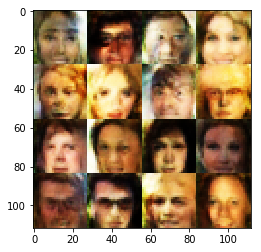

Epoch 1/1... Discriminator Loss: 1.2509... Generator Loss: 0.5956
Epoch 1/1... Discriminator Loss: 1.6956... Generator Loss: 0.3943
Epoch 1/1... Discriminator Loss: 1.5630... Generator Loss: 0.7183
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.7082
Epoch 1/1... Discriminator Loss: 1.5002... Generator Loss: 0.5072
Epoch 1/1... Discriminator Loss: 1.8358... Generator Loss: 0.4146
Epoch 1/1... Discriminator Loss: 1.2813... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.5133
Epoch 1/1... Discriminator Loss: 1.4998... Generator Loss: 0.5384
Epoch 1/1... Discriminator Loss: 1.4035... Generator Loss: 1.0274


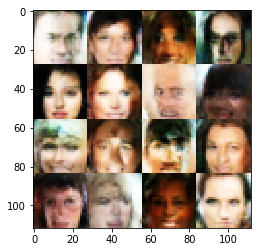

Epoch 1/1... Discriminator Loss: 0.9552... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.6828... Generator Loss: 0.5897
Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.4827... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.0937... Generator Loss: 0.8059
Epoch 1/1... Discriminator Loss: 1.5135... Generator Loss: 0.5213
Epoch 1/1... Discriminator Loss: 1.5858... Generator Loss: 0.6554
Epoch 1/1... Discriminator Loss: 1.1651... Generator Loss: 0.6576
Epoch 1/1... Discriminator Loss: 1.0923... Generator Loss: 0.6094
Epoch 1/1... Discriminator Loss: 1.0677... Generator Loss: 0.6712


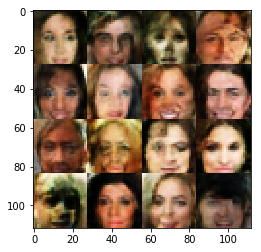

Epoch 1/1... Discriminator Loss: 1.3590... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 0.9614... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.7187... Generator Loss: 0.4991
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6423
Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.6049
Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.5388
Epoch 1/1... Discriminator Loss: 2.3428... Generator Loss: 0.2727
Epoch 1/1... Discriminator Loss: 1.8378... Generator Loss: 0.4298
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.5088
Epoch 1/1... Discriminator Loss: 1.3721... Generator Loss: 0.6819


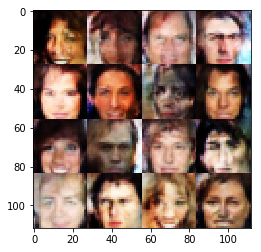

Epoch 1/1... Discriminator Loss: 1.0766... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 1.7217... Generator Loss: 0.3631
Epoch 1/1... Discriminator Loss: 1.6377... Generator Loss: 0.4449
Epoch 1/1... Discriminator Loss: 1.2186... Generator Loss: 0.6080
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 1.6438... Generator Loss: 0.5198
Epoch 1/1... Discriminator Loss: 1.2496... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.4606
Epoch 1/1... Discriminator Loss: 2.2464... Generator Loss: 0.3397
Epoch 1/1... Discriminator Loss: 1.2628... Generator Loss: 0.6780


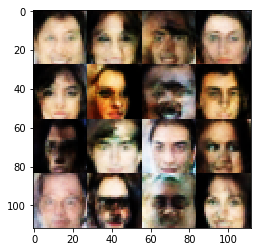

Epoch 1/1... Discriminator Loss: 0.8776... Generator Loss: 0.7766
Epoch 1/1... Discriminator Loss: 1.6625... Generator Loss: 0.5872
Epoch 1/1... Discriminator Loss: 1.8211... Generator Loss: 0.3302
Epoch 1/1... Discriminator Loss: 1.6809... Generator Loss: 0.9771
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.6296
Epoch 1/1... Discriminator Loss: 1.2599... Generator Loss: 0.6890
Epoch 1/1... Discriminator Loss: 1.1039... Generator Loss: 0.6376
Epoch 1/1... Discriminator Loss: 1.5122... Generator Loss: 0.4368
Epoch 1/1... Discriminator Loss: 1.5090... Generator Loss: 0.6308
Epoch 1/1... Discriminator Loss: 0.9304... Generator Loss: 0.6403


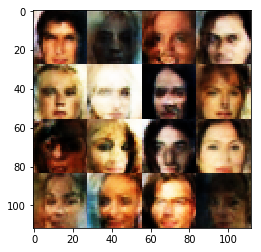

Epoch 1/1... Discriminator Loss: 1.9977... Generator Loss: 0.3208
Epoch 1/1... Discriminator Loss: 1.1828... Generator Loss: 0.4982
Epoch 1/1... Discriminator Loss: 1.0439... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.5765
Epoch 1/1... Discriminator Loss: 1.2724... Generator Loss: 0.6619
Epoch 1/1... Discriminator Loss: 1.5271... Generator Loss: 0.5215
Epoch 1/1... Discriminator Loss: 0.9157... Generator Loss: 0.9012
Epoch 1/1... Discriminator Loss: 0.9436... Generator Loss: 0.7704
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.9999
Epoch 1/1... Discriminator Loss: 0.5763... Generator Loss: 1.1267


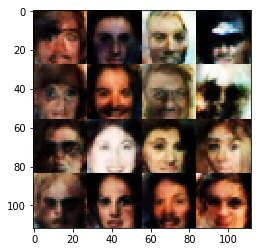

Epoch 1/1... Discriminator Loss: 1.1269... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 1.0350... Generator Loss: 0.8613
Epoch 1/1... Discriminator Loss: 1.3338... Generator Loss: 0.5469
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.7008
Epoch 1/1... Discriminator Loss: 1.1018... Generator Loss: 0.6314
Epoch 1/1... Discriminator Loss: 1.0222... Generator Loss: 0.8175
Epoch 1/1... Discriminator Loss: 1.2506... Generator Loss: 0.9002
Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 0.6524
Epoch 1/1... Discriminator Loss: 1.6921... Generator Loss: 0.5190
Epoch 1/1... Discriminator Loss: 1.1908... Generator Loss: 0.6993


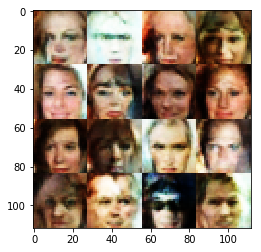

Epoch 1/1... Discriminator Loss: 1.3805... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.2686... Generator Loss: 0.6521
Epoch 1/1... Discriminator Loss: 1.6715... Generator Loss: 0.3722
Epoch 1/1... Discriminator Loss: 1.3168... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.5488
Epoch 1/1... Discriminator Loss: 1.8667... Generator Loss: 0.3512
Epoch 1/1... Discriminator Loss: 1.8594... Generator Loss: 0.3624
Epoch 1/1... Discriminator Loss: 1.2875... Generator Loss: 0.4936
Epoch 1/1... Discriminator Loss: 1.7054... Generator Loss: 0.4660
Epoch 1/1... Discriminator Loss: 1.8469... Generator Loss: 0.5365


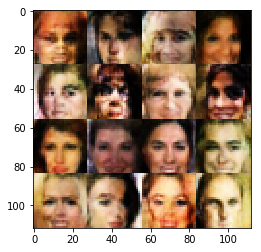

Epoch 1/1... Discriminator Loss: 1.0946... Generator Loss: 0.8857
Epoch 1/1... Discriminator Loss: 1.1065... Generator Loss: 0.8125
Epoch 1/1... Discriminator Loss: 1.0306... Generator Loss: 0.8676
Epoch 1/1... Discriminator Loss: 1.6295... Generator Loss: 0.4966
Epoch 1/1... Discriminator Loss: 1.1029... Generator Loss: 0.6485
Epoch 1/1... Discriminator Loss: 1.4865... Generator Loss: 0.6742
Epoch 1/1... Discriminator Loss: 1.0798... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.4081... Generator Loss: 0.5765
Epoch 1/1... Discriminator Loss: 1.6275... Generator Loss: 0.5097
Epoch 1/1... Discriminator Loss: 1.1876... Generator Loss: 0.6136


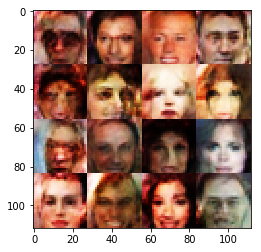

Epoch 1/1... Discriminator Loss: 1.7258... Generator Loss: 0.4288
Epoch 1/1... Discriminator Loss: 1.3259... Generator Loss: 0.5350
Epoch 1/1... Discriminator Loss: 1.8324... Generator Loss: 0.4379
Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 0.5750
Epoch 1/1... Discriminator Loss: 1.3216... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.1503... Generator Loss: 0.6434
Epoch 1/1... Discriminator Loss: 1.5433... Generator Loss: 0.5098
Epoch 1/1... Discriminator Loss: 1.2229... Generator Loss: 0.5483
Epoch 1/1... Discriminator Loss: 2.1882... Generator Loss: 0.2806
Epoch 1/1... Discriminator Loss: 1.0507... Generator Loss: 0.7972


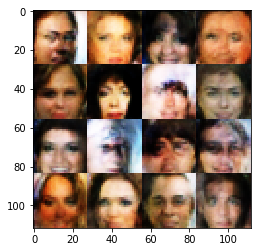

Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 0.6433
Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 1.2521... Generator Loss: 0.5677
Epoch 1/1... Discriminator Loss: 1.1114... Generator Loss: 0.6263
Epoch 1/1... Discriminator Loss: 1.3777... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.1234... Generator Loss: 0.6478
Epoch 1/1... Discriminator Loss: 1.2744... Generator Loss: 0.5624
Epoch 1/1... Discriminator Loss: 0.8468... Generator Loss: 0.8248
Epoch 1/1... Discriminator Loss: 1.3422... Generator Loss: 0.5773
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 0.6992


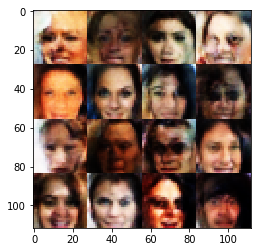

Epoch 1/1... Discriminator Loss: 1.2501... Generator Loss: 0.5186
Epoch 1/1... Discriminator Loss: 1.6947... Generator Loss: 0.4237
Epoch 1/1... Discriminator Loss: 1.1087... Generator Loss: 0.7759
Epoch 1/1... Discriminator Loss: 1.9656... Generator Loss: 0.8296
Epoch 1/1... Discriminator Loss: 0.8790... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.4377... Generator Loss: 0.5550
Epoch 1/1... Discriminator Loss: 1.3440... Generator Loss: 0.5157
Epoch 1/1... Discriminator Loss: 1.6588... Generator Loss: 0.3905
Epoch 1/1... Discriminator Loss: 1.6324... Generator Loss: 0.4915
Epoch 1/1... Discriminator Loss: 1.1519... Generator Loss: 0.6698


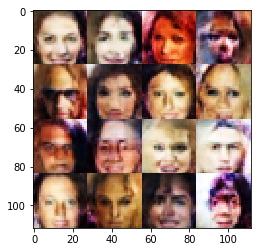

Epoch 1/1... Discriminator Loss: 1.3166... Generator Loss: 0.6187
Epoch 1/1... Discriminator Loss: 1.3081... Generator Loss: 0.7712
Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.8385
Epoch 1/1... Discriminator Loss: 1.5965... Generator Loss: 0.4294
Epoch 1/1... Discriminator Loss: 1.5700... Generator Loss: 0.6330
Epoch 1/1... Discriminator Loss: 1.3389... Generator Loss: 0.5832
Epoch 1/1... Discriminator Loss: 1.0862... Generator Loss: 0.6828
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 0.6579
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.5558
Epoch 1/1... Discriminator Loss: 1.3496... Generator Loss: 0.6660


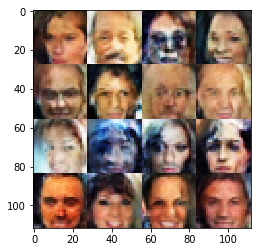

Epoch 1/1... Discriminator Loss: 1.8020... Generator Loss: 0.6064
Epoch 1/1... Discriminator Loss: 1.4188... Generator Loss: 0.5457
Epoch 1/1... Discriminator Loss: 1.2501... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.6005... Generator Loss: 0.4518
Epoch 1/1... Discriminator Loss: 1.0639... Generator Loss: 0.5132
Epoch 1/1... Discriminator Loss: 1.4077... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 0.9585... Generator Loss: 0.8004
Epoch 1/1... Discriminator Loss: 1.4292... Generator Loss: 0.4070
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.6365
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 0.4995


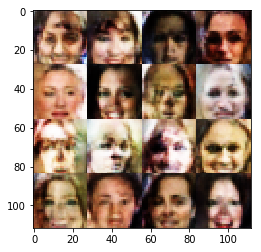

Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 0.5593
Epoch 1/1... Discriminator Loss: 1.5513... Generator Loss: 0.5288
Epoch 1/1... Discriminator Loss: 1.6209... Generator Loss: 0.5361
Epoch 1/1... Discriminator Loss: 1.0788... Generator Loss: 0.6493
Epoch 1/1... Discriminator Loss: 1.0522... Generator Loss: 0.9522
Epoch 1/1... Discriminator Loss: 1.8603... Generator Loss: 0.3246
Epoch 1/1... Discriminator Loss: 1.0816... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 0.8557
Epoch 1/1... Discriminator Loss: 1.2297... Generator Loss: 0.7365
Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.6914


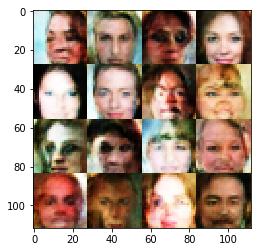

Epoch 1/1... Discriminator Loss: 1.4309... Generator Loss: 0.7739
Epoch 1/1... Discriminator Loss: 1.1415... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 0.7972... Generator Loss: 0.8749
Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.4899
Epoch 1/1... Discriminator Loss: 1.2915... Generator Loss: 0.6257
Epoch 1/1... Discriminator Loss: 1.4089... Generator Loss: 0.5756
Epoch 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.6278
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 0.6540
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 0.4955
Epoch 1/1... Discriminator Loss: 1.1873... Generator Loss: 0.6277


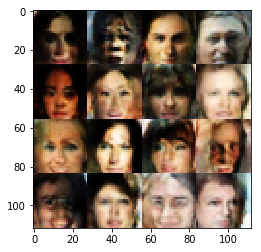

Epoch 1/1... Discriminator Loss: 1.2021... Generator Loss: 0.6049
Epoch 1/1... Discriminator Loss: 1.4799... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.3344... Generator Loss: 0.5602
Epoch 1/1... Discriminator Loss: 1.5807... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.2454... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.5305
Epoch 1/1... Discriminator Loss: 0.7957... Generator Loss: 0.8776
Epoch 1/1... Discriminator Loss: 0.9998... Generator Loss: 0.7995
Epoch 1/1... Discriminator Loss: 1.4523... Generator Loss: 0.5664
Epoch 1/1... Discriminator Loss: 1.5607... Generator Loss: 0.6049


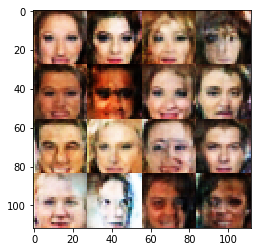

Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 2.1098... Generator Loss: 0.3555
Epoch 1/1... Discriminator Loss: 2.4002... Generator Loss: 0.3096
Epoch 1/1... Discriminator Loss: 1.6274... Generator Loss: 0.4354
Epoch 1/1... Discriminator Loss: 0.8882... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 1.3978... Generator Loss: 0.4628
Epoch 1/1... Discriminator Loss: 1.4677... Generator Loss: 0.6811
Epoch 1/1... Discriminator Loss: 1.2605... Generator Loss: 0.5827
Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 0.8372
Epoch 1/1... Discriminator Loss: 1.5723... Generator Loss: 0.3603


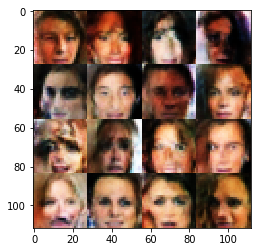

Epoch 1/1... Discriminator Loss: 1.6136... Generator Loss: 0.4438
Epoch 1/1... Discriminator Loss: 1.1723... Generator Loss: 0.7723
Epoch 1/1... Discriminator Loss: 1.7618... Generator Loss: 0.3278
Epoch 1/1... Discriminator Loss: 1.5779... Generator Loss: 0.4345
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.6164
Epoch 1/1... Discriminator Loss: 1.0587... Generator Loss: 0.5658
Epoch 1/1... Discriminator Loss: 1.5209... Generator Loss: 0.4122
Epoch 1/1... Discriminator Loss: 1.2383... Generator Loss: 0.7622
Epoch 1/1... Discriminator Loss: 1.7644... Generator Loss: 0.7927
Epoch 1/1... Discriminator Loss: 1.2695... Generator Loss: 0.5854


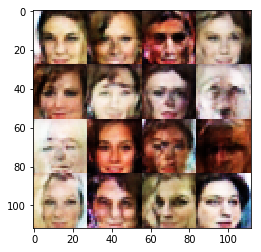

Epoch 1/1... Discriminator Loss: 1.4473... Generator Loss: 0.5256
Epoch 1/1... Discriminator Loss: 1.6322... Generator Loss: 0.5756
Epoch 1/1... Discriminator Loss: 1.0607... Generator Loss: 0.8030
Epoch 1/1... Discriminator Loss: 1.5197... Generator Loss: 0.5570
Epoch 1/1... Discriminator Loss: 1.4760... Generator Loss: 0.3963
Epoch 1/1... Discriminator Loss: 1.9330... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.8583
Epoch 1/1... Discriminator Loss: 1.5961... Generator Loss: 0.4418
Epoch 1/1... Discriminator Loss: 1.4420... Generator Loss: 0.4516
Epoch 1/1... Discriminator Loss: 1.3320... Generator Loss: 0.5353


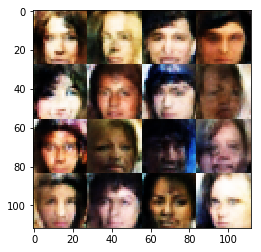

Epoch 1/1... Discriminator Loss: 1.5333... Generator Loss: 0.5689
Epoch 1/1... Discriminator Loss: 1.8003... Generator Loss: 0.5682
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.7001
Epoch 1/1... Discriminator Loss: 1.3726... Generator Loss: 0.6379
Epoch 1/1... Discriminator Loss: 1.6470... Generator Loss: 0.4462
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.5018
Epoch 1/1... Discriminator Loss: 0.9490... Generator Loss: 0.6065
Epoch 1/1... Discriminator Loss: 1.4594... Generator Loss: 0.6320
Epoch 1/1... Discriminator Loss: 1.5999... Generator Loss: 0.4383
Epoch 1/1... Discriminator Loss: 1.3559... Generator Loss: 0.6270


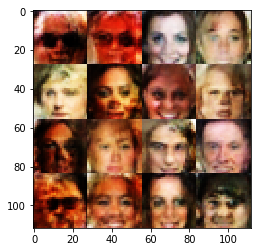

Epoch 1/1... Discriminator Loss: 1.0867... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.2322... Generator Loss: 0.6795
Epoch 1/1... Discriminator Loss: 1.1206... Generator Loss: 0.6036
Epoch 1/1... Discriminator Loss: 1.5372... Generator Loss: 0.4311
Epoch 1/1... Discriminator Loss: 1.1982... Generator Loss: 0.7722
Epoch 1/1... Discriminator Loss: 2.3723... Generator Loss: 0.2073
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.4865
Epoch 1/1... Discriminator Loss: 1.5981... Generator Loss: 0.4521
Epoch 1/1... Discriminator Loss: 0.8674... Generator Loss: 0.8282
Epoch 1/1... Discriminator Loss: 0.6837... Generator Loss: 0.8806


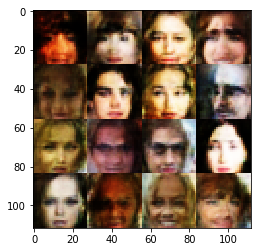

Epoch 1/1... Discriminator Loss: 1.8040... Generator Loss: 0.4882
Epoch 1/1... Discriminator Loss: 1.6247... Generator Loss: 0.4510
Epoch 1/1... Discriminator Loss: 1.6023... Generator Loss: 0.3649
Epoch 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.4482
Epoch 1/1... Discriminator Loss: 1.6785... Generator Loss: 0.4738
Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.4193
Epoch 1/1... Discriminator Loss: 1.4477... Generator Loss: 0.6245
Epoch 1/1... Discriminator Loss: 1.1793... Generator Loss: 0.7162
Epoch 1/1... Discriminator Loss: 1.5610... Generator Loss: 0.5618
Epoch 1/1... Discriminator Loss: 1.1610... Generator Loss: 0.5818


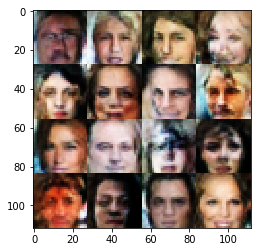

Epoch 1/1... Discriminator Loss: 1.3354... Generator Loss: 0.6151
Epoch 1/1... Discriminator Loss: 1.0875... Generator Loss: 0.5526
Epoch 1/1... Discriminator Loss: 1.1456... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.0713... Generator Loss: 0.6779
Epoch 1/1... Discriminator Loss: 1.7593... Generator Loss: 0.3212
Epoch 1/1... Discriminator Loss: 1.2276... Generator Loss: 0.7975
Epoch 1/1... Discriminator Loss: 1.0592... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 0.7327... Generator Loss: 0.8128
Epoch 1/1... Discriminator Loss: 1.2452... Generator Loss: 0.5562
Epoch 1/1... Discriminator Loss: 0.9896... Generator Loss: 0.7621


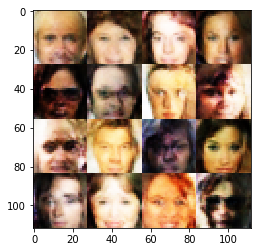

Epoch 1/1... Discriminator Loss: 1.6737... Generator Loss: 0.5470
Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 0.6787
Epoch 1/1... Discriminator Loss: 1.1908... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.0767... Generator Loss: 0.7120
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.6553
Epoch 1/1... Discriminator Loss: 1.6509... Generator Loss: 0.4792
Epoch 1/1... Discriminator Loss: 1.7734... Generator Loss: 0.5189
Epoch 1/1... Discriminator Loss: 1.9481... Generator Loss: 0.5824
Epoch 1/1... Discriminator Loss: 1.2976... Generator Loss: 0.6251
Epoch 1/1... Discriminator Loss: 2.0113... Generator Loss: 0.4603


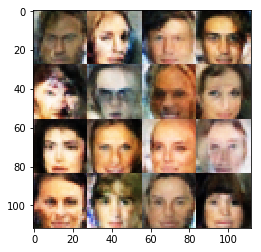

Epoch 1/1... Discriminator Loss: 1.3504... Generator Loss: 0.8989
Epoch 1/1... Discriminator Loss: 1.7036... Generator Loss: 0.5187
Epoch 1/1... Discriminator Loss: 1.3106... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 1.4624... Generator Loss: 0.6558
Epoch 1/1... Discriminator Loss: 1.6501... Generator Loss: 0.3578
Epoch 1/1... Discriminator Loss: 1.1990... Generator Loss: 0.6913
Epoch 1/1... Discriminator Loss: 1.2458... Generator Loss: 0.5431
Epoch 1/1... Discriminator Loss: 1.9811... Generator Loss: 0.4843
Epoch 1/1... Discriminator Loss: 1.0421... Generator Loss: 0.5962
Epoch 1/1... Discriminator Loss: 1.1425... Generator Loss: 0.6217


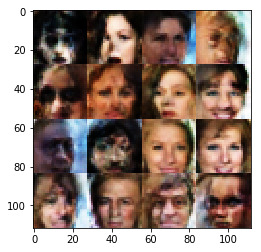

Epoch 1/1... Discriminator Loss: 1.7884... Generator Loss: 0.3302
Epoch 1/1... Discriminator Loss: 1.6903... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.2984... Generator Loss: 0.8436
Epoch 1/1... Discriminator Loss: 0.9226... Generator Loss: 1.0605
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 1.5142... Generator Loss: 0.5353
Epoch 1/1... Discriminator Loss: 2.0250... Generator Loss: 0.3633
Epoch 1/1... Discriminator Loss: 1.0760... Generator Loss: 0.6303
Epoch 1/1... Discriminator Loss: 1.3124... Generator Loss: 0.7217


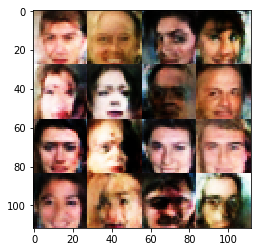

Epoch 1/1... Discriminator Loss: 1.5034... Generator Loss: 0.5567
Epoch 1/1... Discriminator Loss: 1.7799... Generator Loss: 0.3772
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.7117
Epoch 1/1... Discriminator Loss: 0.9819... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.4516... Generator Loss: 0.5806
Epoch 1/1... Discriminator Loss: 1.0914... Generator Loss: 0.7747
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.5662
Epoch 1/1... Discriminator Loss: 1.2395... Generator Loss: 0.6018
Epoch 1/1... Discriminator Loss: 1.5444... Generator Loss: 0.5188
Epoch 1/1... Discriminator Loss: 1.6487... Generator Loss: 0.5248


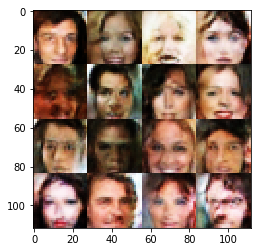

Epoch 1/1... Discriminator Loss: 1.3109... Generator Loss: 0.4507
Epoch 1/1... Discriminator Loss: 1.6267... Generator Loss: 0.6082
Epoch 1/1... Discriminator Loss: 0.9490... Generator Loss: 0.8409
Epoch 1/1... Discriminator Loss: 2.1193... Generator Loss: 0.2902
Epoch 1/1... Discriminator Loss: 1.5336... Generator Loss: 0.9319
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.4997
Epoch 1/1... Discriminator Loss: 1.7496... Generator Loss: 0.4486
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 0.6366
Epoch 1/1... Discriminator Loss: 1.7170... Generator Loss: 0.6660
Epoch 1/1... Discriminator Loss: 1.9148... Generator Loss: 0.5350


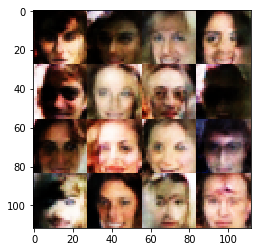

Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.6551
Epoch 1/1... Discriminator Loss: 1.5421... Generator Loss: 0.5649
Epoch 1/1... Discriminator Loss: 1.5097... Generator Loss: 0.5883
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.8066
Epoch 1/1... Discriminator Loss: 1.8107... Generator Loss: 0.3759
Epoch 1/1... Discriminator Loss: 0.9982... Generator Loss: 0.9654
Epoch 1/1... Discriminator Loss: 1.0089... Generator Loss: 0.7705
Epoch 1/1... Discriminator Loss: 1.4048... Generator Loss: 0.4968
Epoch 1/1... Discriminator Loss: 1.7415... Generator Loss: 0.3903
Epoch 1/1... Discriminator Loss: 0.7499... Generator Loss: 1.1802


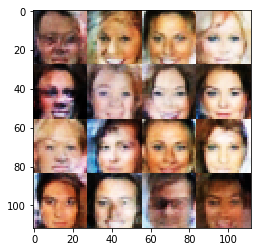

Epoch 1/1... Discriminator Loss: 1.7386... Generator Loss: 0.4038
Epoch 1/1... Discriminator Loss: 1.9003... Generator Loss: 0.2815
Epoch 1/1... Discriminator Loss: 1.3453... Generator Loss: 0.5436
Epoch 1/1... Discriminator Loss: 1.5432... Generator Loss: 0.5457
Epoch 1/1... Discriminator Loss: 1.4281... Generator Loss: 0.6304
Epoch 1/1... Discriminator Loss: 0.9391... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 0.9540... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 2.0548... Generator Loss: 0.3441
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.7212


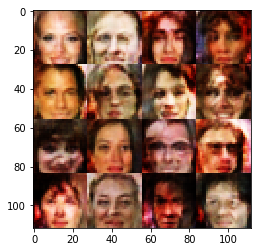

Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.7688
Epoch 1/1... Discriminator Loss: 1.4550... Generator Loss: 0.6566
Epoch 1/1... Discriminator Loss: 0.4935... Generator Loss: 1.0433
Epoch 1/1... Discriminator Loss: 1.5510... Generator Loss: 0.4021
Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.6710
Epoch 1/1... Discriminator Loss: 1.6638... Generator Loss: 0.4159
Epoch 1/1... Discriminator Loss: 1.1770... Generator Loss: 0.6576
Epoch 1/1... Discriminator Loss: 1.2629... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.6052... Generator Loss: 0.4086
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.4770


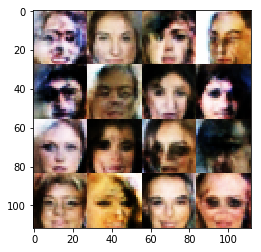

Epoch 1/1... Discriminator Loss: 1.4282... Generator Loss: 0.8536
Epoch 1/1... Discriminator Loss: 1.1187... Generator Loss: 0.7439
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 0.4532
Epoch 1/1... Discriminator Loss: 1.4397... Generator Loss: 0.4469
Epoch 1/1... Discriminator Loss: 1.6832... Generator Loss: 0.3397
Epoch 1/1... Discriminator Loss: 1.5398... Generator Loss: 0.5683
Epoch 1/1... Discriminator Loss: 1.9212... Generator Loss: 0.3756
Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 1.1221... Generator Loss: 0.7387
Epoch 1/1... Discriminator Loss: 1.2749... Generator Loss: 0.7013


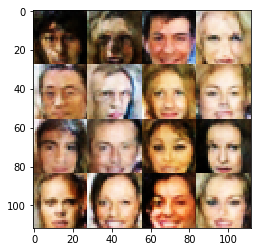

Epoch 1/1... Discriminator Loss: 3.0859... Generator Loss: 0.0983
Epoch 1/1... Discriminator Loss: 1.4753... Generator Loss: 0.4307
Epoch 1/1... Discriminator Loss: 1.8395... Generator Loss: 0.3578
Epoch 1/1... Discriminator Loss: 1.1900... Generator Loss: 0.6972
Epoch 1/1... Discriminator Loss: 0.9087... Generator Loss: 0.7525
Epoch 1/1... Discriminator Loss: 1.9180... Generator Loss: 0.5547
Epoch 1/1... Discriminator Loss: 1.7061... Generator Loss: 0.6014
Epoch 1/1... Discriminator Loss: 1.4387... Generator Loss: 0.6362
Epoch 1/1... Discriminator Loss: 0.9483... Generator Loss: 0.8246
Epoch 1/1... Discriminator Loss: 1.2964... Generator Loss: 0.5977


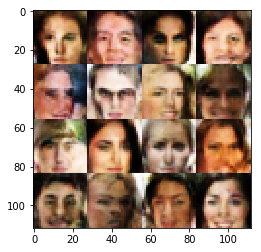

Epoch 1/1... Discriminator Loss: 1.3327... Generator Loss: 0.4931
Epoch 1/1... Discriminator Loss: 1.5462... Generator Loss: 0.5267
Epoch 1/1... Discriminator Loss: 0.9727... Generator Loss: 0.8425
Epoch 1/1... Discriminator Loss: 1.5303... Generator Loss: 0.5014
Epoch 1/1... Discriminator Loss: 1.6168... Generator Loss: 0.3530
Epoch 1/1... Discriminator Loss: 0.8409... Generator Loss: 0.8543
Epoch 1/1... Discriminator Loss: 1.9773... Generator Loss: 0.4089
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.5885
Epoch 1/1... Discriminator Loss: 1.0989... Generator Loss: 0.7766
Epoch 1/1... Discriminator Loss: 1.6945... Generator Loss: 0.7522


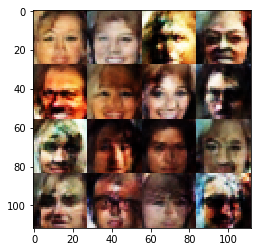

Epoch 1/1... Discriminator Loss: 0.9736... Generator Loss: 0.6462
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.5971... Generator Loss: 0.4803
Epoch 1/1... Discriminator Loss: 1.7175... Generator Loss: 0.5870
Epoch 1/1... Discriminator Loss: 1.5612... Generator Loss: 0.5587
Epoch 1/1... Discriminator Loss: 1.9118... Generator Loss: 0.4187
Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.6558
Epoch 1/1... Discriminator Loss: 1.2905... Generator Loss: 0.5485
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.7337
Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 0.5498


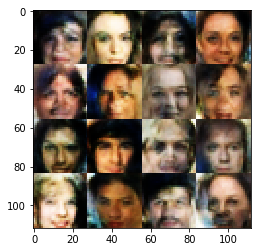

Epoch 1/1... Discriminator Loss: 1.2648... Generator Loss: 0.7920
Epoch 1/1... Discriminator Loss: 1.5842... Generator Loss: 0.6336
Epoch 1/1... Discriminator Loss: 1.3132... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.5952
Epoch 1/1... Discriminator Loss: 1.2271... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.4438... Generator Loss: 0.5715
Epoch 1/1... Discriminator Loss: 1.4629... Generator Loss: 0.6077
Epoch 1/1... Discriminator Loss: 1.4642... Generator Loss: 0.5706
Epoch 1/1... Discriminator Loss: 1.2053... Generator Loss: 0.7066
Epoch 1/1... Discriminator Loss: 1.4729... Generator Loss: 0.5018


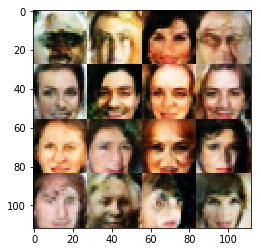

Epoch 1/1... Discriminator Loss: 1.3577... Generator Loss: 0.6242
Epoch 1/1... Discriminator Loss: 1.6746... Generator Loss: 0.4624
Epoch 1/1... Discriminator Loss: 1.4070... Generator Loss: 0.5767
Epoch 1/1... Discriminator Loss: 1.4045... Generator Loss: 0.5072
Epoch 1/1... Discriminator Loss: 1.2095... Generator Loss: 0.6867
Epoch 1/1... Discriminator Loss: 1.4889... Generator Loss: 0.5222
Epoch 1/1... Discriminator Loss: 1.1227... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.2934... Generator Loss: 0.5588
Epoch 1/1... Discriminator Loss: 1.0695... Generator Loss: 0.5569
Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.5967


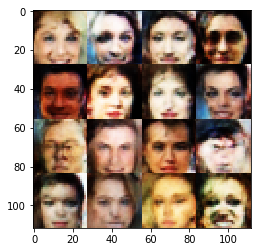

Epoch 1/1... Discriminator Loss: 1.4924... Generator Loss: 0.5106
Epoch 1/1... Discriminator Loss: 1.2155... Generator Loss: 0.7765
Epoch 1/1... Discriminator Loss: 1.3561... Generator Loss: 0.5513
Epoch 1/1... Discriminator Loss: 1.7011... Generator Loss: 0.3205
Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.7515
Epoch 1/1... Discriminator Loss: 1.1546... Generator Loss: 0.7818
Epoch 1/1... Discriminator Loss: 1.0828... Generator Loss: 0.9202
Epoch 1/1... Discriminator Loss: 1.4639... Generator Loss: 0.6349
Epoch 1/1... Discriminator Loss: 1.8942... Generator Loss: 0.4612
Epoch 1/1... Discriminator Loss: 1.8794... Generator Loss: 0.4796


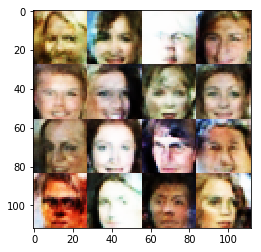

Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 0.5793
Epoch 1/1... Discriminator Loss: 1.2520... Generator Loss: 0.6692
Epoch 1/1... Discriminator Loss: 1.5081... Generator Loss: 0.5254
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.4591
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 0.5413
Epoch 1/1... Discriminator Loss: 1.4797... Generator Loss: 0.4480
Epoch 1/1... Discriminator Loss: 1.0652... Generator Loss: 0.6054
Epoch 1/1... Discriminator Loss: 1.5849... Generator Loss: 0.6089
Epoch 1/1... Discriminator Loss: 1.7151... Generator Loss: 0.5104
Epoch 1/1... Discriminator Loss: 1.0380... Generator Loss: 0.7078


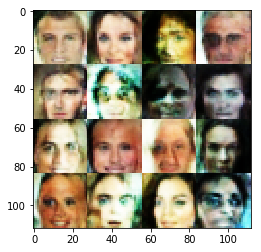

Epoch 1/1... Discriminator Loss: 1.7506... Generator Loss: 0.6080
Epoch 1/1... Discriminator Loss: 1.6198... Generator Loss: 0.5613
Epoch 1/1... Discriminator Loss: 1.1318... Generator Loss: 0.6116
Epoch 1/1... Discriminator Loss: 2.0351... Generator Loss: 0.3943
Epoch 1/1... Discriminator Loss: 1.2719... Generator Loss: 0.4269
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.5946
Epoch 1/1... Discriminator Loss: 1.0090... Generator Loss: 0.6390
Epoch 1/1... Discriminator Loss: 1.1473... Generator Loss: 0.6343
Epoch 1/1... Discriminator Loss: 1.5151... Generator Loss: 0.5544
Epoch 1/1... Discriminator Loss: 1.1163... Generator Loss: 0.6731


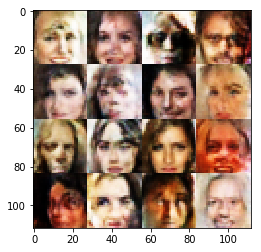

Epoch 1/1... Discriminator Loss: 1.3982... Generator Loss: 0.6318
Epoch 1/1... Discriminator Loss: 1.9643... Generator Loss: 0.5187
Epoch 1/1... Discriminator Loss: 0.9516... Generator Loss: 0.9186
Epoch 1/1... Discriminator Loss: 1.5999... Generator Loss: 0.4198
Epoch 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.6869
Epoch 1/1... Discriminator Loss: 0.9320... Generator Loss: 0.8487
Epoch 1/1... Discriminator Loss: 1.7538... Generator Loss: 0.4140
Epoch 1/1... Discriminator Loss: 1.0123... Generator Loss: 0.7772
Epoch 1/1... Discriminator Loss: 0.7065... Generator Loss: 1.0410
Epoch 1/1... Discriminator Loss: 1.9083... Generator Loss: 0.3484


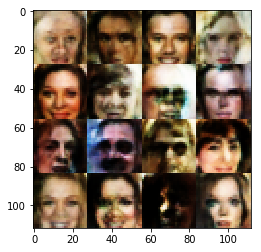

Epoch 1/1... Discriminator Loss: 1.9811... Generator Loss: 0.4737
Epoch 1/1... Discriminator Loss: 1.5817... Generator Loss: 0.6722
Epoch 1/1... Discriminator Loss: 1.1083... Generator Loss: 0.7036
Epoch 1/1... Discriminator Loss: 1.6694... Generator Loss: 0.4858
Epoch 1/1... Discriminator Loss: 1.4086... Generator Loss: 0.7472
Epoch 1/1... Discriminator Loss: 1.0827... Generator Loss: 0.6913
Epoch 1/1... Discriminator Loss: 1.5799... Generator Loss: 0.4218
Epoch 1/1... Discriminator Loss: 1.6994... Generator Loss: 0.3953
Epoch 1/1... Discriminator Loss: 2.1208... Generator Loss: 0.3801
Epoch 1/1... Discriminator Loss: 1.9359... Generator Loss: 0.3807


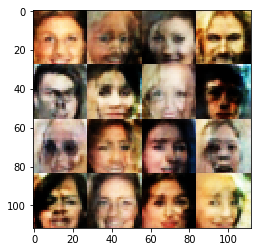

Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.5645
Epoch 1/1... Discriminator Loss: 1.4652... Generator Loss: 0.5800
Epoch 1/1... Discriminator Loss: 1.1388... Generator Loss: 0.6734
Epoch 1/1... Discriminator Loss: 1.8368... Generator Loss: 0.4779
Epoch 1/1... Discriminator Loss: 1.7785... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 1.5474... Generator Loss: 0.4941
Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 0.5467
Epoch 1/1... Discriminator Loss: 1.0863... Generator Loss: 0.5863
Epoch 1/1... Discriminator Loss: 1.2357... Generator Loss: 0.6542
Epoch 1/1... Discriminator Loss: 1.7349... Generator Loss: 0.5284


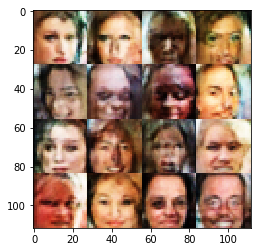

Epoch 1/1... Discriminator Loss: 1.1525... Generator Loss: 0.7972
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 1.6326... Generator Loss: 0.4953
Epoch 1/1... Discriminator Loss: 1.2666... Generator Loss: 0.5824
Epoch 1/1... Discriminator Loss: 1.0138... Generator Loss: 0.7457
Epoch 1/1... Discriminator Loss: 1.3429... Generator Loss: 0.6311
Epoch 1/1... Discriminator Loss: 0.8561... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.4998... Generator Loss: 0.7755
Epoch 1/1... Discriminator Loss: 1.6048... Generator Loss: 0.5060
Epoch 1/1... Discriminator Loss: 1.1310... Generator Loss: 0.7400


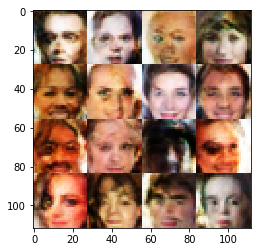

Epoch 1/1... Discriminator Loss: 1.2188... Generator Loss: 0.7217
Epoch 1/1... Discriminator Loss: 1.1199... Generator Loss: 0.6051
Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 0.7927
Epoch 1/1... Discriminator Loss: 1.0883... Generator Loss: 0.5707
Epoch 1/1... Discriminator Loss: 1.4503... Generator Loss: 0.5301
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.2427... Generator Loss: 0.7167
Epoch 1/1... Discriminator Loss: 1.2585... Generator Loss: 0.6864
Epoch 1/1... Discriminator Loss: 1.3453... Generator Loss: 0.5312
Epoch 1/1... Discriminator Loss: 1.3010... Generator Loss: 0.5377


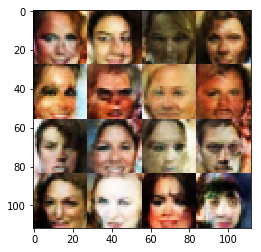

Epoch 1/1... Discriminator Loss: 1.2119... Generator Loss: 0.5982
Epoch 1/1... Discriminator Loss: 1.0114... Generator Loss: 0.9455
Epoch 1/1... Discriminator Loss: 0.9655... Generator Loss: 0.7077
Epoch 1/1... Discriminator Loss: 1.6949... Generator Loss: 0.4205
Epoch 1/1... Discriminator Loss: 1.5386... Generator Loss: 0.4730
Epoch 1/1... Discriminator Loss: 1.9464... Generator Loss: 0.3838
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.6394
Epoch 1/1... Discriminator Loss: 0.8893... Generator Loss: 1.3592
Epoch 1/1... Discriminator Loss: 1.0810... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.4252... Generator Loss: 0.5674


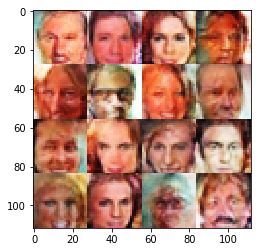

Epoch 1/1... Discriminator Loss: 1.4696... Generator Loss: 0.6430
Epoch 1/1... Discriminator Loss: 1.7545... Generator Loss: 0.6487
Epoch 1/1... Discriminator Loss: 1.1603... Generator Loss: 0.6381
Epoch 1/1... Discriminator Loss: 1.2842... Generator Loss: 0.6304
Epoch 1/1... Discriminator Loss: 1.3038... Generator Loss: 0.6033
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.6360
Epoch 1/1... Discriminator Loss: 1.1980... Generator Loss: 0.6521
Epoch 1/1... Discriminator Loss: 1.2573... Generator Loss: 0.6729
Epoch 1/1... Discriminator Loss: 1.0572... Generator Loss: 0.8584
Epoch 1/1... Discriminator Loss: 1.7188... Generator Loss: 0.4636


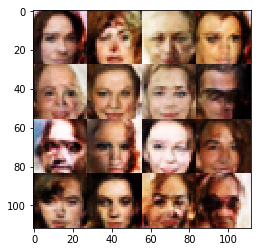

Epoch 1/1... Discriminator Loss: 0.8549... Generator Loss: 0.6365
Epoch 1/1... Discriminator Loss: 0.9763... Generator Loss: 0.6695
Epoch 1/1... Discriminator Loss: 0.9871... Generator Loss: 0.8867
Epoch 1/1... Discriminator Loss: 1.8965... Generator Loss: 0.4448
Epoch 1/1... Discriminator Loss: 1.3021... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.6405
Epoch 1/1... Discriminator Loss: 1.5486... Generator Loss: 0.6849
Epoch 1/1... Discriminator Loss: 2.0407... Generator Loss: 0.6107
Epoch 1/1... Discriminator Loss: 1.3503... Generator Loss: 0.6183
Epoch 1/1... Discriminator Loss: 1.4815... Generator Loss: 0.6699


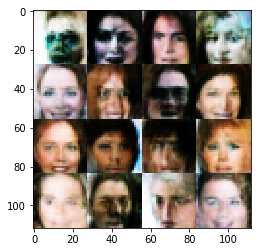

Epoch 1/1... Discriminator Loss: 0.9198... Generator Loss: 0.8892
Epoch 1/1... Discriminator Loss: 1.8082... Generator Loss: 0.4377
Epoch 1/1... Discriminator Loss: 1.1595... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.6059
Epoch 1/1... Discriminator Loss: 1.1695... Generator Loss: 0.5594
Epoch 1/1... Discriminator Loss: 1.6294... Generator Loss: 0.5762
Epoch 1/1... Discriminator Loss: 1.7700... Generator Loss: 0.5473
Epoch 1/1... Discriminator Loss: 1.2270... Generator Loss: 0.6973
Epoch 1/1... Discriminator Loss: 2.0782... Generator Loss: 0.3833
Epoch 1/1... Discriminator Loss: 1.2521... Generator Loss: 0.7048


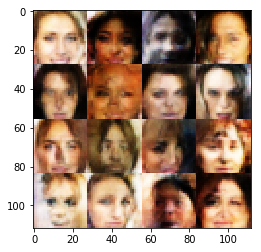

Epoch 1/1... Discriminator Loss: 1.4754... Generator Loss: 0.5038
Epoch 1/1... Discriminator Loss: 1.2323... Generator Loss: 0.5886
Epoch 1/1... Discriminator Loss: 1.5172... Generator Loss: 0.4806
Epoch 1/1... Discriminator Loss: 1.6884... Generator Loss: 0.4878
Epoch 1/1... Discriminator Loss: 1.2438... Generator Loss: 0.5774
Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.6112
Epoch 1/1... Discriminator Loss: 1.6042... Generator Loss: 0.4264
Epoch 1/1... Discriminator Loss: 1.6680... Generator Loss: 0.6636
Epoch 1/1... Discriminator Loss: 1.2861... Generator Loss: 0.6450
Epoch 1/1... Discriminator Loss: 1.2395... Generator Loss: 0.6319


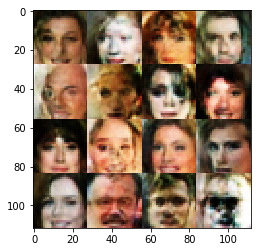

Epoch 1/1... Discriminator Loss: 1.7355... Generator Loss: 0.3715
Epoch 1/1... Discriminator Loss: 1.1092... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.5759... Generator Loss: 0.3466
Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.7181
Epoch 1/1... Discriminator Loss: 1.4297... Generator Loss: 0.5045
Epoch 1/1... Discriminator Loss: 1.6798... Generator Loss: 0.6193
Epoch 1/1... Discriminator Loss: 1.0487... Generator Loss: 0.8188
Epoch 1/1... Discriminator Loss: 1.2363... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 1.3187... Generator Loss: 0.5182
Epoch 1/1... Discriminator Loss: 1.1543... Generator Loss: 0.6060


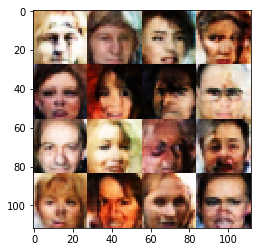

Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.5379
Epoch 1/1... Discriminator Loss: 1.0057... Generator Loss: 0.8818
Epoch 1/1... Discriminator Loss: 1.5688... Generator Loss: 0.4949
Epoch 1/1... Discriminator Loss: 0.9933... Generator Loss: 1.0297
Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.5431
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6150
Epoch 1/1... Discriminator Loss: 1.2703... Generator Loss: 0.6696
Epoch 1/1... Discriminator Loss: 1.4167... Generator Loss: 0.5875
Epoch 1/1... Discriminator Loss: 1.6973... Generator Loss: 0.5016
Epoch 1/1... Discriminator Loss: 1.2409... Generator Loss: 0.7670


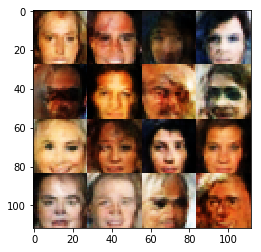

Epoch 1/1... Discriminator Loss: 1.7220... Generator Loss: 0.4701
Epoch 1/1... Discriminator Loss: 1.1603... Generator Loss: 0.7423
Epoch 1/1... Discriminator Loss: 1.4407... Generator Loss: 0.5065
Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.6097
Epoch 1/1... Discriminator Loss: 1.2161... Generator Loss: 0.6115
Epoch 1/1... Discriminator Loss: 1.5889... Generator Loss: 0.5547
Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 0.5532
Epoch 1/1... Discriminator Loss: 1.2993... Generator Loss: 0.7771
Epoch 1/1... Discriminator Loss: 1.2858... Generator Loss: 0.6100
Epoch 1/1... Discriminator Loss: 1.6541... Generator Loss: 0.5299


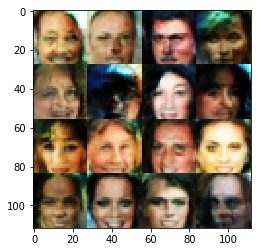

Epoch 1/1... Discriminator Loss: 1.4945... Generator Loss: 0.5132
Epoch 1/1... Discriminator Loss: 1.1499... Generator Loss: 0.5808
Epoch 1/1... Discriminator Loss: 2.2115... Generator Loss: 0.3197
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.5146
Epoch 1/1... Discriminator Loss: 1.5212... Generator Loss: 0.6605
Epoch 1/1... Discriminator Loss: 1.6838... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 1.3108... Generator Loss: 0.5154
Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.8553... Generator Loss: 0.4246
Epoch 1/1... Discriminator Loss: 1.5533... Generator Loss: 0.5470


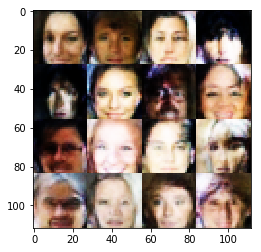

Epoch 1/1... Discriminator Loss: 1.3625... Generator Loss: 0.5817
Epoch 1/1... Discriminator Loss: 1.1395... Generator Loss: 0.6833
Epoch 1/1... Discriminator Loss: 1.3336... Generator Loss: 0.6560
Epoch 1/1... Discriminator Loss: 1.6638... Generator Loss: 0.5374
Epoch 1/1... Discriminator Loss: 1.6762... Generator Loss: 0.5082
Epoch 1/1... Discriminator Loss: 0.8000... Generator Loss: 0.8044
Epoch 1/1... Discriminator Loss: 1.7467... Generator Loss: 0.4583
Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.5662
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.9031
Epoch 1/1... Discriminator Loss: 0.8089... Generator Loss: 0.9353


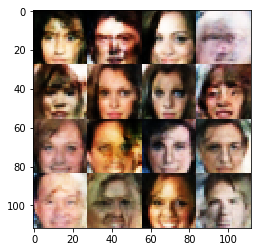

Epoch 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.6421
Epoch 1/1... Discriminator Loss: 1.4776... Generator Loss: 0.4684
Epoch 1/1... Discriminator Loss: 2.0229... Generator Loss: 0.3648
Epoch 1/1... Discriminator Loss: 1.2298... Generator Loss: 0.4890
Epoch 1/1... Discriminator Loss: 1.6674... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.3003... Generator Loss: 0.5308
Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.8544
Epoch 1/1... Discriminator Loss: 1.7274... Generator Loss: 0.4008
Epoch 1/1... Discriminator Loss: 0.8489... Generator Loss: 1.0530
Epoch 1/1... Discriminator Loss: 0.7868... Generator Loss: 0.8682


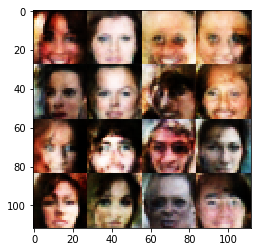

Epoch 1/1... Discriminator Loss: 1.6509... Generator Loss: 0.4734
Epoch 1/1... Discriminator Loss: 1.3165... Generator Loss: 0.6514
Epoch 1/1... Discriminator Loss: 1.4776... Generator Loss: 0.4308
Epoch 1/1... Discriminator Loss: 1.2218... Generator Loss: 0.6297
Epoch 1/1... Discriminator Loss: 1.4730... Generator Loss: 0.6068
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.6475
Epoch 1/1... Discriminator Loss: 0.8774... Generator Loss: 0.7231
Epoch 1/1... Discriminator Loss: 1.5124... Generator Loss: 0.5138
Epoch 1/1... Discriminator Loss: 1.5710... Generator Loss: 0.5069
Epoch 1/1... Discriminator Loss: 1.3054... Generator Loss: 0.6111


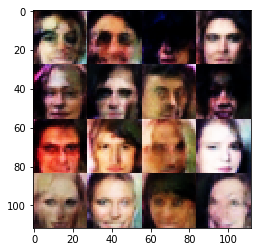

Epoch 1/1... Discriminator Loss: 1.1039... Generator Loss: 0.6166
Epoch 1/1... Discriminator Loss: 1.5087... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 0.9231... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 1.2307... Generator Loss: 0.6222
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.4813
Epoch 1/1... Discriminator Loss: 1.5953... Generator Loss: 0.5048
Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.4503
Epoch 1/1... Discriminator Loss: 1.2256... Generator Loss: 0.4927
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 0.7273
Epoch 1/1... Discriminator Loss: 1.0185... Generator Loss: 0.8120


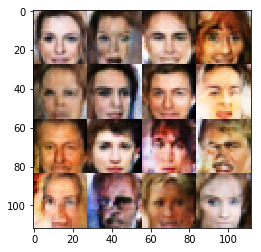

Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.5732
Epoch 1/1... Discriminator Loss: 1.5932... Generator Loss: 0.5645
Epoch 1/1... Discriminator Loss: 2.3357... Generator Loss: 0.3356
Epoch 1/1... Discriminator Loss: 0.9281... Generator Loss: 0.8396
Epoch 1/1... Discriminator Loss: 1.0147... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.5090... Generator Loss: 0.4222
Epoch 1/1... Discriminator Loss: 1.2062... Generator Loss: 0.5693
Epoch 1/1... Discriminator Loss: 1.9895... Generator Loss: 0.5634
Epoch 1/1... Discriminator Loss: 1.7421... Generator Loss: 0.5685
Epoch 1/1... Discriminator Loss: 1.6487... Generator Loss: 0.4513


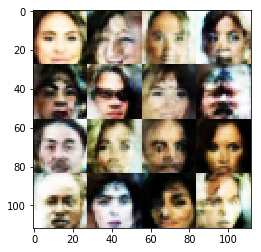

Epoch 1/1... Discriminator Loss: 1.2380... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 0.9969... Generator Loss: 0.6805
Epoch 1/1... Discriminator Loss: 1.4813... Generator Loss: 0.5880
Epoch 1/1... Discriminator Loss: 1.0522... Generator Loss: 0.7936
Epoch 1/1... Discriminator Loss: 1.1956... Generator Loss: 0.5891
Epoch 1/1... Discriminator Loss: 2.0799... Generator Loss: 0.3430
Epoch 1/1... Discriminator Loss: 1.7638... Generator Loss: 0.4437
Epoch 1/1... Discriminator Loss: 1.0544... Generator Loss: 0.6888
Epoch 1/1... Discriminator Loss: 1.4962... Generator Loss: 0.5783
Epoch 1/1... Discriminator Loss: 1.6298... Generator Loss: 0.3568


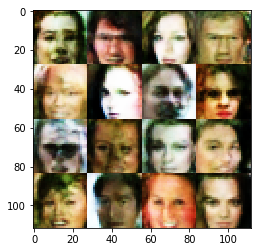

Epoch 1/1... Discriminator Loss: 1.1949... Generator Loss: 0.6969
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.5401
Epoch 1/1... Discriminator Loss: 1.7740... Generator Loss: 0.4015
Epoch 1/1... Discriminator Loss: 1.2344... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.1826... Generator Loss: 0.5950
Epoch 1/1... Discriminator Loss: 1.3279... Generator Loss: 0.5187
Epoch 1/1... Discriminator Loss: 1.0713... Generator Loss: 0.9398
Epoch 1/1... Discriminator Loss: 1.9140... Generator Loss: 0.5313
Epoch 1/1... Discriminator Loss: 1.1259... Generator Loss: 0.5789
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.5776


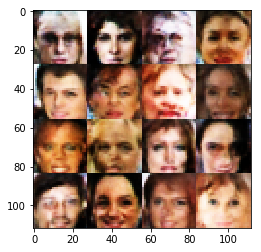

Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.6779
Epoch 1/1... Discriminator Loss: 1.1726... Generator Loss: 0.6328
Epoch 1/1... Discriminator Loss: 1.6126... Generator Loss: 0.5090
Epoch 1/1... Discriminator Loss: 1.5366... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.3124... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.4723... Generator Loss: 0.5673
Epoch 1/1... Discriminator Loss: 1.7118... Generator Loss: 0.4319
Epoch 1/1... Discriminator Loss: 1.2263... Generator Loss: 0.4504
Epoch 1/1... Discriminator Loss: 1.7280... Generator Loss: 0.6076
Epoch 1/1... Discriminator Loss: 1.7134... Generator Loss: 0.3844


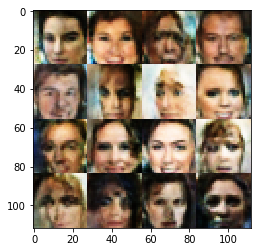

Epoch 1/1... Discriminator Loss: 1.1704... Generator Loss: 0.6380
Epoch 1/1... Discriminator Loss: 1.2060... Generator Loss: 0.6122
Epoch 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.5864
Epoch 1/1... Discriminator Loss: 1.1994... Generator Loss: 0.5274
Epoch 1/1... Discriminator Loss: 1.8738... Generator Loss: 0.3644
Epoch 1/1... Discriminator Loss: 1.1776... Generator Loss: 0.6223
Epoch 1/1... Discriminator Loss: 0.8477... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 1.2842... Generator Loss: 0.5563
Epoch 1/1... Discriminator Loss: 1.6878... Generator Loss: 0.4106
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.5585


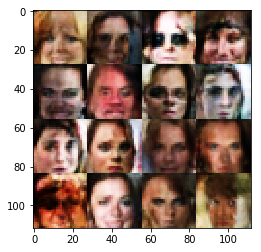

Epoch 1/1... Discriminator Loss: 1.4481... Generator Loss: 0.6067
Epoch 1/1... Discriminator Loss: 1.3984... Generator Loss: 0.6442
Epoch 1/1... Discriminator Loss: 1.8599... Generator Loss: 0.3116
Epoch 1/1... Discriminator Loss: 1.8400... Generator Loss: 0.3305
Epoch 1/1... Discriminator Loss: 1.6789... Generator Loss: 0.5425
Epoch 1/1... Discriminator Loss: 1.4631... Generator Loss: 0.4324
Epoch 1/1... Discriminator Loss: 1.1498... Generator Loss: 0.6752
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.4289
Epoch 1/1... Discriminator Loss: 1.2357... Generator Loss: 0.6158
Epoch 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.5333


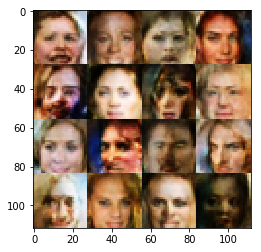

Epoch 1/1... Discriminator Loss: 1.4928... Generator Loss: 0.4350
Epoch 1/1... Discriminator Loss: 1.6075... Generator Loss: 0.4545
Epoch 1/1... Discriminator Loss: 1.7411... Generator Loss: 0.6054
Epoch 1/1... Discriminator Loss: 1.1838... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.5340... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 1.4807... Generator Loss: 0.5500
Epoch 1/1... Discriminator Loss: 1.8412... Generator Loss: 0.5735
Epoch 1/1... Discriminator Loss: 0.9796... Generator Loss: 0.6557
Epoch 1/1... Discriminator Loss: 1.0225... Generator Loss: 0.9929
Epoch 1/1... Discriminator Loss: 1.0758... Generator Loss: 0.6798


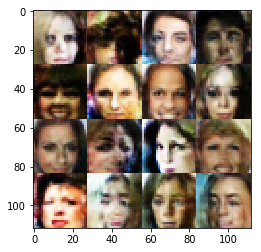

Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.4233
Epoch 1/1... Discriminator Loss: 1.3772... Generator Loss: 0.4073
Epoch 1/1... Discriminator Loss: 1.8155... Generator Loss: 0.4857
Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 0.4719
Epoch 1/1... Discriminator Loss: 0.9671... Generator Loss: 0.9214
Epoch 1/1... Discriminator Loss: 1.4708... Generator Loss: 0.5559
Epoch 1/1... Discriminator Loss: 1.6720... Generator Loss: 0.4380
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.5337
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.5832
Epoch 1/1... Discriminator Loss: 1.1488... Generator Loss: 0.6673


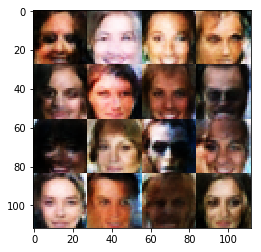

Epoch 1/1... Discriminator Loss: 1.2737... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.6257... Generator Loss: 0.3566
Epoch 1/1... Discriminator Loss: 1.1021... Generator Loss: 0.6593
Epoch 1/1... Discriminator Loss: 1.7529... Generator Loss: 0.8301
Epoch 1/1... Discriminator Loss: 0.8536... Generator Loss: 0.9661
Epoch 1/1... Discriminator Loss: 1.7661... Generator Loss: 0.7860
Epoch 1/1... Discriminator Loss: 1.4898... Generator Loss: 0.5388
Epoch 1/1... Discriminator Loss: 1.4693... Generator Loss: 0.3744
Epoch 1/1... Discriminator Loss: 1.4407... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.3510... Generator Loss: 0.5705


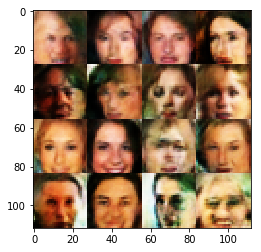

Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.5034
Epoch 1/1... Discriminator Loss: 1.3067... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.6962... Generator Loss: 0.4741
Epoch 1/1... Discriminator Loss: 1.6495... Generator Loss: 0.4204
Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.4611
Epoch 1/1... Discriminator Loss: 1.3244... Generator Loss: 0.6594
Epoch 1/1... Discriminator Loss: 2.6935... Generator Loss: 0.5168
Epoch 1/1... Discriminator Loss: 1.4460... Generator Loss: 0.5344
Epoch 1/1... Discriminator Loss: 0.8601... Generator Loss: 0.9723
Epoch 1/1... Discriminator Loss: 1.8985... Generator Loss: 0.4520


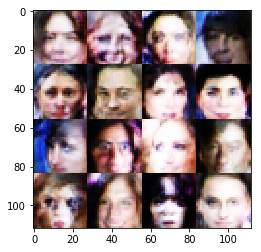

Epoch 1/1... Discriminator Loss: 1.9748... Generator Loss: 0.2217
Epoch 1/1... Discriminator Loss: 1.8545... Generator Loss: 0.4288
Epoch 1/1... Discriminator Loss: 1.5472... Generator Loss: 0.4362
Epoch 1/1... Discriminator Loss: 0.9908... Generator Loss: 0.7467
Epoch 1/1... Discriminator Loss: 1.4753... Generator Loss: 0.5634
Epoch 1/1... Discriminator Loss: 1.3167... Generator Loss: 0.5718
Epoch 1/1... Discriminator Loss: 1.6276... Generator Loss: 0.4541
Epoch 1/1... Discriminator Loss: 1.5880... Generator Loss: 0.5651
Epoch 1/1... Discriminator Loss: 1.2390... Generator Loss: 0.7654
Epoch 1/1... Discriminator Loss: 1.0683... Generator Loss: 0.7156


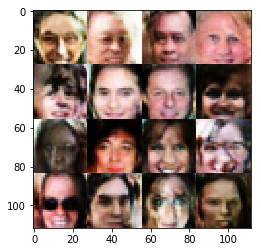

Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.6360
Epoch 1/1... Discriminator Loss: 0.7478... Generator Loss: 0.9265
Epoch 1/1... Discriminator Loss: 2.0787... Generator Loss: 0.5025
Epoch 1/1... Discriminator Loss: 1.2702... Generator Loss: 0.5834
Epoch 1/1... Discriminator Loss: 1.4433... Generator Loss: 0.6453
Epoch 1/1... Discriminator Loss: 1.1133... Generator Loss: 0.6450
Epoch 1/1... Discriminator Loss: 1.4882... Generator Loss: 0.5111
Epoch 1/1... Discriminator Loss: 1.7913... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.1939... Generator Loss: 0.5057
Epoch 1/1... Discriminator Loss: 1.1410... Generator Loss: 0.6953


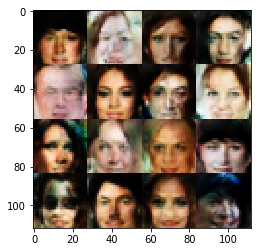

Epoch 1/1... Discriminator Loss: 1.7093... Generator Loss: 0.4747
Epoch 1/1... Discriminator Loss: 1.5430... Generator Loss: 0.3961
Epoch 1/1... Discriminator Loss: 1.6943... Generator Loss: 0.5342
Epoch 1/1... Discriminator Loss: 1.1070... Generator Loss: 0.9216
Epoch 1/1... Discriminator Loss: 1.2599... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.5499
Epoch 1/1... Discriminator Loss: 1.5285... Generator Loss: 0.6479
Epoch 1/1... Discriminator Loss: 1.2537... Generator Loss: 1.0106
Epoch 1/1... Discriminator Loss: 1.4286... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.0751... Generator Loss: 0.4793


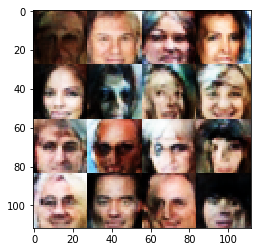

Epoch 1/1... Discriminator Loss: 1.2396... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 2.0158... Generator Loss: 0.3287
Epoch 1/1... Discriminator Loss: 1.5936... Generator Loss: 0.3549
Epoch 1/1... Discriminator Loss: 1.4707... Generator Loss: 0.5776
Epoch 1/1... Discriminator Loss: 1.8501... Generator Loss: 0.4381
Epoch 1/1... Discriminator Loss: 0.8337... Generator Loss: 0.8489
Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 0.6962
Epoch 1/1... Discriminator Loss: 1.5547... Generator Loss: 0.5276
Epoch 1/1... Discriminator Loss: 1.5842... Generator Loss: 0.5693
Epoch 1/1... Discriminator Loss: 0.9138... Generator Loss: 0.8517


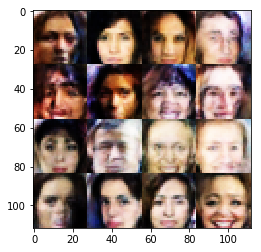

Epoch 1/1... Discriminator Loss: 2.3543... Generator Loss: 0.2307
Epoch 1/1... Discriminator Loss: 1.7743... Generator Loss: 0.4952
Epoch 1/1... Discriminator Loss: 2.0731... Generator Loss: 0.2673
Epoch 1/1... Discriminator Loss: 0.9612... Generator Loss: 0.7228
Epoch 1/1... Discriminator Loss: 1.8695... Generator Loss: 0.4683
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.5040
Epoch 1/1... Discriminator Loss: 1.6972... Generator Loss: 0.5788
Epoch 1/1... Discriminator Loss: 1.6928... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 0.6583
Epoch 1/1... Discriminator Loss: 1.2125... Generator Loss: 0.5835


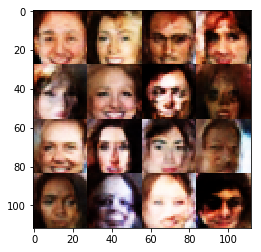

Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.4524
Epoch 1/1... Discriminator Loss: 1.8125... Generator Loss: 0.4012
Epoch 1/1... Discriminator Loss: 1.5779... Generator Loss: 0.6494
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.5415
Epoch 1/1... Discriminator Loss: 0.9400... Generator Loss: 0.9075
Epoch 1/1... Discriminator Loss: 1.2497... Generator Loss: 0.6380
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.4344
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.6135
Epoch 1/1... Discriminator Loss: 1.5359... Generator Loss: 0.5220
Epoch 1/1... Discriminator Loss: 1.6262... Generator Loss: 0.6517


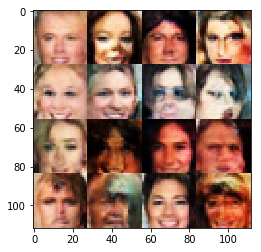

Epoch 1/1... Discriminator Loss: 1.2437... Generator Loss: 0.5968
Epoch 1/1... Discriminator Loss: 0.9943... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 2.0460... Generator Loss: 0.5175
Epoch 1/1... Discriminator Loss: 1.2707... Generator Loss: 0.6485
Epoch 1/1... Discriminator Loss: 1.0900... Generator Loss: 0.8746
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.5123... Generator Loss: 0.7211
Epoch 1/1... Discriminator Loss: 1.3523... Generator Loss: 0.5889
Epoch 1/1... Discriminator Loss: 1.6779... Generator Loss: 0.4279
Epoch 1/1... Discriminator Loss: 1.7329... Generator Loss: 0.4597


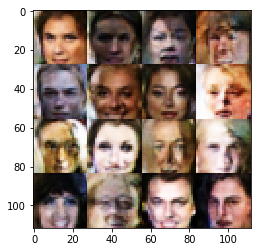

Epoch 1/1... Discriminator Loss: 1.5853... Generator Loss: 0.6087
Epoch 1/1... Discriminator Loss: 1.5773... Generator Loss: 0.4943
Epoch 1/1... Discriminator Loss: 1.5609... Generator Loss: 0.3977
Epoch 1/1... Discriminator Loss: 1.3258... Generator Loss: 0.6079
Epoch 1/1... Discriminator Loss: 0.7798... Generator Loss: 0.8669
Epoch 1/1... Discriminator Loss: 1.2505... Generator Loss: 0.6999
Epoch 1/1... Discriminator Loss: 1.5325... Generator Loss: 0.4929
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.4688
Epoch 1/1... Discriminator Loss: 1.4525... Generator Loss: 0.4512
Epoch 1/1... Discriminator Loss: 0.8333... Generator Loss: 1.4013


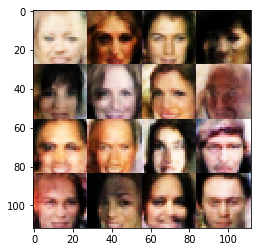

Epoch 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.5620
Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.5195
Epoch 1/1... Discriminator Loss: 1.2596... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.4997... Generator Loss: 0.4479
Epoch 1/1... Discriminator Loss: 1.5476... Generator Loss: 0.6929
Epoch 1/1... Discriminator Loss: 1.3383... Generator Loss: 0.6103
Epoch 1/1... Discriminator Loss: 1.9077... Generator Loss: 0.4984
Epoch 1/1... Discriminator Loss: 1.5920... Generator Loss: 0.4347
Epoch 1/1... Discriminator Loss: 1.2765... Generator Loss: 0.5336
Epoch 1/1... Discriminator Loss: 1.8276... Generator Loss: 0.4106


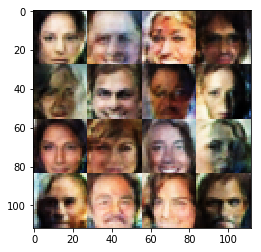

Epoch 1/1... Discriminator Loss: 1.2520... Generator Loss: 0.6809
Epoch 1/1... Discriminator Loss: 1.0044... Generator Loss: 0.5441
Epoch 1/1... Discriminator Loss: 1.1115... Generator Loss: 0.8490
Epoch 1/1... Discriminator Loss: 1.4906... Generator Loss: 0.4196
Epoch 1/1... Discriminator Loss: 1.7450... Generator Loss: 0.4256
Epoch 1/1... Discriminator Loss: 1.5390... Generator Loss: 0.6149
Epoch 1/1... Discriminator Loss: 1.7863... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.4047... Generator Loss: 0.6227
Epoch 1/1... Discriminator Loss: 1.1644... Generator Loss: 0.7160
Epoch 1/1... Discriminator Loss: 1.1033... Generator Loss: 0.8717


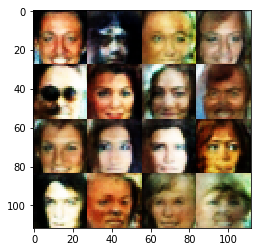

Epoch 1/1... Discriminator Loss: 1.4480... Generator Loss: 0.5537
Epoch 1/1... Discriminator Loss: 0.8735... Generator Loss: 1.0712
Epoch 1/1... Discriminator Loss: 1.5015... Generator Loss: 0.4207
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 1.6873... Generator Loss: 0.5840
Epoch 1/1... Discriminator Loss: 0.8105... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.7277... Generator Loss: 0.4607
Epoch 1/1... Discriminator Loss: 1.0233... Generator Loss: 0.6718
Epoch 1/1... Discriminator Loss: 1.4999... Generator Loss: 0.4377
Epoch 1/1... Discriminator Loss: 1.5081... Generator Loss: 0.7538


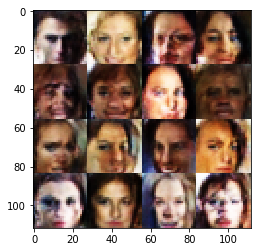

Epoch 1/1... Discriminator Loss: 1.1106... Generator Loss: 0.6694
Epoch 1/1... Discriminator Loss: 1.4855... Generator Loss: 0.4694
Epoch 1/1... Discriminator Loss: 1.4359... Generator Loss: 0.5896
Epoch 1/1... Discriminator Loss: 1.3879... Generator Loss: 0.5487
Epoch 1/1... Discriminator Loss: 0.9850... Generator Loss: 0.8356
Epoch 1/1... Discriminator Loss: 1.6590... Generator Loss: 0.4445
Epoch 1/1... Discriminator Loss: 1.5094... Generator Loss: 0.6300
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 0.4794
Epoch 1/1... Discriminator Loss: 1.7258... Generator Loss: 0.5592
Epoch 1/1... Discriminator Loss: 1.5451... Generator Loss: 0.4767


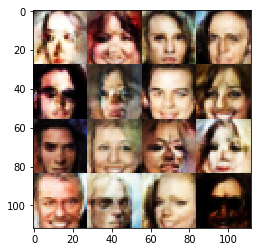

Epoch 1/1... Discriminator Loss: 1.3405... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.5733... Generator Loss: 0.5354
Epoch 1/1... Discriminator Loss: 1.5678... Generator Loss: 0.4342
Epoch 1/1... Discriminator Loss: 1.3076... Generator Loss: 0.6550
Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.6422
Epoch 1/1... Discriminator Loss: 1.2297... Generator Loss: 0.5710
Epoch 1/1... Discriminator Loss: 2.0125... Generator Loss: 0.3557
Epoch 1/1... Discriminator Loss: 1.8585... Generator Loss: 0.5232
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.1286... Generator Loss: 0.9314


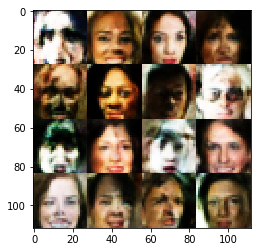

Epoch 1/1... Discriminator Loss: 0.9829... Generator Loss: 0.7577
Epoch 1/1... Discriminator Loss: 1.3699... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.5003
Epoch 1/1... Discriminator Loss: 1.3444... Generator Loss: 0.5838
Epoch 1/1... Discriminator Loss: 1.8249... Generator Loss: 0.2796
Epoch 1/1... Discriminator Loss: 1.5526... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.7145... Generator Loss: 0.3626
Epoch 1/1... Discriminator Loss: 1.2562... Generator Loss: 0.8002
Epoch 1/1... Discriminator Loss: 1.4979... Generator Loss: 0.4586
Epoch 1/1... Discriminator Loss: 1.3691... Generator Loss: 0.4541


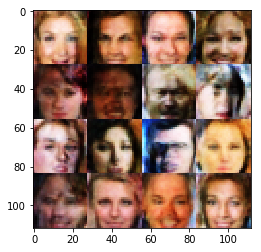

Epoch 1/1... Discriminator Loss: 0.7516... Generator Loss: 0.8302
Epoch 1/1... Discriminator Loss: 1.2662... Generator Loss: 0.4863
Epoch 1/1... Discriminator Loss: 1.6687... Generator Loss: 0.5547
Epoch 1/1... Discriminator Loss: 1.3076... Generator Loss: 0.5981
Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.6198
Epoch 1/1... Discriminator Loss: 1.5649... Generator Loss: 0.5561
Epoch 1/1... Discriminator Loss: 1.7218... Generator Loss: 0.5198
Epoch 1/1... Discriminator Loss: 1.1226... Generator Loss: 0.6140
Epoch 1/1... Discriminator Loss: 1.0946... Generator Loss: 0.9066
Epoch 1/1... Discriminator Loss: 0.7153... Generator Loss: 0.9326


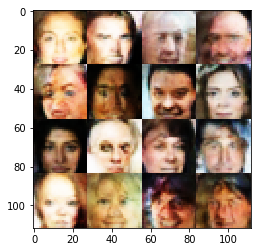

Epoch 1/1... Discriminator Loss: 1.0875... Generator Loss: 0.8140
Epoch 1/1... Discriminator Loss: 1.1615... Generator Loss: 0.5624
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.5344
Epoch 1/1... Discriminator Loss: 1.5583... Generator Loss: 0.6337
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.1172... Generator Loss: 0.6998
Epoch 1/1... Discriminator Loss: 1.0024... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.0552... Generator Loss: 0.8375
Epoch 1/1... Discriminator Loss: 1.1261... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.4690


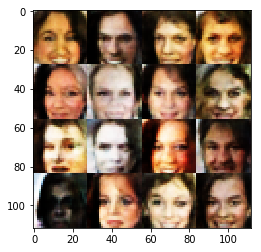

Epoch 1/1... Discriminator Loss: 0.7377... Generator Loss: 1.0582
Epoch 1/1... Discriminator Loss: 1.2792... Generator Loss: 0.8333
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.4632
Epoch 1/1... Discriminator Loss: 1.8317... Generator Loss: 0.2680
Epoch 1/1... Discriminator Loss: 1.6044... Generator Loss: 0.4502
Epoch 1/1... Discriminator Loss: 1.2538... Generator Loss: 0.8691
Epoch 1/1... Discriminator Loss: 1.5701... Generator Loss: 0.6408
Epoch 1/1... Discriminator Loss: 1.7279... Generator Loss: 0.3739
Epoch 1/1... Discriminator Loss: 1.1257... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.4591


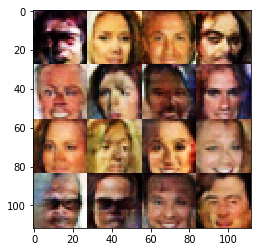

Epoch 1/1... Discriminator Loss: 1.2717... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.8281... Generator Loss: 0.6786
Epoch 1/1... Discriminator Loss: 0.9865... Generator Loss: 1.0337
Epoch 1/1... Discriminator Loss: 1.5732... Generator Loss: 0.5057
Epoch 1/1... Discriminator Loss: 1.2812... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.4522
Epoch 1/1... Discriminator Loss: 1.8867... Generator Loss: 0.4873
Epoch 1/1... Discriminator Loss: 1.5861... Generator Loss: 0.5844
Epoch 1/1... Discriminator Loss: 1.1935... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.5319


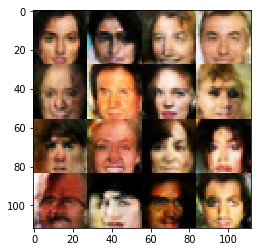

Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.5869
Epoch 1/1... Discriminator Loss: 1.0054... Generator Loss: 0.8962
Epoch 1/1... Discriminator Loss: 1.6886... Generator Loss: 0.4986
Epoch 1/1... Discriminator Loss: 1.7927... Generator Loss: 0.5749
Epoch 1/1... Discriminator Loss: 1.5121... Generator Loss: 0.5180
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.6097
Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.5021
Epoch 1/1... Discriminator Loss: 1.6858... Generator Loss: 0.5116
Epoch 1/1... Discriminator Loss: 1.2931... Generator Loss: 0.4754
Epoch 1/1... Discriminator Loss: 1.2611... Generator Loss: 0.5840


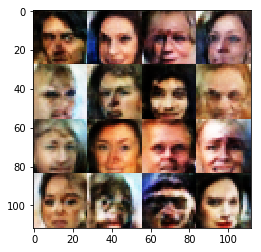

Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 1.3661... Generator Loss: 0.6067
Epoch 1/1... Discriminator Loss: 1.3096... Generator Loss: 0.5354
Epoch 1/1... Discriminator Loss: 1.5940... Generator Loss: 0.6967
Epoch 1/1... Discriminator Loss: 2.2624... Generator Loss: 0.4120
Epoch 1/1... Discriminator Loss: 1.0951... Generator Loss: 0.6493
Epoch 1/1... Discriminator Loss: 0.8792... Generator Loss: 0.8189
Epoch 1/1... Discriminator Loss: 1.6077... Generator Loss: 0.8198
Epoch 1/1... Discriminator Loss: 1.3197... Generator Loss: 0.6576
Epoch 1/1... Discriminator Loss: 1.0095... Generator Loss: 0.8245


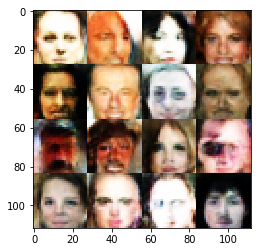

Epoch 1/1... Discriminator Loss: 1.5019... Generator Loss: 0.5249
Epoch 1/1... Discriminator Loss: 1.1393... Generator Loss: 0.6913
Epoch 1/1... Discriminator Loss: 1.3795... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.0408... Generator Loss: 1.0818
Epoch 1/1... Discriminator Loss: 1.2742... Generator Loss: 0.5418
Epoch 1/1... Discriminator Loss: 1.6515... Generator Loss: 0.4333
Epoch 1/1... Discriminator Loss: 1.0157... Generator Loss: 0.8783
Epoch 1/1... Discriminator Loss: 1.1444... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 0.7169
Epoch 1/1... Discriminator Loss: 1.7711... Generator Loss: 0.5713


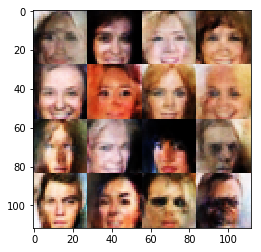

Epoch 1/1... Discriminator Loss: 1.6689... Generator Loss: 0.5029
Epoch 1/1... Discriminator Loss: 1.0278... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 1.4963... Generator Loss: 0.4580
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.6086
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.6481
Epoch 1/1... Discriminator Loss: 1.6494... Generator Loss: 0.5007
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 0.4421
Epoch 1/1... Discriminator Loss: 1.3881... Generator Loss: 0.4138
Epoch 1/1... Discriminator Loss: 1.5307... Generator Loss: 0.3551
Epoch 1/1... Discriminator Loss: 1.8915... Generator Loss: 0.5251


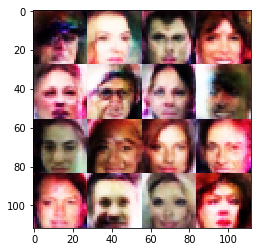

Epoch 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.4703
Epoch 1/1... Discriminator Loss: 1.1577... Generator Loss: 0.6875
Epoch 1/1... Discriminator Loss: 1.5756... Generator Loss: 0.6226
Epoch 1/1... Discriminator Loss: 0.9249... Generator Loss: 1.0494
Epoch 1/1... Discriminator Loss: 1.5836... Generator Loss: 0.4383
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.6513
Epoch 1/1... Discriminator Loss: 0.8485... Generator Loss: 0.8194
Epoch 1/1... Discriminator Loss: 1.8920... Generator Loss: 0.6544
Epoch 1/1... Discriminator Loss: 1.1580... Generator Loss: 0.5822
Epoch 1/1... Discriminator Loss: 0.7807... Generator Loss: 0.8165


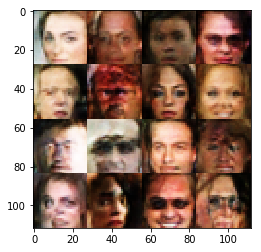

Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.6108
Epoch 1/1... Discriminator Loss: 1.0021... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 1.1966... Generator Loss: 0.9797
Epoch 1/1... Discriminator Loss: 1.6101... Generator Loss: 0.5578
Epoch 1/1... Discriminator Loss: 1.1559... Generator Loss: 1.0434
Epoch 1/1... Discriminator Loss: 1.7394... Generator Loss: 0.6211
Epoch 1/1... Discriminator Loss: 1.7221... Generator Loss: 0.5013
Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 0.6502
Epoch 1/1... Discriminator Loss: 1.6423... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.5804... Generator Loss: 0.5998


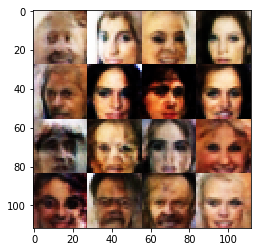

Epoch 1/1... Discriminator Loss: 1.2186... Generator Loss: 0.8197
Epoch 1/1... Discriminator Loss: 1.3550... Generator Loss: 0.5815
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.5342
Epoch 1/1... Discriminator Loss: 1.4644... Generator Loss: 0.6041
Epoch 1/1... Discriminator Loss: 1.1712... Generator Loss: 0.5943
Epoch 1/1... Discriminator Loss: 1.4797... Generator Loss: 0.6370
Epoch 1/1... Discriminator Loss: 0.9797... Generator Loss: 0.7111
Epoch 1/1... Discriminator Loss: 1.8638... Generator Loss: 0.4889
Epoch 1/1... Discriminator Loss: 1.5538... Generator Loss: 0.5611
Epoch 1/1... Discriminator Loss: 1.8153... Generator Loss: 0.4341


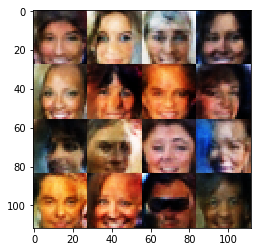

Epoch 1/1... Discriminator Loss: 2.1639... Generator Loss: 0.2940
Epoch 1/1... Discriminator Loss: 1.3552... Generator Loss: 0.6421
Epoch 1/1... Discriminator Loss: 1.3595... Generator Loss: 0.5986
Epoch 1/1... Discriminator Loss: 0.7367... Generator Loss: 0.8561
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.5337
Epoch 1/1... Discriminator Loss: 1.3105... Generator Loss: 0.4944
Epoch 1/1... Discriminator Loss: 1.5018... Generator Loss: 0.4874
Epoch 1/1... Discriminator Loss: 1.0522... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.7025... Generator Loss: 0.5255
Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 0.6536


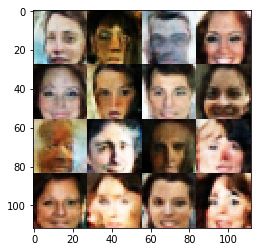

Epoch 1/1... Discriminator Loss: 2.0990... Generator Loss: 0.3273
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.5723
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.5009
Epoch 1/1... Discriminator Loss: 1.1500... Generator Loss: 0.7522
Epoch 1/1... Discriminator Loss: 0.8235... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 1.8606... Generator Loss: 0.5270
Epoch 1/1... Discriminator Loss: 1.0758... Generator Loss: 0.5725
Epoch 1/1... Discriminator Loss: 1.2386... Generator Loss: 0.6480
Epoch 1/1... Discriminator Loss: 1.7122... Generator Loss: 0.4433


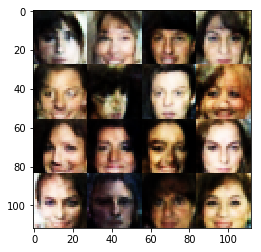

Epoch 1/1... Discriminator Loss: 1.5439... Generator Loss: 0.4385
Epoch 1/1... Discriminator Loss: 1.5838... Generator Loss: 0.8303
Epoch 1/1... Discriminator Loss: 1.5141... Generator Loss: 0.4980
Epoch 1/1... Discriminator Loss: 1.0591... Generator Loss: 0.9151
Epoch 1/1... Discriminator Loss: 0.9210... Generator Loss: 0.6665
Epoch 1/1... Discriminator Loss: 1.4656... Generator Loss: 0.6190
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.5451
Epoch 1/1... Discriminator Loss: 1.4462... Generator Loss: 0.6543
Epoch 1/1... Discriminator Loss: 1.1411... Generator Loss: 0.6208
Epoch 1/1... Discriminator Loss: 1.2006... Generator Loss: 0.5289


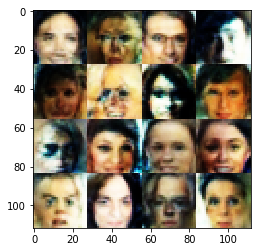

Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.5778
Epoch 1/1... Discriminator Loss: 1.4806... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 0.9099... Generator Loss: 0.7663
Epoch 1/1... Discriminator Loss: 2.0142... Generator Loss: 0.3395
Epoch 1/1... Discriminator Loss: 1.6679... Generator Loss: 0.4314
Epoch 1/1... Discriminator Loss: 1.7161... Generator Loss: 0.4991
Epoch 1/1... Discriminator Loss: 1.1533... Generator Loss: 0.6470
Epoch 1/1... Discriminator Loss: 1.5809... Generator Loss: 0.4393
Epoch 1/1... Discriminator Loss: 1.4263... Generator Loss: 0.5364
Epoch 1/1... Discriminator Loss: 1.5689... Generator Loss: 0.4788


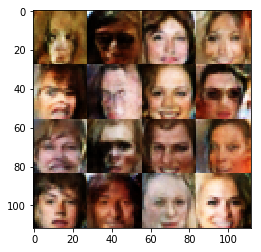

Epoch 1/1... Discriminator Loss: 1.7054... Generator Loss: 0.5833
Epoch 1/1... Discriminator Loss: 2.2559... Generator Loss: 0.3455
Epoch 1/1... Discriminator Loss: 1.4687... Generator Loss: 0.5593
Epoch 1/1... Discriminator Loss: 0.8402... Generator Loss: 0.9104
Epoch 1/1... Discriminator Loss: 1.3768... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.8402... Generator Loss: 0.3670
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.5845
Epoch 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.2686... Generator Loss: 0.6185
Epoch 1/1... Discriminator Loss: 1.2004... Generator Loss: 0.6977


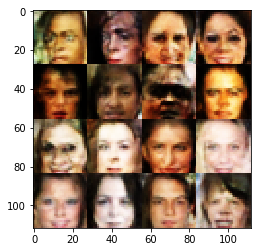

Epoch 1/1... Discriminator Loss: 1.8852... Generator Loss: 0.4849
Epoch 1/1... Discriminator Loss: 1.0502... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.3226... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.2419... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.5270... Generator Loss: 0.5113
Epoch 1/1... Discriminator Loss: 0.9856... Generator Loss: 0.7710
Epoch 1/1... Discriminator Loss: 1.6420... Generator Loss: 0.5898
Epoch 1/1... Discriminator Loss: 1.3301... Generator Loss: 0.5522
Epoch 1/1... Discriminator Loss: 1.5241... Generator Loss: 0.5221
Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.6086


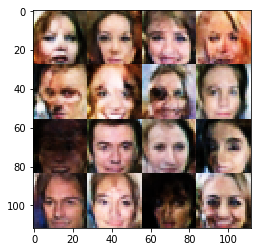

Epoch 1/1... Discriminator Loss: 1.2575... Generator Loss: 0.5493
Epoch 1/1... Discriminator Loss: 1.4715... Generator Loss: 0.4505
Epoch 1/1... Discriminator Loss: 1.1790... Generator Loss: 0.6251
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.7002
Epoch 1/1... Discriminator Loss: 1.7597... Generator Loss: 0.4754
Epoch 1/1... Discriminator Loss: 1.5776... Generator Loss: 0.5997
Epoch 1/1... Discriminator Loss: 1.0491... Generator Loss: 0.7701
Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 0.7747
Epoch 1/1... Discriminator Loss: 1.2265... Generator Loss: 0.6118
Epoch 1/1... Discriminator Loss: 1.3219... Generator Loss: 0.7027


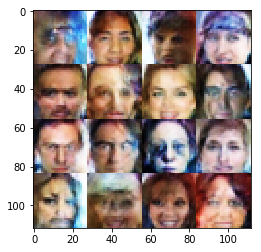

Epoch 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.4991
Epoch 1/1... Discriminator Loss: 2.0033... Generator Loss: 0.4080
Epoch 1/1... Discriminator Loss: 1.2435... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.6851... Generator Loss: 0.6535
Epoch 1/1... Discriminator Loss: 1.7610... Generator Loss: 0.5985
Epoch 1/1... Discriminator Loss: 1.2914... Generator Loss: 0.7672
Epoch 1/1... Discriminator Loss: 1.4683... Generator Loss: 0.4725
Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.5866
Epoch 1/1... Discriminator Loss: 1.1682... Generator Loss: 0.7068
Epoch 1/1... Discriminator Loss: 1.2245... Generator Loss: 0.8521


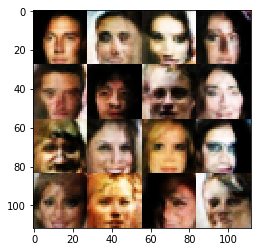

Epoch 1/1... Discriminator Loss: 1.3012... Generator Loss: 0.6381
Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 0.7422
Epoch 1/1... Discriminator Loss: 1.7430... Generator Loss: 0.4681
Epoch 1/1... Discriminator Loss: 1.4335... Generator Loss: 0.4885
Epoch 1/1... Discriminator Loss: 1.1462... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 1.1853... Generator Loss: 0.6458
Epoch 1/1... Discriminator Loss: 1.5213... Generator Loss: 0.6164
Epoch 1/1... Discriminator Loss: 1.1669... Generator Loss: 0.5992
Epoch 1/1... Discriminator Loss: 0.7929... Generator Loss: 1.2497
Epoch 1/1... Discriminator Loss: 1.7182... Generator Loss: 0.3438


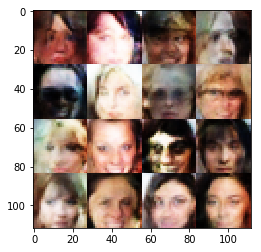

Epoch 1/1... Discriminator Loss: 1.4235... Generator Loss: 0.6085
Epoch 1/1... Discriminator Loss: 1.5757... Generator Loss: 0.4303
Epoch 1/1... Discriminator Loss: 1.0021... Generator Loss: 0.6541
Epoch 1/1... Discriminator Loss: 1.3726... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.0175... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 1.1954... Generator Loss: 0.8287
Epoch 1/1... Discriminator Loss: 1.6162... Generator Loss: 0.3992
Epoch 1/1... Discriminator Loss: 1.2943... Generator Loss: 0.6193
Epoch 1/1... Discriminator Loss: 1.2726... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 1.6248... Generator Loss: 0.4180


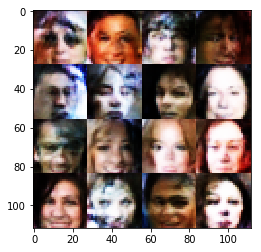

Epoch 1/1... Discriminator Loss: 1.7437... Generator Loss: 0.6281
Epoch 1/1... Discriminator Loss: 1.0482... Generator Loss: 0.7893
Epoch 1/1... Discriminator Loss: 1.5613... Generator Loss: 0.5120
Epoch 1/1... Discriminator Loss: 1.2373... Generator Loss: 0.6252
Epoch 1/1... Discriminator Loss: 1.1986... Generator Loss: 0.5558
Epoch 1/1... Discriminator Loss: 1.2481... Generator Loss: 0.6251
Epoch 1/1... Discriminator Loss: 1.5149... Generator Loss: 0.4918
Epoch 1/1... Discriminator Loss: 0.9695... Generator Loss: 0.8283
Epoch 1/1... Discriminator Loss: 1.0615... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.3100... Generator Loss: 0.7336


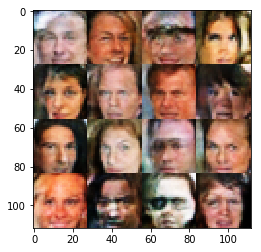

Epoch 1/1... Discriminator Loss: 1.5695... Generator Loss: 0.4307
Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.4423
Epoch 1/1... Discriminator Loss: 1.0546... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.5921
Epoch 1/1... Discriminator Loss: 1.5585... Generator Loss: 0.5781
Epoch 1/1... Discriminator Loss: 1.3288... Generator Loss: 0.5709
Epoch 1/1... Discriminator Loss: 1.2472... Generator Loss: 0.5593
Epoch 1/1... Discriminator Loss: 1.5245... Generator Loss: 0.5162
Epoch 1/1... Discriminator Loss: 1.5589... Generator Loss: 0.5193
Epoch 1/1... Discriminator Loss: 1.6685... Generator Loss: 0.5621


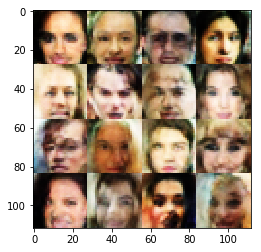

Epoch 1/1... Discriminator Loss: 1.7413... Generator Loss: 0.5419
Epoch 1/1... Discriminator Loss: 1.3035... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.6069
Epoch 1/1... Discriminator Loss: 1.0950... Generator Loss: 0.6876
Epoch 1/1... Discriminator Loss: 1.6621... Generator Loss: 0.6208
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.5417
Epoch 1/1... Discriminator Loss: 1.5403... Generator Loss: 0.5995
Epoch 1/1... Discriminator Loss: 1.6718... Generator Loss: 0.6674
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.5748
Epoch 1/1... Discriminator Loss: 1.4916... Generator Loss: 0.6191


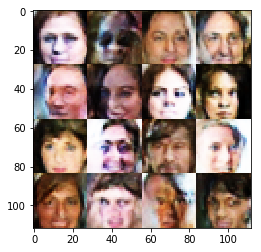

Epoch 1/1... Discriminator Loss: 0.8787... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.1101... Generator Loss: 0.5749
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.7443
Epoch 1/1... Discriminator Loss: 1.2560... Generator Loss: 0.4430
Epoch 1/1... Discriminator Loss: 1.1219... Generator Loss: 1.0297
Epoch 1/1... Discriminator Loss: 1.2790... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 0.8898... Generator Loss: 0.8126
Epoch 1/1... Discriminator Loss: 1.1112... Generator Loss: 0.6206
Epoch 1/1... Discriminator Loss: 1.1333... Generator Loss: 0.6519


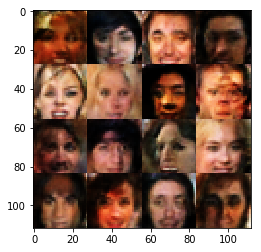

Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.5839
Epoch 1/1... Discriminator Loss: 0.9594... Generator Loss: 0.9768
Epoch 1/1... Discriminator Loss: 1.9153... Generator Loss: 0.5247
Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.4650
Epoch 1/1... Discriminator Loss: 0.9949... Generator Loss: 0.8123
Epoch 1/1... Discriminator Loss: 1.7179... Generator Loss: 0.4734
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.6278
Epoch 1/1... Discriminator Loss: 1.5548... Generator Loss: 0.4007
Epoch 1/1... Discriminator Loss: 2.0653... Generator Loss: 0.3804
Epoch 1/1... Discriminator Loss: 1.6869... Generator Loss: 0.4998


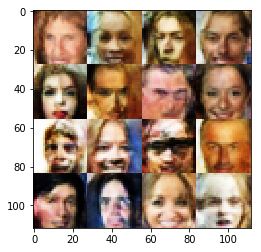

Epoch 1/1... Discriminator Loss: 1.5607... Generator Loss: 0.5959
Epoch 1/1... Discriminator Loss: 1.1777... Generator Loss: 0.7069
Epoch 1/1... Discriminator Loss: 1.4713... Generator Loss: 0.5823
Epoch 1/1... Discriminator Loss: 1.4922... Generator Loss: 0.6983
Epoch 1/1... Discriminator Loss: 1.9682... Generator Loss: 0.6769
Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.5715
Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 0.4532
Epoch 1/1... Discriminator Loss: 1.0181... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.0450... Generator Loss: 0.8914
Epoch 1/1... Discriminator Loss: 1.7901... Generator Loss: 0.4050


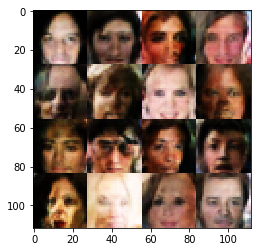

Epoch 1/1... Discriminator Loss: 1.7776... Generator Loss: 0.4241
Epoch 1/1... Discriminator Loss: 0.9566... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 2.0249... Generator Loss: 0.3580
Epoch 1/1... Discriminator Loss: 1.8116... Generator Loss: 0.5445
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.5169
Epoch 1/1... Discriminator Loss: 0.9769... Generator Loss: 0.5578
Epoch 1/1... Discriminator Loss: 1.8000... Generator Loss: 0.5436
Epoch 1/1... Discriminator Loss: 1.2780... Generator Loss: 0.7992
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.7035
Epoch 1/1... Discriminator Loss: 1.3708... Generator Loss: 0.5135


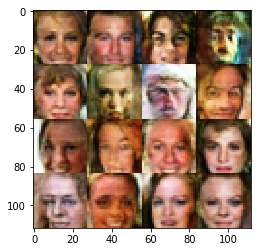

Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 0.8137
Epoch 1/1... Discriminator Loss: 1.5449... Generator Loss: 0.4671
Epoch 1/1... Discriminator Loss: 2.0814... Generator Loss: 0.4781
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.7905
Epoch 1/1... Discriminator Loss: 1.2752... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.4299... Generator Loss: 0.5537
Epoch 1/1... Discriminator Loss: 1.2874... Generator Loss: 0.8151
Epoch 1/1... Discriminator Loss: 1.5801... Generator Loss: 0.4654
Epoch 1/1... Discriminator Loss: 1.0074... Generator Loss: 0.6269
Epoch 1/1... Discriminator Loss: 1.2864... Generator Loss: 0.6609


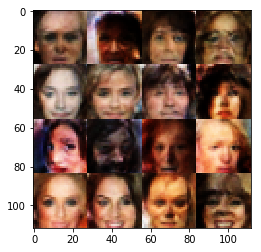

Epoch 1/1... Discriminator Loss: 2.2507... Generator Loss: 0.4183
Epoch 1/1... Discriminator Loss: 1.0694... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.5478
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.5813
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 0.5169
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.6223
Epoch 1/1... Discriminator Loss: 0.9752... Generator Loss: 0.5996
Epoch 1/1... Discriminator Loss: 1.2770... Generator Loss: 0.5614
Epoch 1/1... Discriminator Loss: 1.4271... Generator Loss: 0.5841


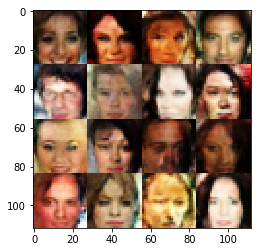

Epoch 1/1... Discriminator Loss: 1.0215... Generator Loss: 0.7512
Epoch 1/1... Discriminator Loss: 1.4614... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 0.9626... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 1.5544... Generator Loss: 0.5641
Epoch 1/1... Discriminator Loss: 1.7687... Generator Loss: 0.5862
Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 0.6544
Epoch 1/1... Discriminator Loss: 1.3512... Generator Loss: 0.5941
Epoch 1/1... Discriminator Loss: 1.6072... Generator Loss: 0.4560
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.3805
Epoch 1/1... Discriminator Loss: 1.0553... Generator Loss: 0.9533


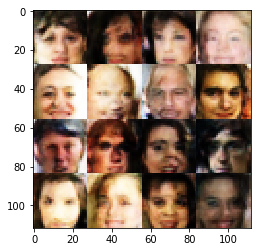

Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.8356
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.5901
Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 1.5352... Generator Loss: 0.5860
Epoch 1/1... Discriminator Loss: 1.5879... Generator Loss: 0.3357
Epoch 1/1... Discriminator Loss: 1.0798... Generator Loss: 0.5526
Epoch 1/1... Discriminator Loss: 1.7615... Generator Loss: 0.3821
Epoch 1/1... Discriminator Loss: 1.4521... Generator Loss: 0.4953
Epoch 1/1... Discriminator Loss: 1.4675... Generator Loss: 0.5508
Epoch 1/1... Discriminator Loss: 1.3262... Generator Loss: 0.6592


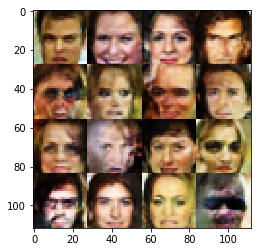

Epoch 1/1... Discriminator Loss: 0.9677... Generator Loss: 0.7574
Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.6399... Generator Loss: 0.6702
Epoch 1/1... Discriminator Loss: 1.3922... Generator Loss: 0.6202
Epoch 1/1... Discriminator Loss: 1.1272... Generator Loss: 0.6900
Epoch 1/1... Discriminator Loss: 1.4007... Generator Loss: 0.6172
Epoch 1/1... Discriminator Loss: 1.3959... Generator Loss: 0.6407
Epoch 1/1... Discriminator Loss: 1.6604... Generator Loss: 0.3615
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.4731
Epoch 1/1... Discriminator Loss: 1.1376... Generator Loss: 0.8284


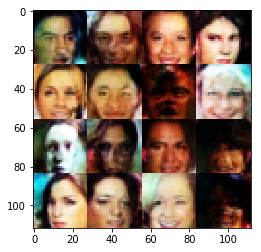

Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.6424
Epoch 1/1... Discriminator Loss: 1.9014... Generator Loss: 0.2949
Epoch 1/1... Discriminator Loss: 1.7098... Generator Loss: 0.3669
Epoch 1/1... Discriminator Loss: 1.6199... Generator Loss: 0.4368
Epoch 1/1... Discriminator Loss: 1.0884... Generator Loss: 0.6407
Epoch 1/1... Discriminator Loss: 1.5115... Generator Loss: 0.4955
Epoch 1/1... Discriminator Loss: 1.5018... Generator Loss: 0.6384
Epoch 1/1... Discriminator Loss: 1.1700... Generator Loss: 0.6263
Epoch 1/1... Discriminator Loss: 1.3375... Generator Loss: 0.5986
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.8294


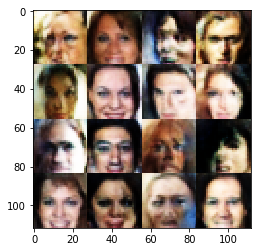

Epoch 1/1... Discriminator Loss: 1.3689... Generator Loss: 0.6742
Epoch 1/1... Discriminator Loss: 1.1376... Generator Loss: 0.6371
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.4977... Generator Loss: 0.6817
Epoch 1/1... Discriminator Loss: 1.9182... Generator Loss: 0.4211
Epoch 1/1... Discriminator Loss: 1.0173... Generator Loss: 0.7314
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.4484
Epoch 1/1... Discriminator Loss: 0.9225... Generator Loss: 0.7674
Epoch 1/1... Discriminator Loss: 1.1198... Generator Loss: 0.5869
Epoch 1/1... Discriminator Loss: 1.1634... Generator Loss: 0.5980


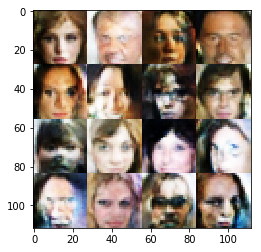

Epoch 1/1... Discriminator Loss: 1.5107... Generator Loss: 0.5986
Epoch 1/1... Discriminator Loss: 1.4076... Generator Loss: 0.5362
Epoch 1/1... Discriminator Loss: 1.5701... Generator Loss: 0.4696
Epoch 1/1... Discriminator Loss: 1.4795... Generator Loss: 0.4418
Epoch 1/1... Discriminator Loss: 1.1898... Generator Loss: 0.6940
Epoch 1/1... Discriminator Loss: 1.1523... Generator Loss: 0.6216
Epoch 1/1... Discriminator Loss: 1.1441... Generator Loss: 0.6468
Epoch 1/1... Discriminator Loss: 1.5278... Generator Loss: 0.6869
Epoch 1/1... Discriminator Loss: 1.2821... Generator Loss: 0.6185
Epoch 1/1... Discriminator Loss: 1.0948... Generator Loss: 0.7717


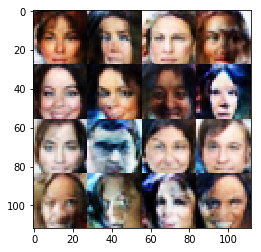

Epoch 1/1... Discriminator Loss: 1.8952... Generator Loss: 0.4717
Epoch 1/1... Discriminator Loss: 1.6343... Generator Loss: 0.5054
Epoch 1/1... Discriminator Loss: 1.2599... Generator Loss: 0.5885
Epoch 1/1... Discriminator Loss: 1.8807... Generator Loss: 0.4609
Epoch 1/1... Discriminator Loss: 1.5155... Generator Loss: 0.6392
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.7081... Generator Loss: 0.5795
Epoch 1/1... Discriminator Loss: 1.3680... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 1.7225... Generator Loss: 0.4962
Epoch 1/1... Discriminator Loss: 1.0828... Generator Loss: 1.0359


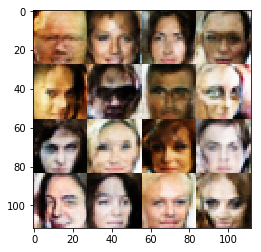

Epoch 1/1... Discriminator Loss: 1.7221... Generator Loss: 0.4900
Epoch 1/1... Discriminator Loss: 1.2814... Generator Loss: 0.6441
Epoch 1/1... Discriminator Loss: 1.5784... Generator Loss: 0.5622
Epoch 1/1... Discriminator Loss: 1.4647... Generator Loss: 0.5825
Epoch 1/1... Discriminator Loss: 2.1874... Generator Loss: 0.2588
Epoch 1/1... Discriminator Loss: 1.5393... Generator Loss: 0.5147
Epoch 1/1... Discriminator Loss: 1.3948... Generator Loss: 0.5384
Epoch 1/1... Discriminator Loss: 1.6066... Generator Loss: 0.4889
Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.6062
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.6249


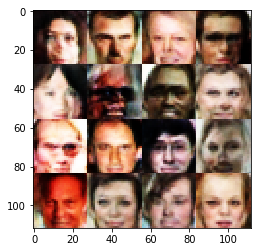

Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.7390
Epoch 1/1... Discriminator Loss: 1.6711... Generator Loss: 0.8575
Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 0.7439
Epoch 1/1... Discriminator Loss: 1.1192... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 2.3821... Generator Loss: 0.3341
Epoch 1/1... Discriminator Loss: 2.1063... Generator Loss: 0.3693
Epoch 1/1... Discriminator Loss: 0.8341... Generator Loss: 0.8520
Epoch 1/1... Discriminator Loss: 1.6556... Generator Loss: 0.7875
Epoch 1/1... Discriminator Loss: 2.0842... Generator Loss: 0.5763
Epoch 1/1... Discriminator Loss: 0.8665... Generator Loss: 0.9548


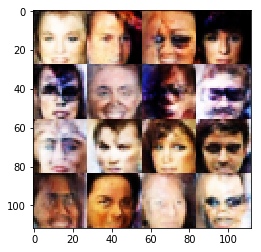

Epoch 1/1... Discriminator Loss: 3.2978... Generator Loss: 0.0696
Epoch 1/1... Discriminator Loss: 2.0519... Generator Loss: 0.3206
Epoch 1/1... Discriminator Loss: 1.8817... Generator Loss: 0.4235
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.4972
Epoch 1/1... Discriminator Loss: 0.8458... Generator Loss: 0.9327
Epoch 1/1... Discriminator Loss: 2.2492... Generator Loss: 0.5973


In [ ]:
batch_size = 4
z_dim = 100
learning_rate = 0.000035
beta1 = 0.6


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.